## ⚠️ Important Notes Before You Begin

This project was created as part of the **Biomedical Signal Processing** course at the **Faculty of Engineering, Helwan University – Biomedical Engineering Department**.

Each section in this notebook includes its own instructions and context, so we kindly ask you to read everything carefully to get the most out of it.

We’re still students on a learning journey — not professionals (yet 😉) — so if you have ideas for improvement or feedback, feel free to leave a comment. We’d love to hear from you!

And finally…  
🧪 **Please don’t try this at home.**  
(Yes, seriously. And also... no, not really. But maybe, just don't. 😂)

# Install Packages
Run this cell if neurokit2 library is not on your machine or venv

In [ ]:
!pip install neurokit2

# Import Libraries

In [ ]:
import gc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Extract and Combine Data

We extracted data from both the `.pkl` files and the README files for each subject and combined them into a unified DataFrame for easier analysis.

### Chest Signals and Labels

We began by extracting the chest signals and their corresponding labels. Since both were recorded at the same sampling rate (700 Hz), aligning them was straightforward.

### Wrist Signals

The challenge was aligning the wrist signals with the labels, as the wrist signals were recorded at varying sampling rates:

- **ACC**: 32 Hz  
- **BVP**: 64 Hz  
- **EDA and Temp**: 4 Hz  

To align them with the 700 Hz label sampling rate, we upsampled the wrist signals by introducing `NaN` values:

- **For Temp and EDA (4 Hz)**: Each second consists of 4 signal values. We expanded each value to be followed by 174 `NaN` values, resulting in 700 data points per second.  
  Example:  
        s1, 174x NaN, s2, 174x NaN, s3, 174x NaN, s4, 174x NaN

- **For ACC (32 Hz)**: Each value was followed by 21 `NaN` values, except the last one (s32), which had only 17 `NaN` values to make the total 700 points per second.  
    Example: 
        s1, 21x NaN, ..., s32, 17x NaN

- **For BVP (64 Hz)**: Similar to ACC, each value was followed by 10 `NaN` values, with the last one (s64) followed by only 6 `NaN` values.  

Before performing any feature extraction or signal processing, we removed the NaN values to restore the signal to its original form without any distortion.

This method allowed us to upsample all wrist signals to 700 Hz, ensuring proper alignment with the labels and chest signals without affecting the original signal.

### Optional Features from README

We also parsed features from the README files. These were treated as optional and encoded as follows:

- `1` for *true* or *yes* values  
- `-1` for *false* or *no* values  
- `0` if the information was not provided  

### Data Quality Indicator

Finally, we added a feature to indicate whether the data from a subject was accurate. For example:

- **Subject 6** had a stressful week
- **Subject 3** was sitting in a sunny workplace

Such context may affect the validity of the data, so we included a flag for it.

In [ ]:
df = pd.DataFrame(columns=['Chest Acc X', 'Chest Acc Y', 'Chest Acc Z', 'Chest ECG', 'Chest EMG', 'Chest EDA', 'Chest Temp', 'Chest Resp','Wrist Acc X', 'Wrist Acc Y', 'Wrist Acc Z', 'Wrist BVP', 'Wrist EDA', 'Wrist Temp', 'Mood', 'Age', 'Height', 'Weight', 'Gender', 'Drink Coffee Today', 'Drink Coffee Last Hour', 'Do Sports Today', 'Smoker', 'Smoke Last Hour', 'Feel Ill Today', 'Accurate Data', 'Subject Number'])

In [ ]:
def expand_signal_with_nans(signal, original_freq, target_freq):
    expand_factor = round(target_freq / original_freq)
    expanded = []
    counter = 0
    
    for value in signal:
        expanded.append(value)
        expanded.extend([np.nan] * (expand_factor - 1))
        counter += 1
        
        if (original_freq == 32 and counter == 32) or (original_freq == 64 and counter == 64):
            del expanded[-4:]
            counter = 0
    
    return np.array(expanded)

In [ ]:
def extract_chest_data(data):
    Chest_acc_X = data['ACC'][:,0].flatten()
    Chest_acc_Y = data['ACC'][:,1].flatten()
    Chest_acc_Z = data['ACC'][:,2].flatten()
    
    Chest_ECG = data['ECG'].flatten()
    Chest_EMG = data['EMG'].flatten()
    Chest_EDA = data['EDA'].flatten()
    Chest_Temp = data['Temp'].flatten()
    Chest_Resp = data['Resp'].flatten()

    df_new = pd.DataFrame({
        'Chest Acc X': Chest_acc_X, 
        'Chest Acc Y': Chest_acc_Y, 
        'Chest Acc Z': Chest_acc_Z,
        'Chest ECG': Chest_ECG,
        'Chest EMG': Chest_EMG,
        'Chest EDA': Chest_EDA,
        'Chest Temp': Chest_Temp,
        'Chest Resp': Chest_Resp
    })
    return df_new

In [ ]:
def extract_wrist_data(data):    
    Wrist_acc_X = data['ACC'][:,0].flatten()
    Wrist_acc_Y = data['ACC'][:,1].flatten()
    Wrist_acc_Z = data['ACC'][:,2].flatten()
    
    Wrist_BVP = data['BVP'].flatten()
    Wrist_EDA = data['EDA'].flatten()
    Wrist_TEMP = data['TEMP'].flatten()

    Wrist_acc_X_expanded = expand_signal_with_nans(Wrist_acc_X, original_freq = 32, target_freq = 700)
    Wrist_acc_Y_expanded = expand_signal_with_nans(Wrist_acc_Y, original_freq = 32, target_freq = 700)
    Wrist_acc_Z_expanded = expand_signal_with_nans(Wrist_acc_Z, original_freq = 32, target_freq = 700)

    Wrist_BVP_expanded = expand_signal_with_nans(Wrist_BVP, original_freq = 64, target_freq = 700)
    Wrist_EDA_expanded = expand_signal_with_nans(Wrist_EDA, original_freq = 4, target_freq = 700)
    Wrist_TEMP_expanded = expand_signal_with_nans(Wrist_TEMP, original_freq = 4, target_freq = 700)

    df_new = pd.DataFrame({
        'Wrist Acc X': Wrist_acc_X_expanded,
        'Wrist Acc Y': Wrist_acc_Y_expanded,
        'Wrist Acc Z': Wrist_acc_Z_expanded,
        'Wrist BVP': Wrist_BVP_expanded,
        'Wrist EDA': Wrist_EDA_expanded,
        'Wrist Temp': Wrist_TEMP_expanded
    })
    return df_new

In [ ]:
def extract_labels(data):
    labels = data.flatten()
    df_new = pd.DataFrame({
        'Mood': labels
    })
    return df_new

In [ ]:
def extract_subject_info(i):
    info = {}
    subject_path = f'/kaggle/input/wesad-full-dataset/WESAD/S{i}/S{i}_readme.txt'
    with open(subject_path, 'r', encoding='utf-8') as file:
        content = file.read()
        
        info['Age'] = int(re.search(r'Age:\s*(\d+)', content).group(1))
        info['Height'] = int(re.search(r'Height \(cm\):\s*(\d+)', content).group(1))
        info['Weight'] = int(re.search(r'Weight \(kg\):\s*(\d+)', content).group(1))
        info['Gender'] = re.search(r'Gender:\s*(\w+)', content).group(1)
        info['Drink Coffee Today'] = re.search(r'Did you drink coffee today\?\s*(\w+)', content).group(1)
        info['Drink Coffee Last Hour'] = re.search(r'Did you drink coffee within the last hour\?\s*(\w+)', content).group(1)
        info['Do Sports Today'] = re.search(r'Did you do any sports today\?\s*(\w+)', content).group(1)
        info['Smoker'] = re.search(r'Are you a smoker\?\s*(\w+)', content).group(1)
        info['Smoke Last Hour'] = re.search(r'Did you smoke within the last hour\?\s*(\w+)', content).group(1)
        info['Feel Ill Today'] = re.search(r'Do you feel ill today\?\s*(\w+)', content).group(1)
        info['Accurate Data'] = re.search(r'### Additional notes ###\s*(.+?)(?=\n###|\Z)', content, re.DOTALL)

    df_new = pd.DataFrame({
        'Age' : info['Age'],
        'Height' : info['Height'],
        'Weight' : info['Weight'],
        'Gender' : 1 if info['Gender'] == 'male' else -1,
        'Drink Coffee Today' : 1 if info['Drink Coffee Today'] == 'YES' else -1,
        'Drink Coffee Last Hour' : 1 if info['Drink Coffee Last Hour'] == 'YES' else -1,
        'Do Sports Today' : 1 if info['Do Sports Today'] == 'YES' else -1,
        'Smoker' : 1 if info['Smoker'] == 'YES' else -1,
        'Smoke Last Hour' : 1 if info['Smoke Last Hour'] == 'YES' else -1,
        'Feel Ill Today' : 1 if info['Feel Ill Today'] == 'YES' else -1,
        'Accurate Data' : 1 if info['Accurate Data'] and info['Accurate Data'].group(1).strip() == '-' else -1,
        'Subject Number': i
    }, index=[0])
    return df_new

In [ ]:
for i in range (2, 18):
    if i == 12:
        continue

    subject_path = f'/kaggle/input/wesad-full-dataset/WESAD/S{i}/S{i}.pkl'
    with open(subject_path, 'rb') as file:
        data = pickle.load(file, encoding='latin1')
    
    df_chest = extract_chest_data(data['signal']['chest'])
    df_wrist = extract_wrist_data(data['signal']['wrist'])
    df_labels = extract_labels(data['label'])

    df_subject_info = extract_subject_info(i)
    repeated_df_subject_info = pd.concat([df_subject_info] * len(df_chest), ignore_index=True)

    combined_df = pd.concat([df_chest, df_wrist, df_labels, repeated_df_subject_info], axis=1)
    
    df = pd.concat([df, combined_df], ignore_index=True)

<ipython-input-8-5e1dc05a3a46>:18: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, combined_df], ignore_index=True)


In [ ]:
df.to_parquet("wesad_data.parquet")  #we used this format (parquet) because it make the data downloadable size small (around 780mgb)

In [ ]:
del df_chest,df_wrist,df_labels,df_subject_info,repeated_df_subject_info,combined_df, df, data  #delete the unsused variables and the df itself to free memory and then load the needed columns only to save memory
gc.collect()

0

# Label Selection and Distribution

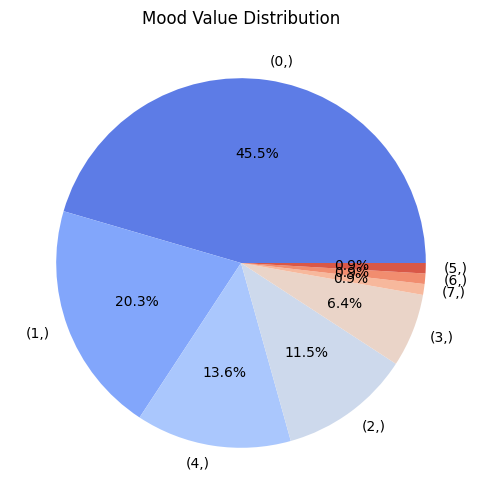

3506

In [ ]:
mood_counts = pd.read_parquet("wesad_data.parquet", columns=["Mood"]).value_counts(normalize=True)
plt.figure(figsize=(6, 6))
plt.pie(mood_counts.values, labels=mood_counts.index, autopct="%1.1f%%", colors=sns.color_palette("coolwarm", len(mood_counts)))
plt.title("Mood Value Distribution")
plt.show()
del mood_counts
gc.collect()

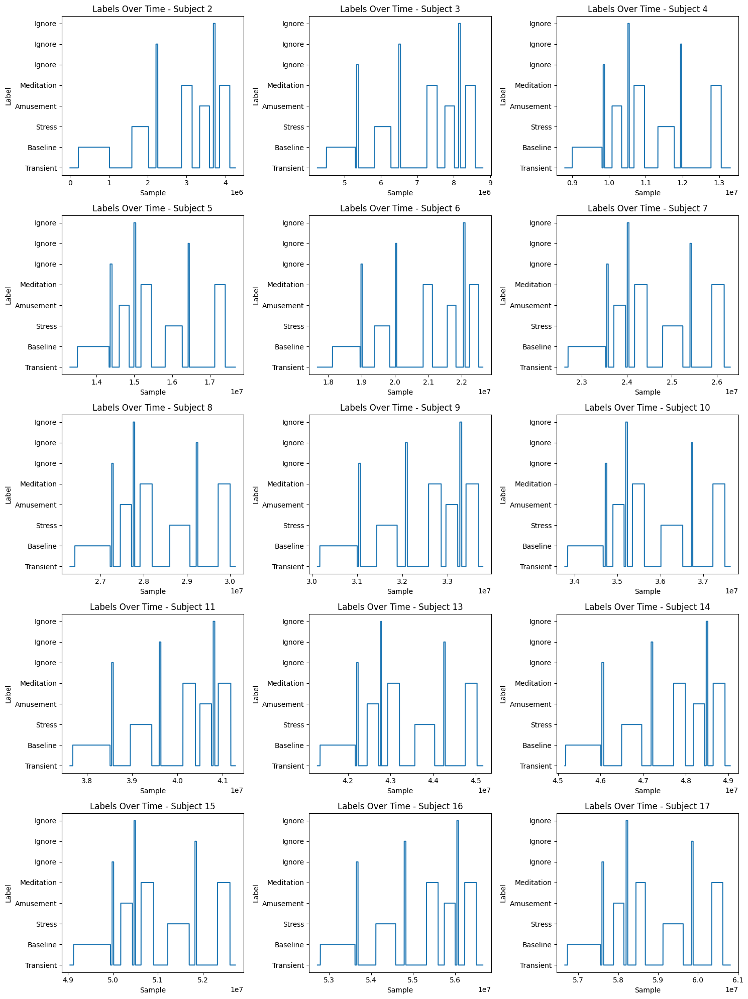

60

In [ ]:
df = pd.read_parquet("wesad_data.parquet", columns=["Subject Number", "Mood"])
subjects = df['Subject Number'].unique()

fig, axes = plt.subplots(5, 3, figsize=(15, 20))
axes = axes.flatten()

mood_labels = ["Transient", "Baseline", "Stress", "Amusement", "Meditation", "Ignore", "Ignore", "Ignore"]

for i, subject in enumerate(subjects[:15]):
    ax = axes[i]
    subject_df = df[df['Subject Number'] == subject]
    
    ax.plot(subject_df['Mood'])
    ax.set_xlabel("Sample")
    ax.set_ylabel("Label")
    ax.set_title(f"Labels Over Time - Subject {subject}")
    ax.set_yticks(range(len(mood_labels)))
    ax.set_yticklabels(mood_labels)

plt.tight_layout()
plt.show()
del df, subjects
gc.collect()

From the graphs, it is clear that some labels should be excluded from the dataset:

- **Labels 5, 6, and 7**: These should be ignored, as noted in the README file.
- **Label 0 (Transient State)**: This label represents the transitional phase between two emotional states. It does not contain valid or stable data for training, so it should also be excluded.

### Relevant Labels for the Model

Only the following emotional states are considered valid and useful for the model:

- **Baseline**: Represents the subject in a relaxed, idle state.
- **Stress**: Represents the subject under stress.
- **Amusement**: Represents the subject in a happy or entertained state.
- **Meditation**: Represents the subject in a meditative, calm state.

### Label Duration Insights

From the same graphs, we can observe the time distribution of each label:

- **Baseline** has the longest duration among all states.
- **Stress** also has a significant duration.
- **Amusement** and **Meditation** have shorter durations.
- However, since **Meditation** was recorded twice, its total duration exceeds that of **Amusement**, making **Amusement** the shortest in terms of recorded time.

This imbalance in label durations should be considered during model training and evaluation.

In [ ]:
import pyarrow.dataset as ds     
dataset = ds.dataset("wesad_data.parquet", format="parquet")
filtered_table = dataset.to_table(
    filter=~ds.field("Mood").isin([0, 5, 6, 7])
)
df = filtered_table.to_pandas()

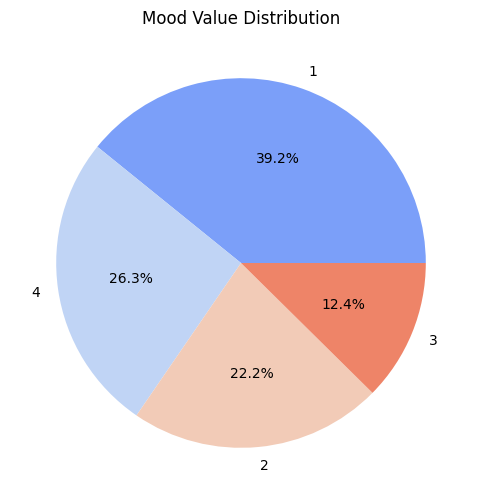

In [ ]:
mood_counts = df['Mood'].value_counts(normalize=True)
plt.figure(figsize=(6, 6))
plt.pie(mood_counts.values, labels=mood_counts.index, autopct="%1.1f%%", colors=sns.color_palette("coolwarm", len(mood_counts)))
plt.title("Mood Value Distribution")
plt.show()

In [ ]:
df.to_parquet("filtered_wesad.parquet")     #just save the filtered dataframe

In [ ]:
del df, dataset, filtered_table
gc.collect()

2780

# Data Visualization

In [ ]:
def show_chest_vs_wrist_signals(first_signal_name, first_signal_freq, second_signal_name, second_signal_freq, subject, Mood = 1, start_second = 0, duration = 10):
    df = pd.read_parquet("filtered_wesad.parquet", columns = [first_signal_name, second_signal_name, "Mood", "Subject Number"])
    subject_data = df[(df['Subject Number'] == subject) & (df['Mood'] == Mood)]
    
    first_signal = subject_data[first_signal_name][700 * start_second : (700 * (start_second + duration))].dropna().reset_index(drop=True)
    second_signal = subject_data[second_signal_name][700 * start_second : (700 * (start_second + duration))].dropna().reset_index(drop=True)
    
    time_first_signal = [i / first_signal_freq for i in range(len(first_signal))]
    time_second_signal = [i / second_signal_freq for i in range(len(second_signal))]
    
    fig, axs = plt.subplots(2, 1, figsize=(12, 6), sharex=True)
    
    axs[0].plot(time_first_signal, first_signal)
    axs[0].set_title(first_signal_name + ' Signal From ' + str(start_second) + ' To ' + str(duration + start_second))
    axs[0].set_ylabel(first_signal_name + ' Amplitude')
    
    axs[1].plot(time_second_signal, second_signal, color='orange')
    axs[1].set_title(second_signal_name + ' Signal From ' + str(start_second) + ' To ' + str(duration + start_second))
    axs[1].set_xlabel('Time (seconds)')
    axs[1].set_ylabel(second_signal_name + ' Amplitude')
    
    plt.tight_layout()
    plt.show()

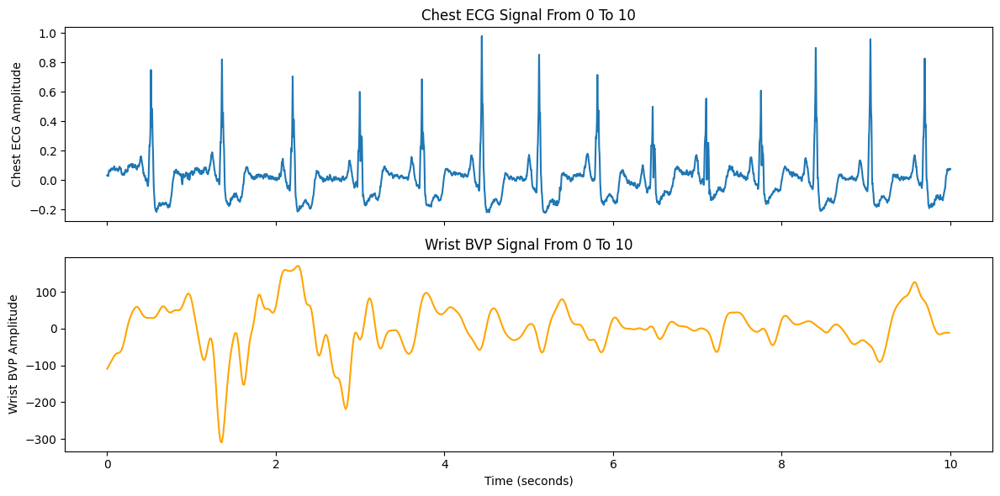

In [ ]:
show_chest_vs_wrist_signals('Chest ECG', 700, 'Wrist BVP', 64, 2, 1, 0, 10)

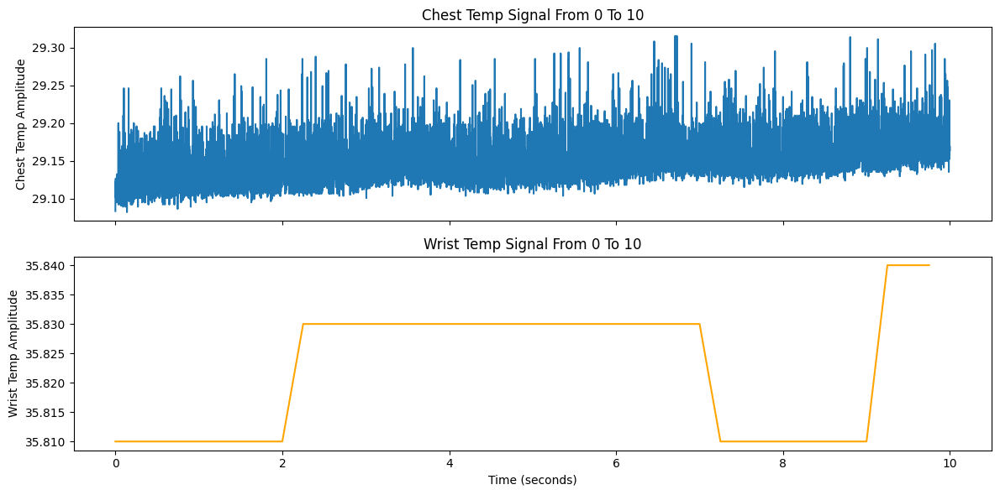

In [ ]:
show_chest_vs_wrist_signals('Chest Temp', 700, 'Wrist Temp', 4, 2, 1, 0, 10)

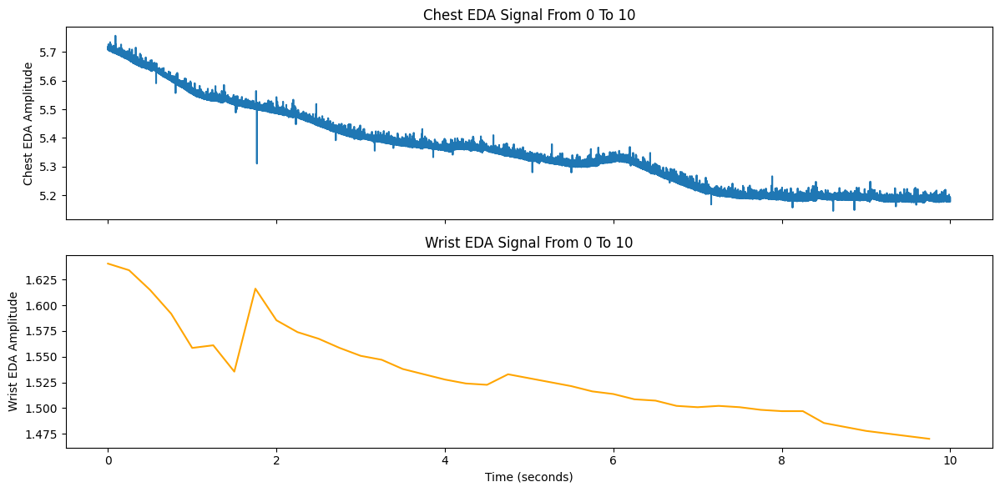

In [ ]:
show_chest_vs_wrist_signals('Chest EDA', 700, 'Wrist EDA', 4, 2, 1, 0, 10)

In [ ]:
def show_signal(signal_name, signal_freq, subject, Mood = 1, start_second = 0, duration = 10):
    df = pd.read_parquet("filtered_wesad.parquet", columns = [signal_name, "Mood", "Subject Number"])
    subject_data = df[(df['Subject Number'] == subject) & (df['Mood'] == Mood)]
    
    signal = subject_data[signal_name][700 * start_second : (700 * (start_second + duration))].dropna().reset_index(drop=True)
    
    time = [i / signal_freq for i in range(len(signal))]
    
    plt.plot(time, signal)
    plt.title(signal_name + ' Signal From ' + str(start_second) + ' To ' + str(duration + start_second))
    plt.xlabel('Time (seconds)')
    plt.ylabel(signal_name + ' Amplitude')
    plt.show()

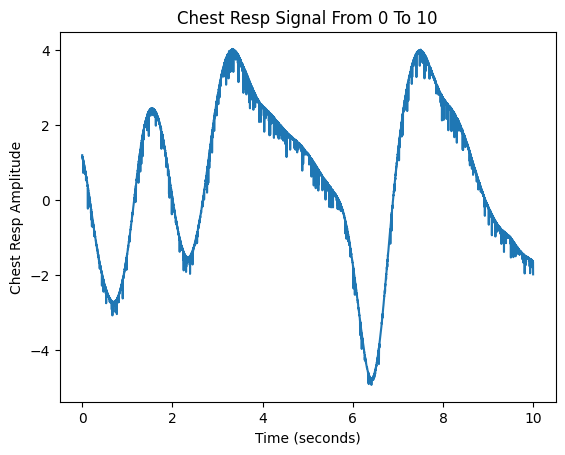

In [ ]:
show_signal('Chest Resp', 700, 2, 1, 0, 10)

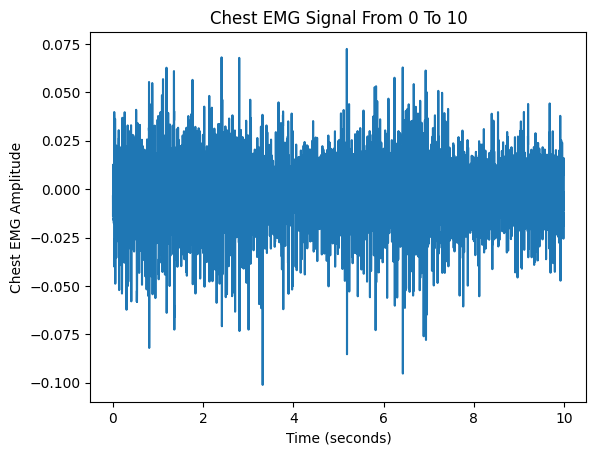

In [ ]:
show_signal('Chest EMG', 700, 2, 1, 0, 10)

In [ ]:
def plot_acc(signal, freq, subject, Mood = 1, start_second = 0, duration = 10):
    df = pd.read_parquet("filtered_wesad.parquet", columns = [signal + ' Acc X', signal + ' Acc Y', signal + ' Acc Z', "Mood", "Subject Number"])
    subject_data = df[(df['Subject Number'] == subject) & (df['Mood'] == Mood)]
    x = subject_data[signal + ' Acc X'][700 * start_second : (700 * (start_second + duration))].dropna().reset_index(drop=True)
    y = subject_data[signal + ' Acc Y'][700 * start_second : (700 * (start_second + duration))].dropna().reset_index(drop=True)
    z = subject_data[signal + ' Acc Z'][700 * start_second : (700 * (start_second + duration))].dropna().reset_index(drop=True)
    time = [i / freq for i in range(len(x))]

    plt.figure(figsize=(12, 4))
    plt.plot(time, x, label='X-axis')
    plt.plot(time, y, label='Y-axis')
    plt.plot(time, z, label='Z-axis')
    plt.title(f'{signal} Accelerometer - Subject {subject}')
    plt.xlabel('Time (s)')
    plt.ylabel('Acceleration')
    plt.legend()
    plt.tight_layout()
    plt.show()

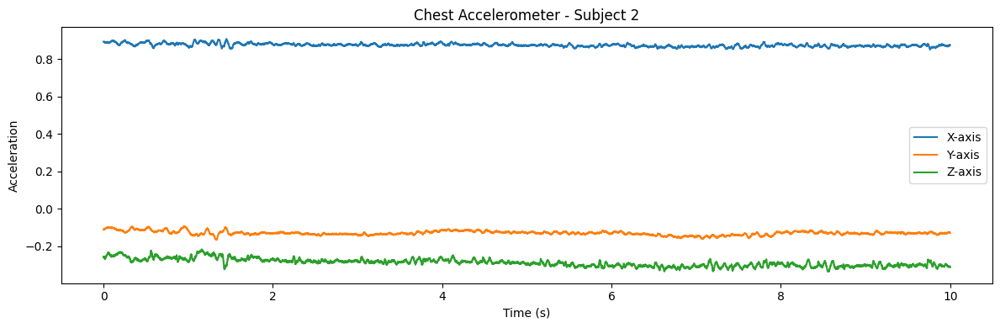

In [ ]:
plot_acc('Chest', 700, 2, 1, 0, 10)

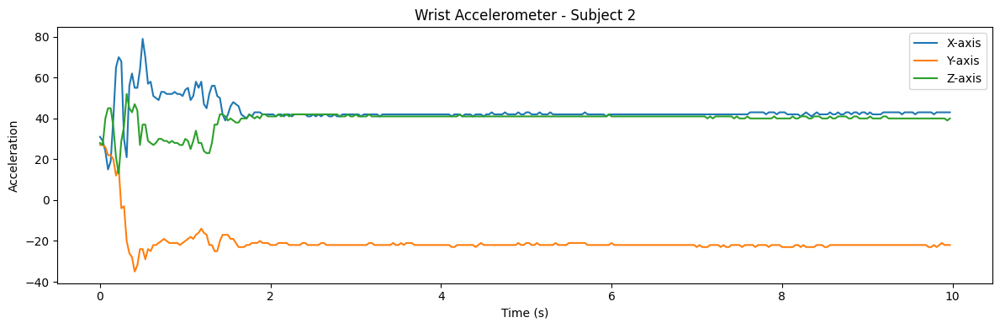

In [ ]:
plot_acc('Wrist', 32, 2, 1, 0, 10)

In [ ]:
def plot_subject_signals(subject, Mood = 1, start_second = 0, duration = 10):
    show_chest_vs_wrist_signals('Chest ECG', 700, 'Wrist BVP', 64, subject, Mood, start_second, duration)
    show_chest_vs_wrist_signals('Chest EDA', 700, 'Wrist EDA', 4, subject, Mood, start_second, duration)
    show_chest_vs_wrist_signals('Chest Temp', 700, 'Wrist Temp', 4, subject, Mood, start_second, duration)

    plot_acc('Chest', 700, subject, Mood, start_second, duration)
    plot_acc('Wrist', 32, subject, Mood, start_second, duration)

    show_signal('Chest EMG', 700, subject, Mood, start_second, duration)
    show_signal('Chest Resp', 700, subject, Mood, start_second, duration)

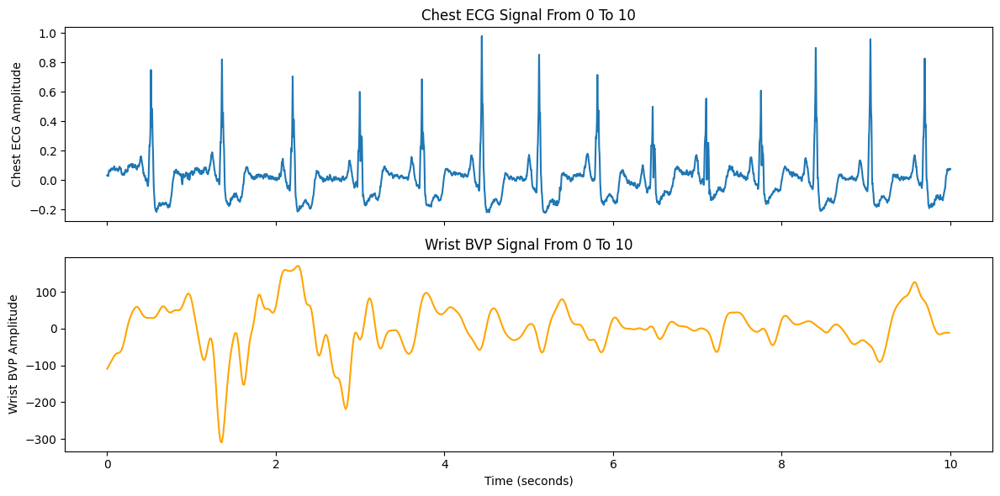

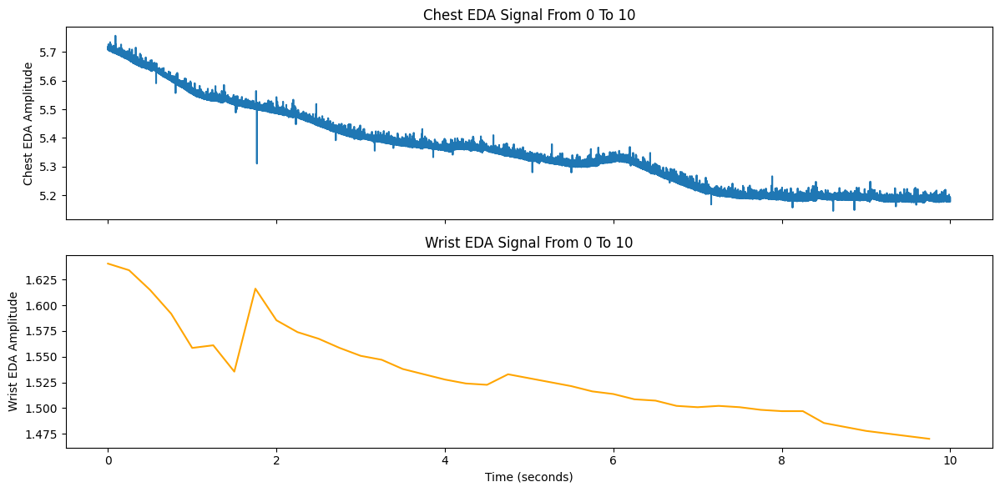

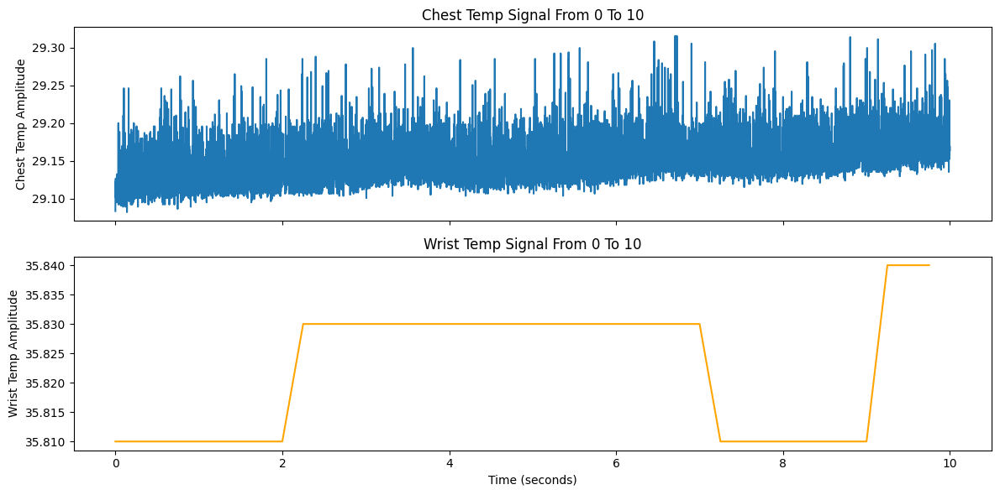

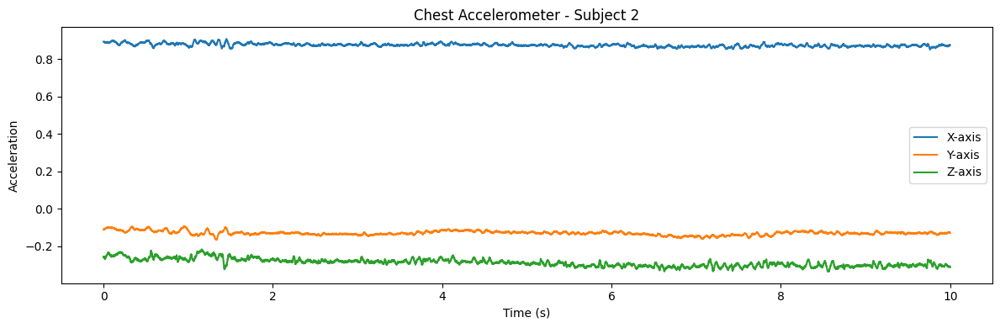

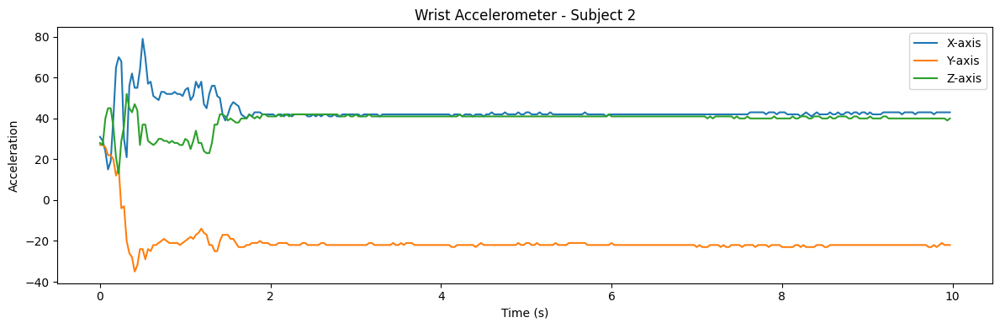

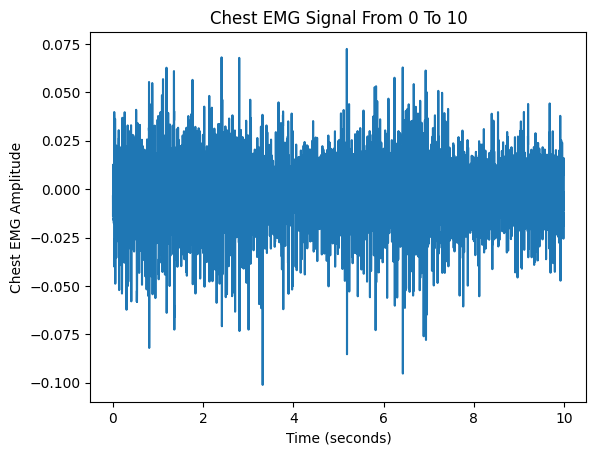

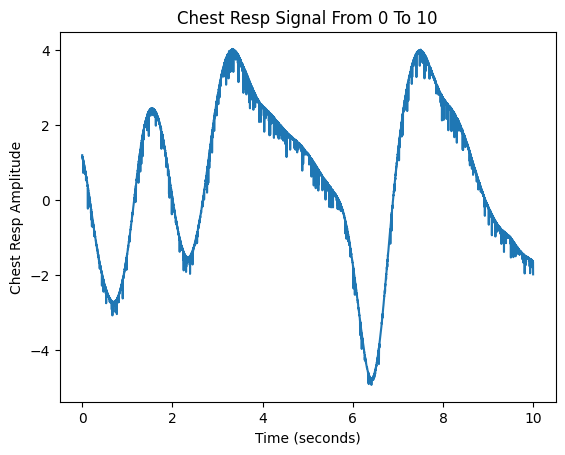

In [ ]:
plot_subject_signals(2, 1, 0, 10)

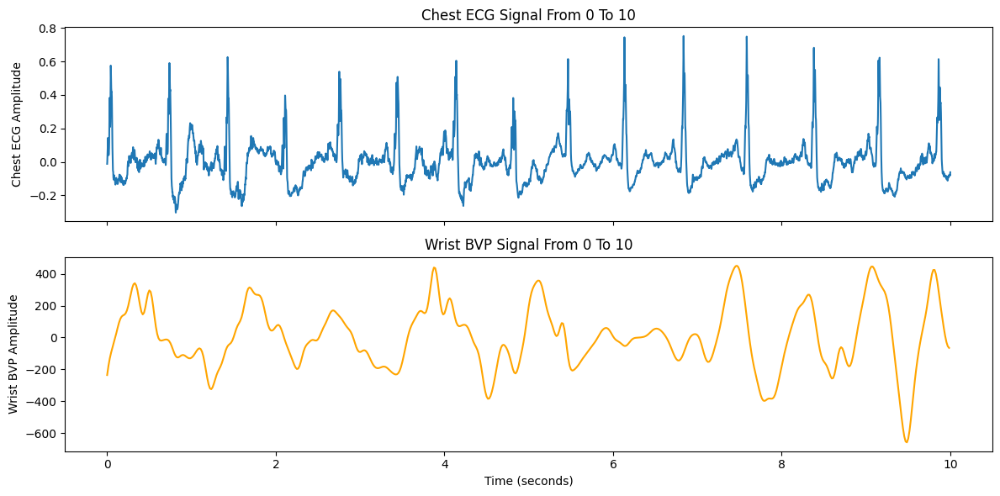

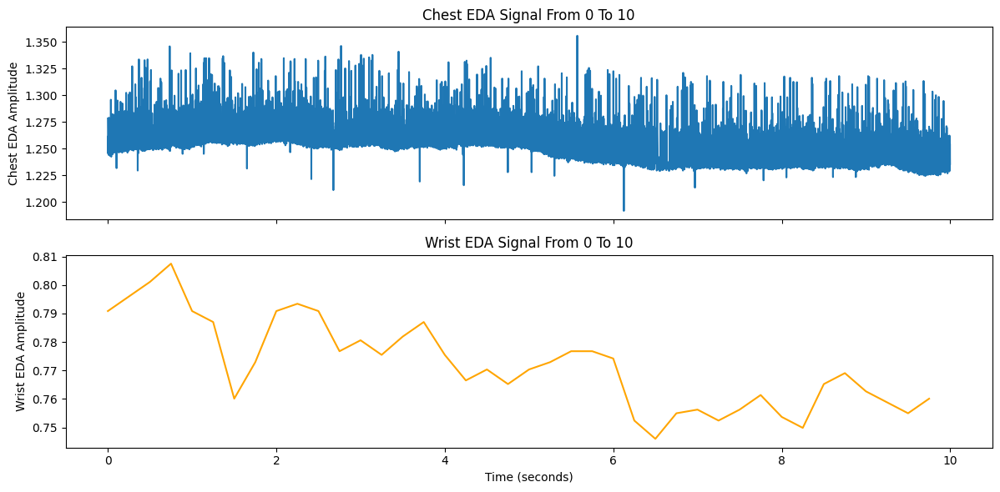

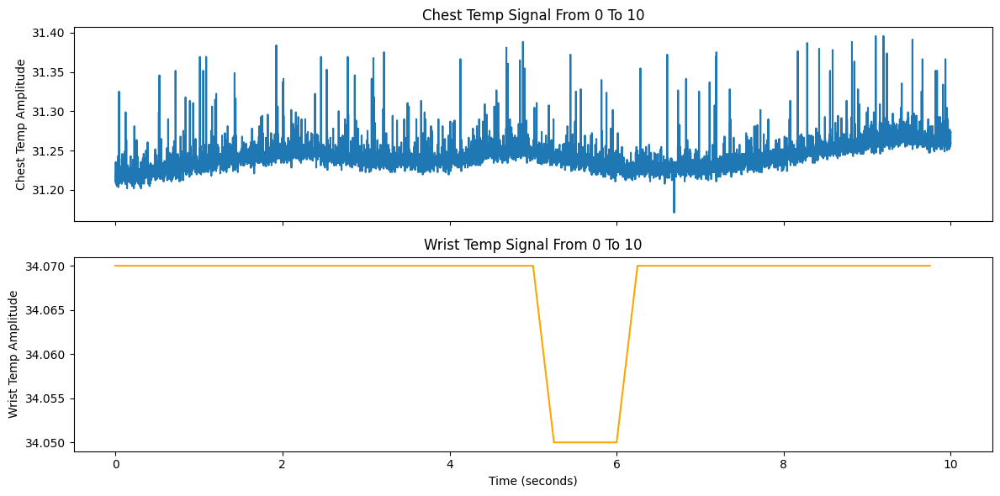

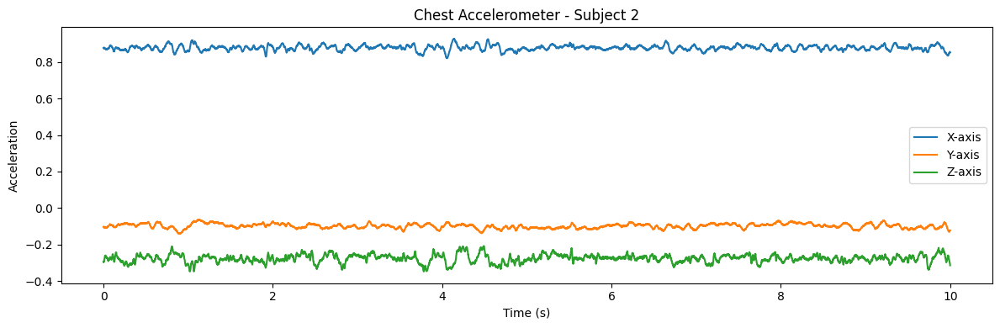

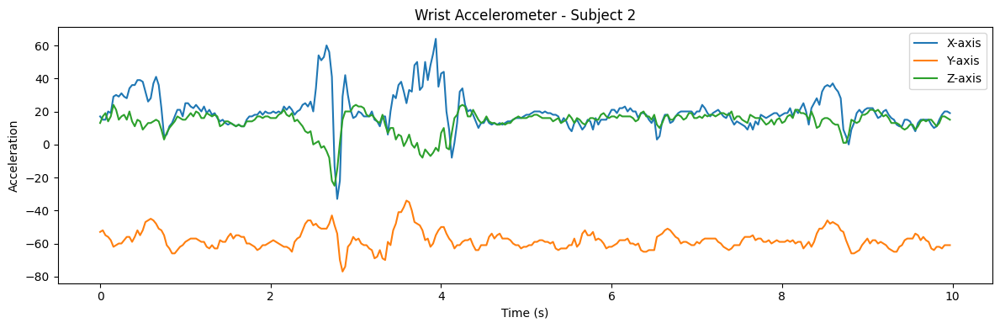

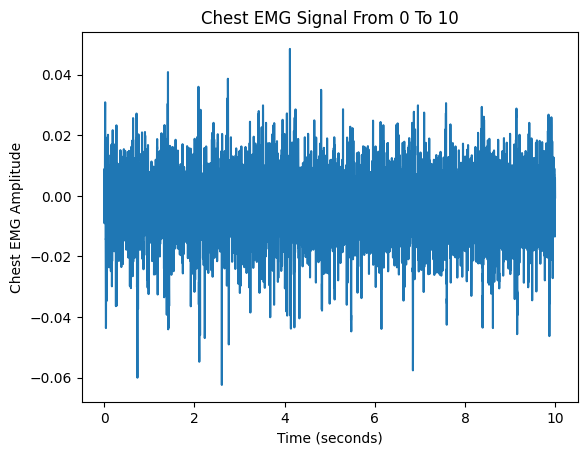

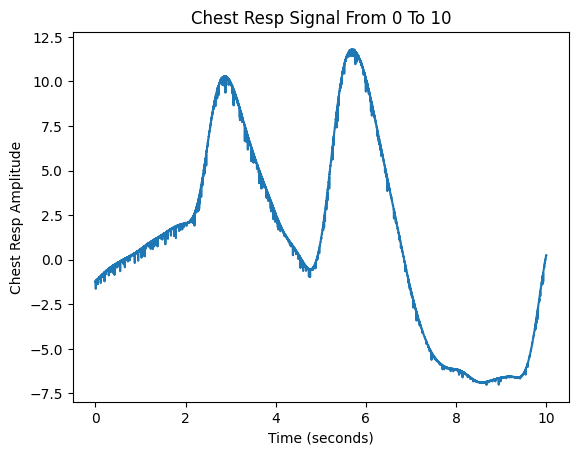

In [ ]:
plot_subject_signals(2, 2, 0, 10)

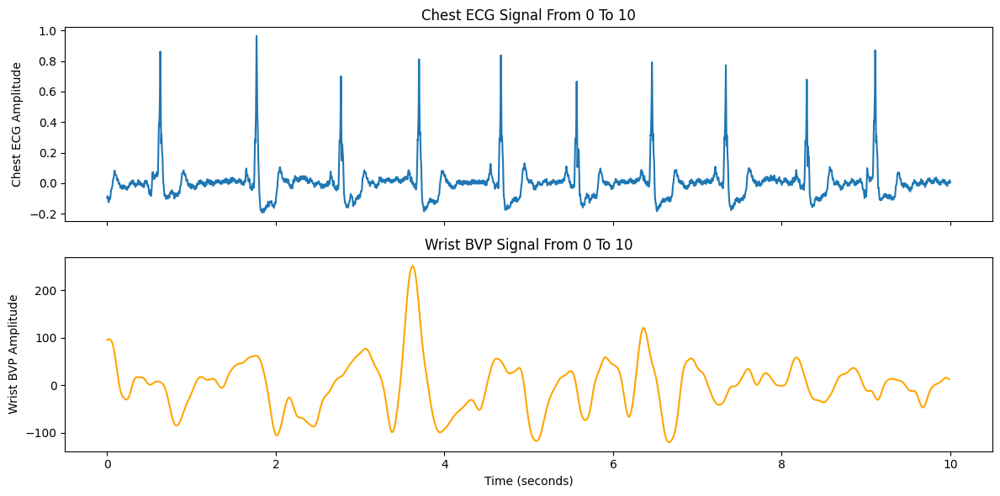

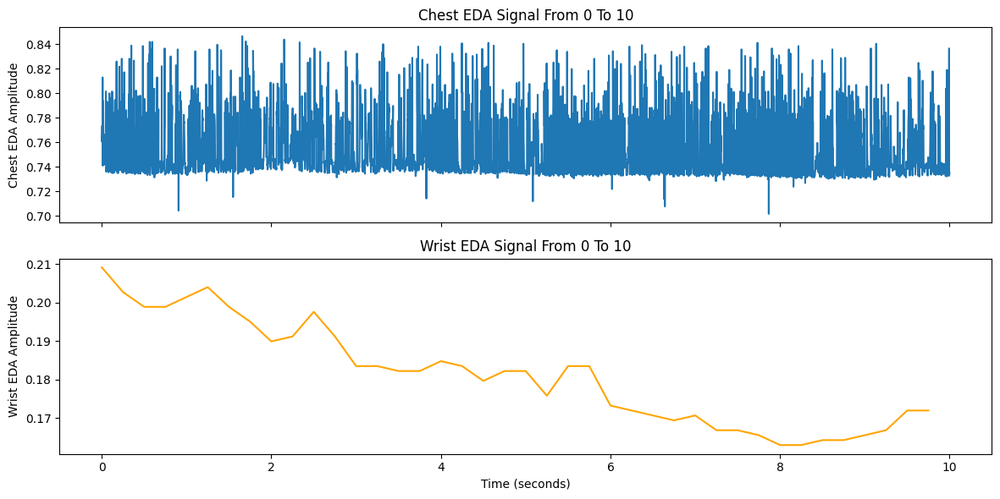

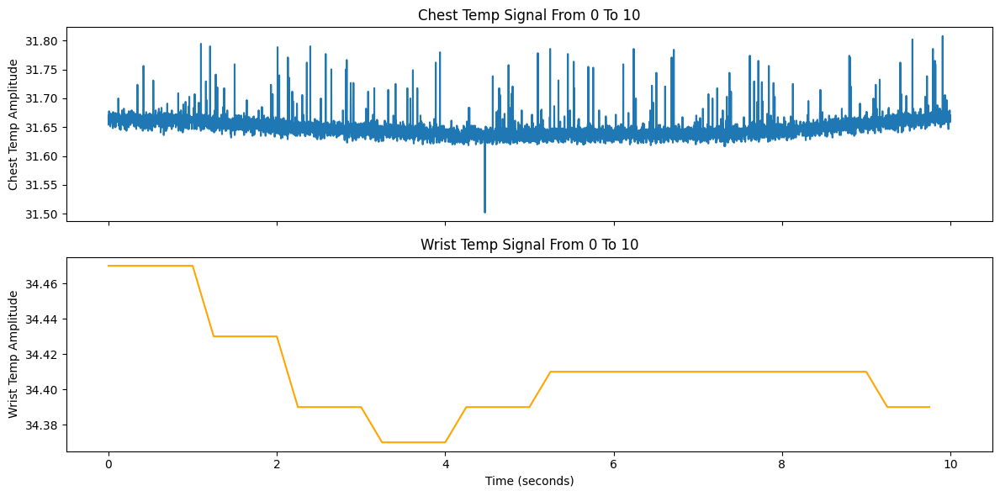

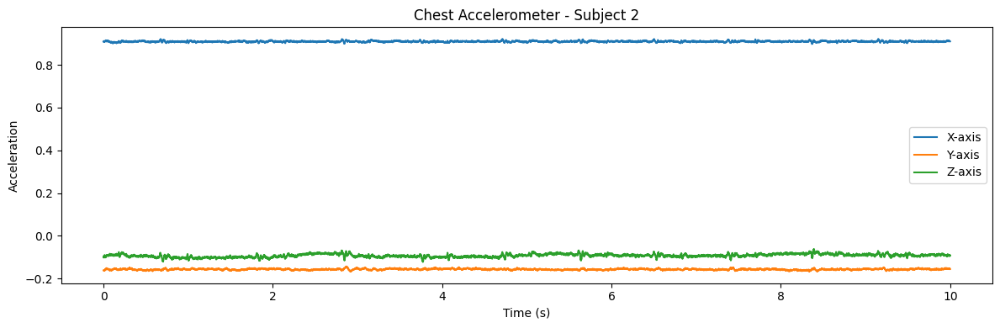

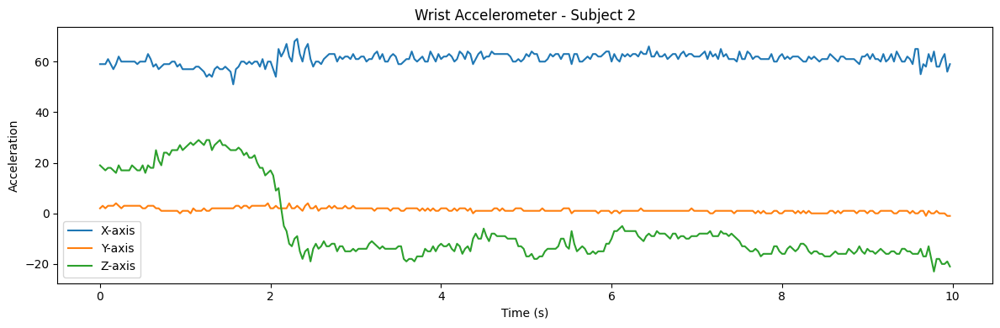

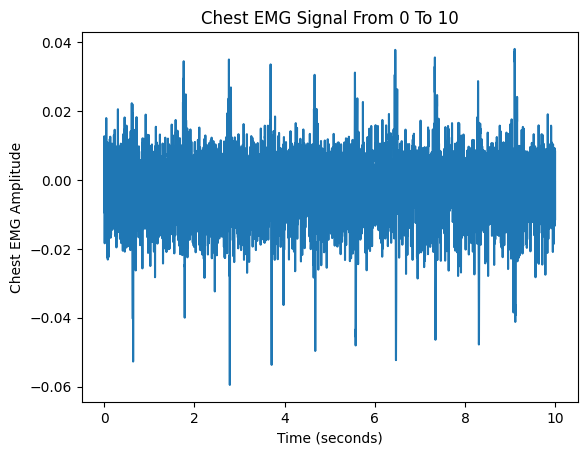

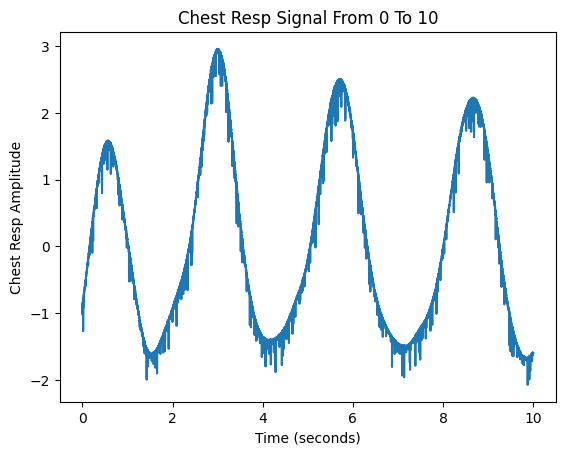

In [ ]:
plot_subject_signals(2, 3, 0, 10)

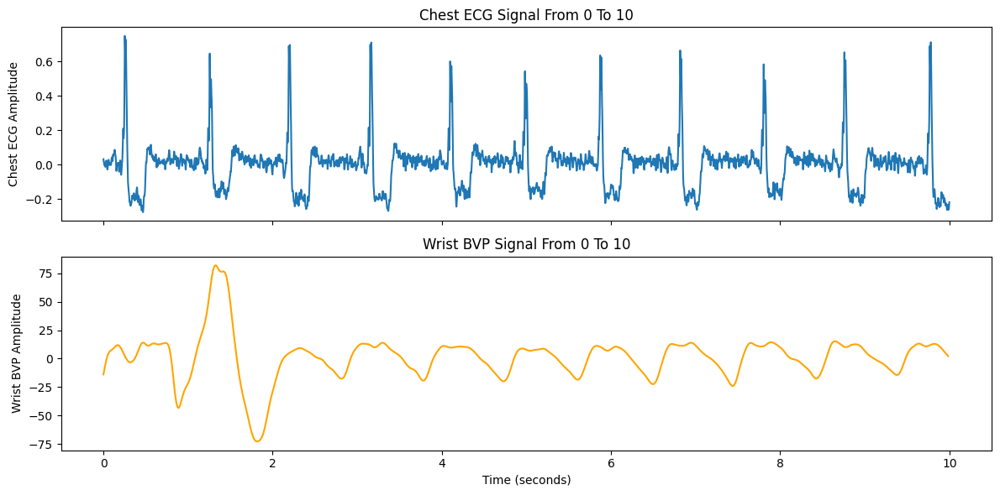

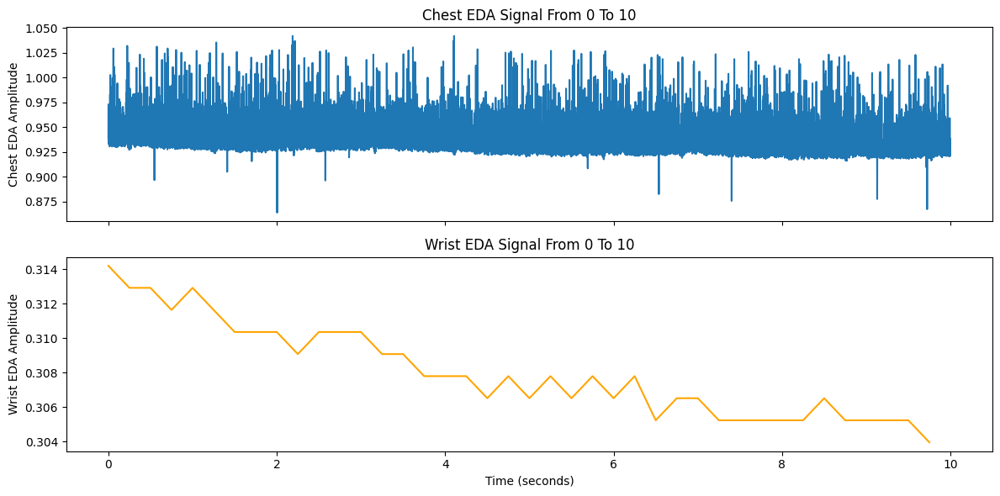

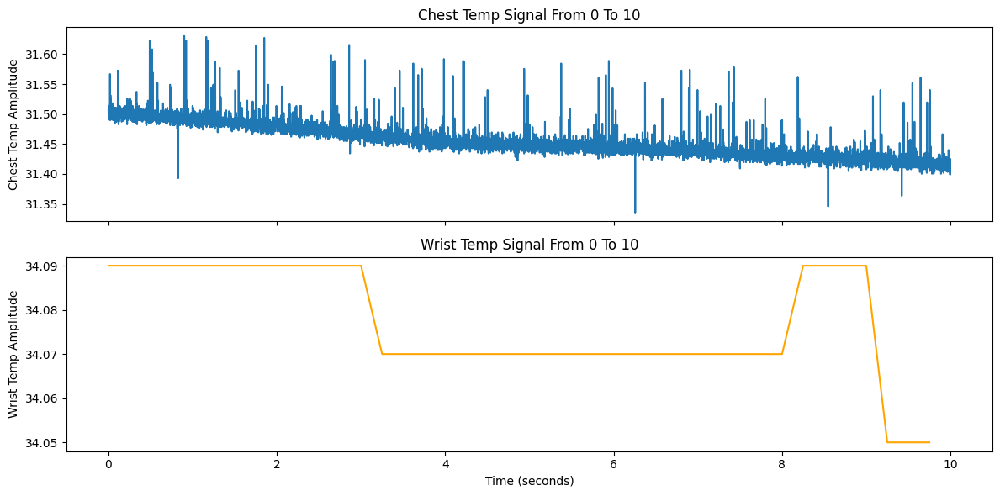

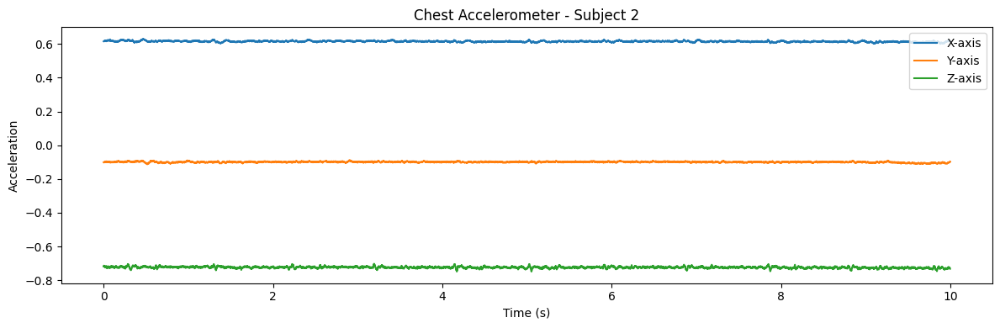

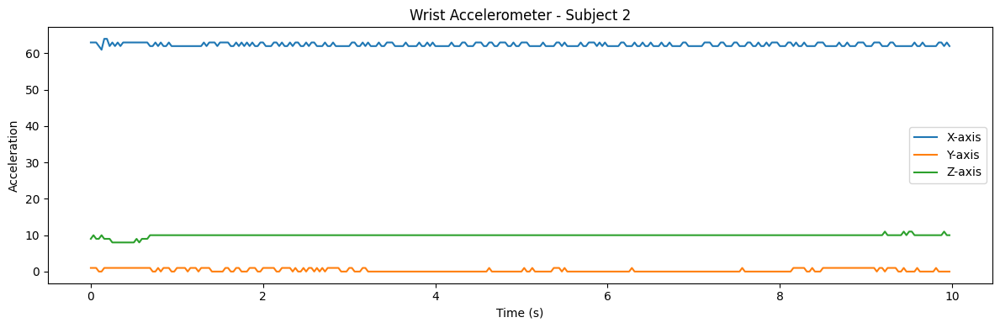

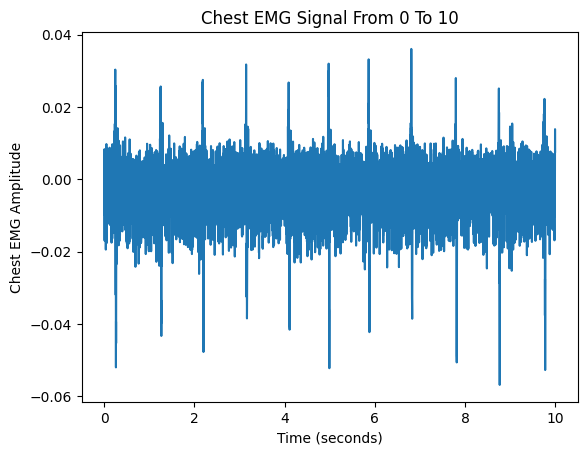

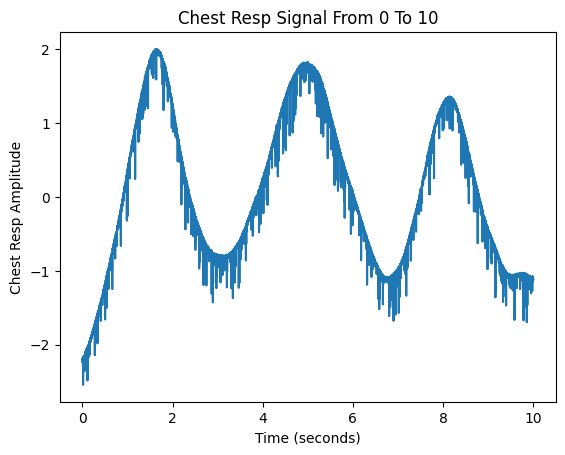

In [ ]:
plot_subject_signals(2, 4, 0, 10)

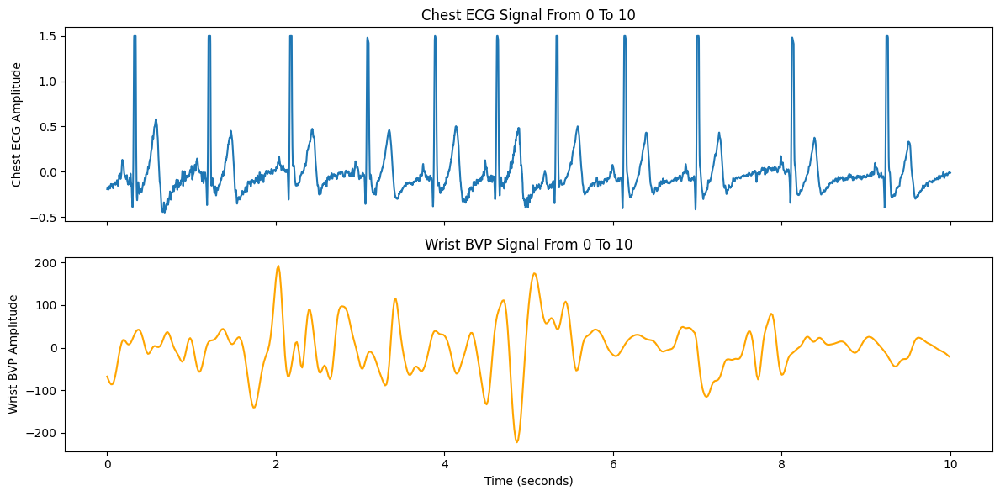

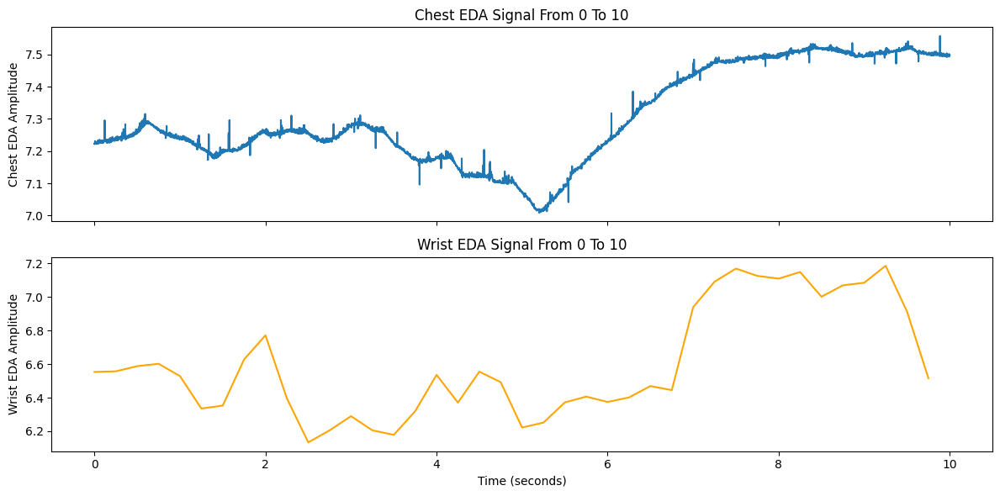

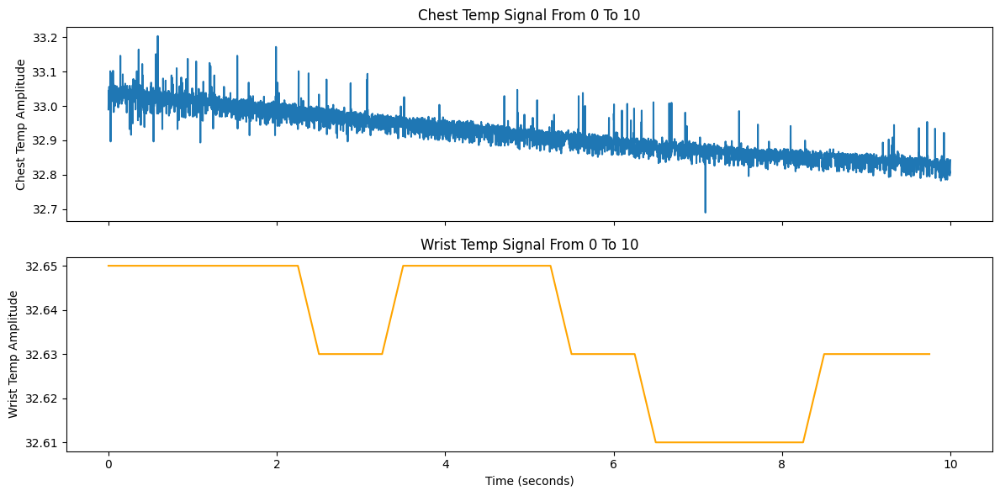

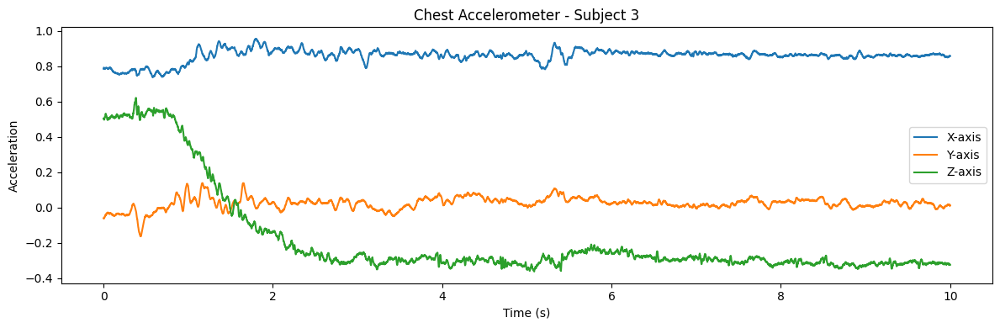

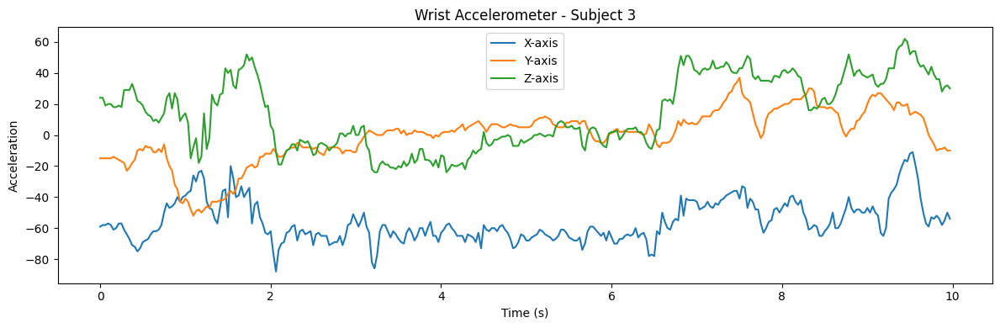

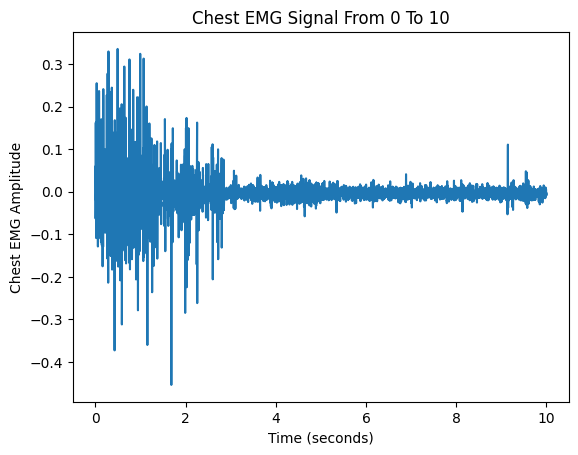

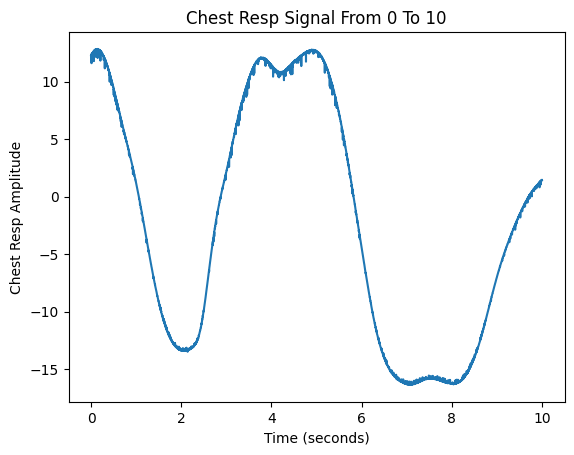

In [ ]:
plot_subject_signals(3, 1, 0, 10)

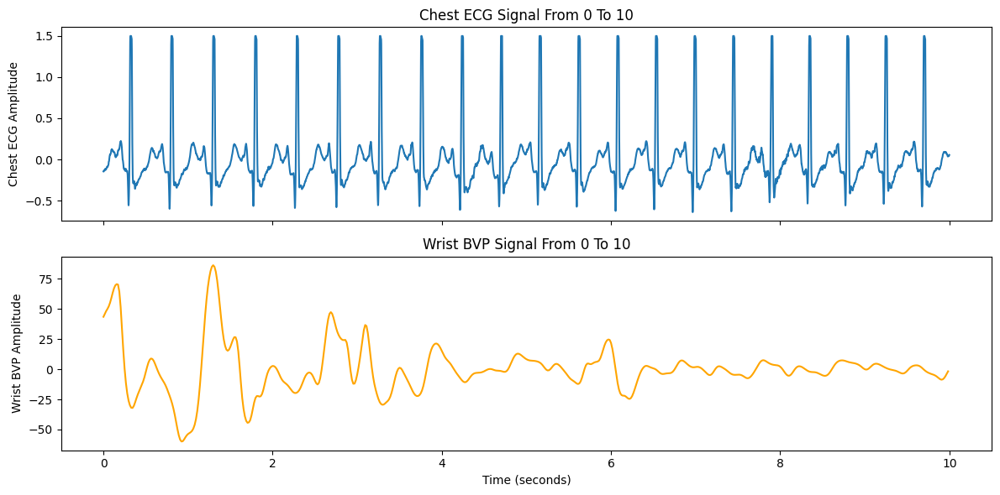

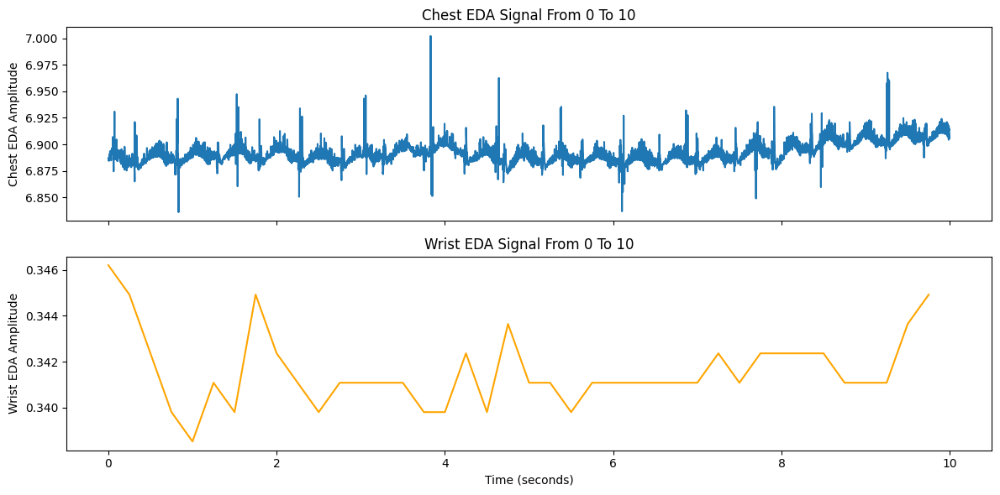

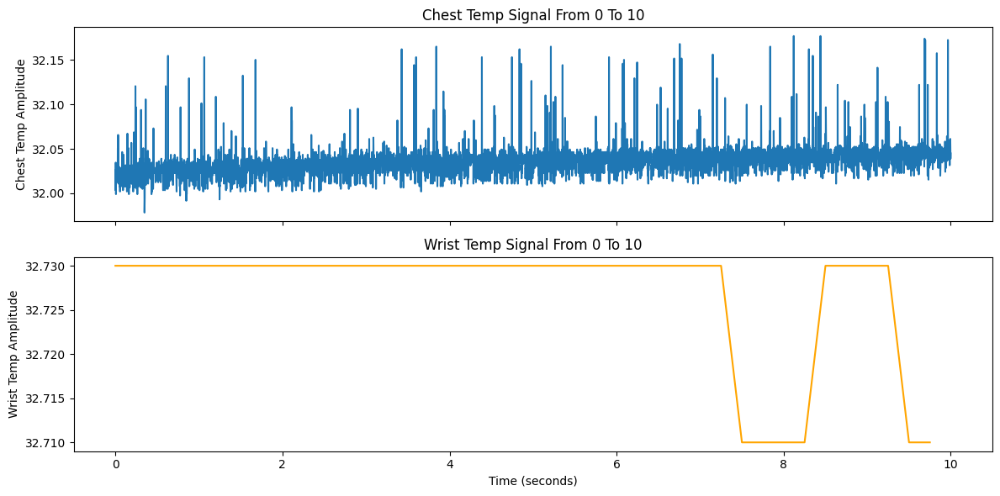

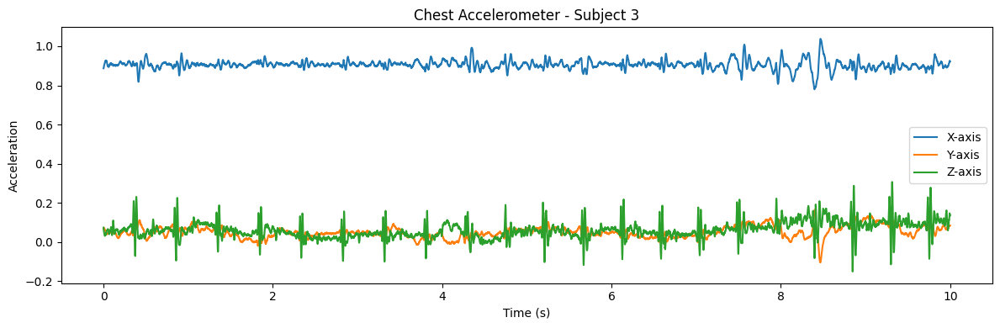

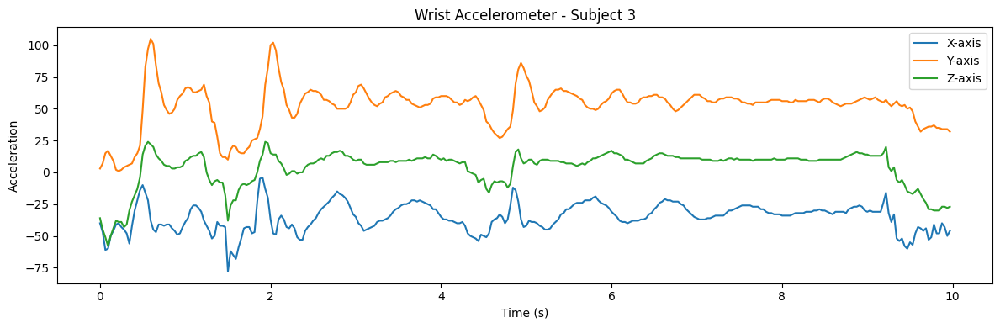

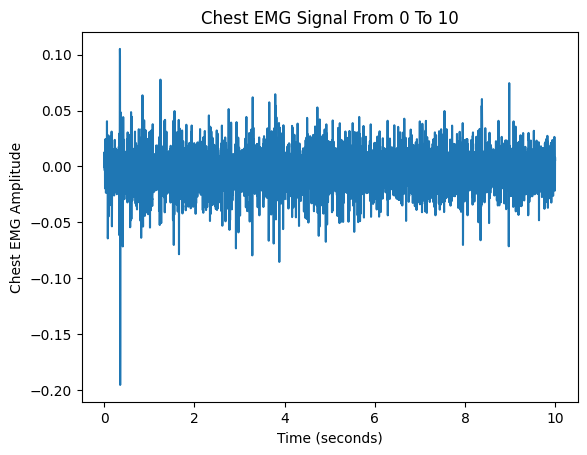

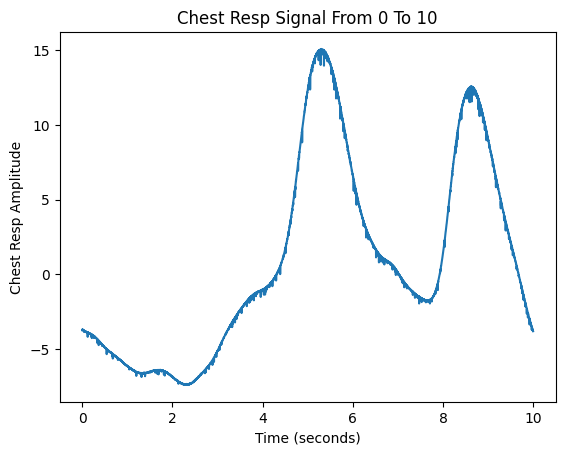

In [ ]:
plot_subject_signals(3, 2, 0, 10)

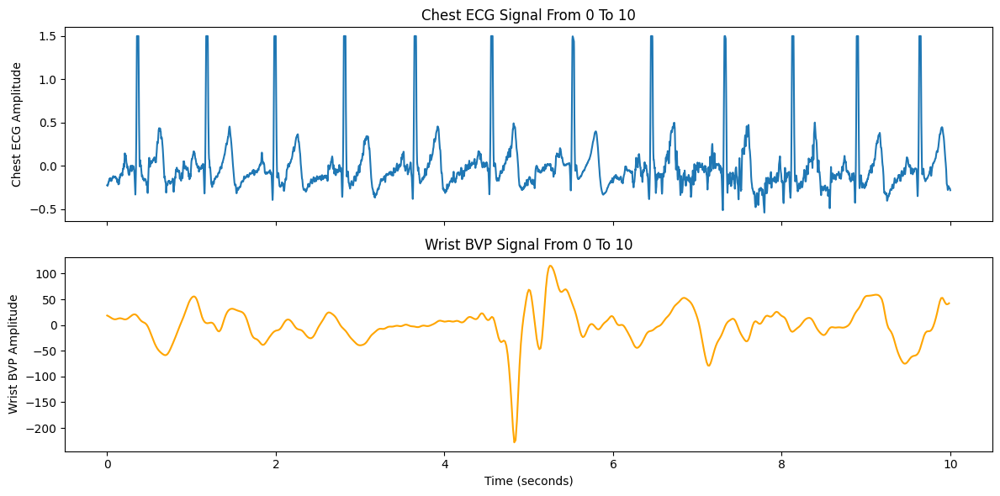

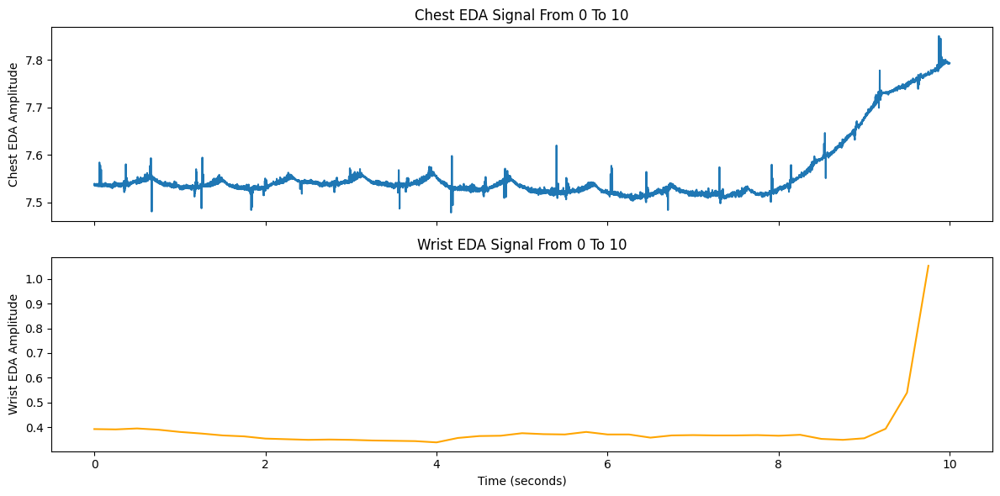

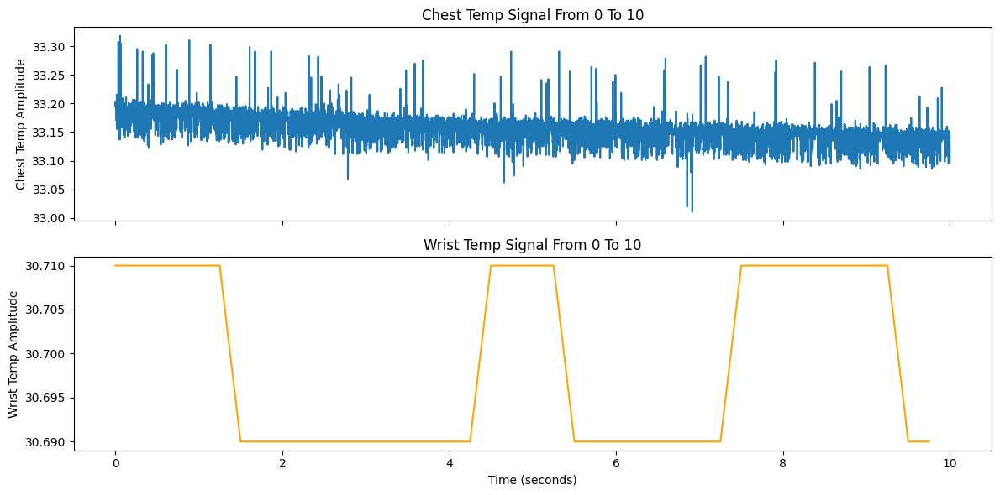

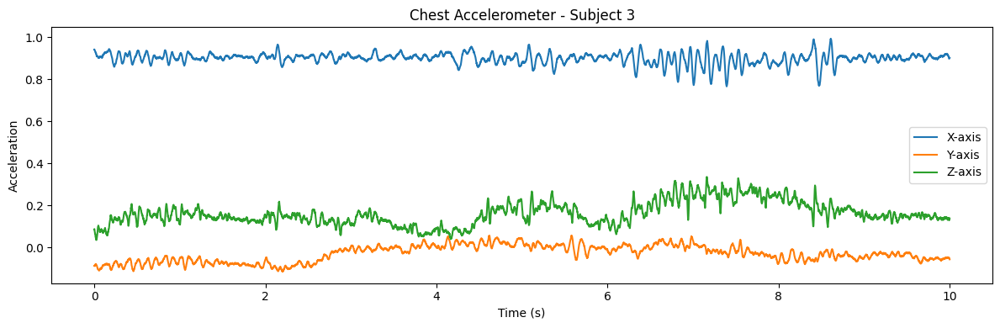

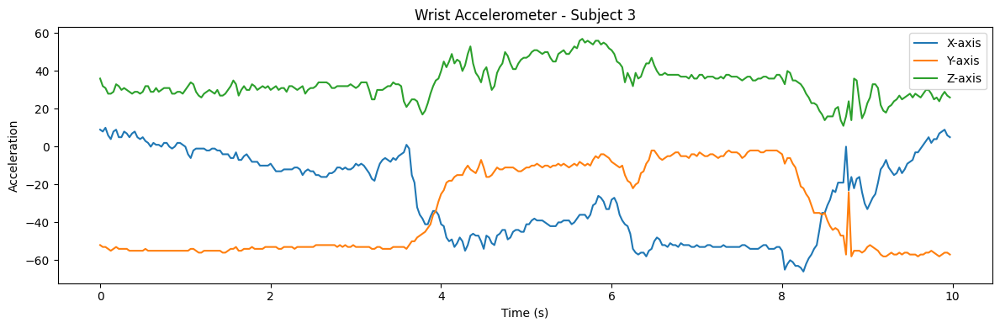

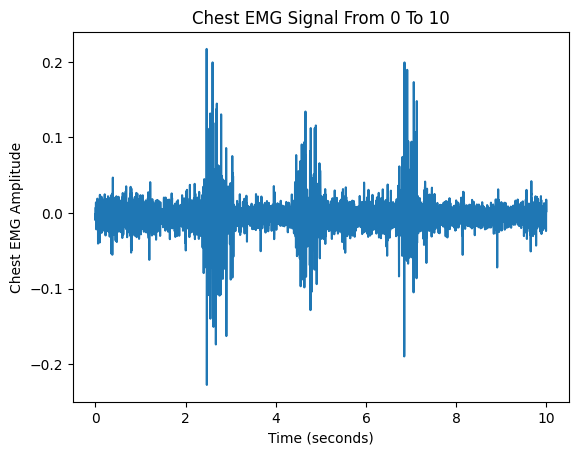

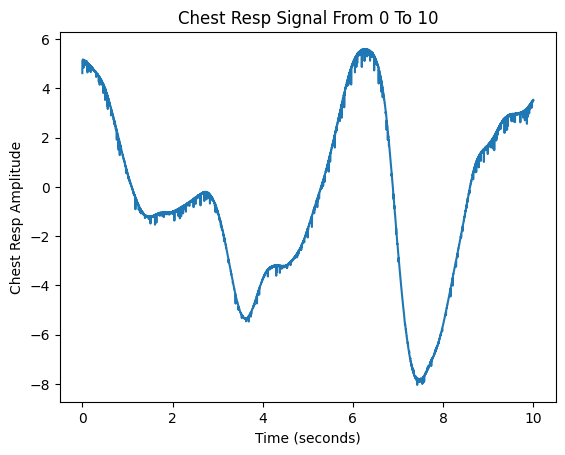

In [ ]:
plot_subject_signals(3, 3, 0, 10)

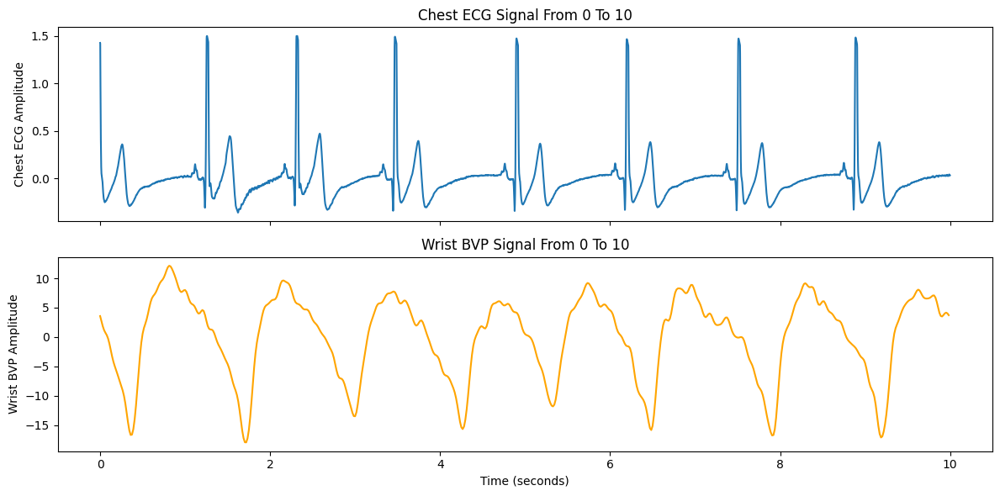

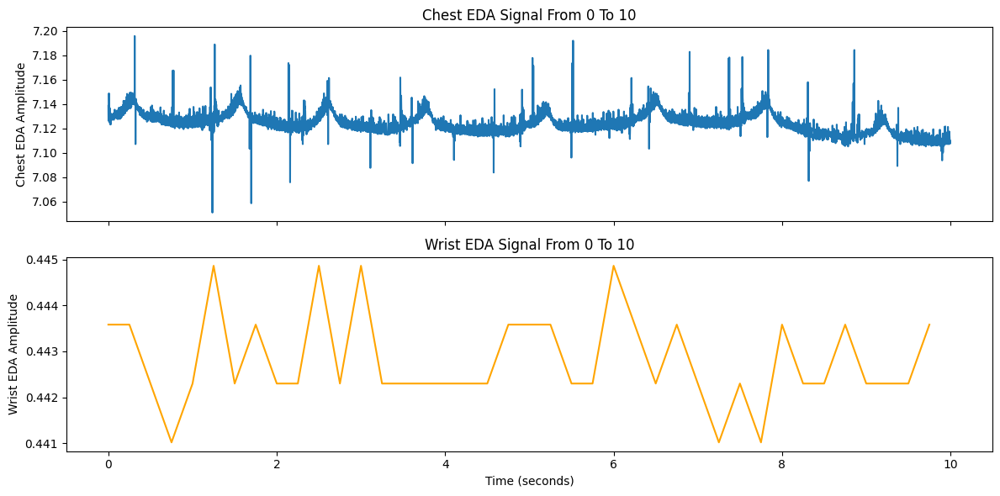

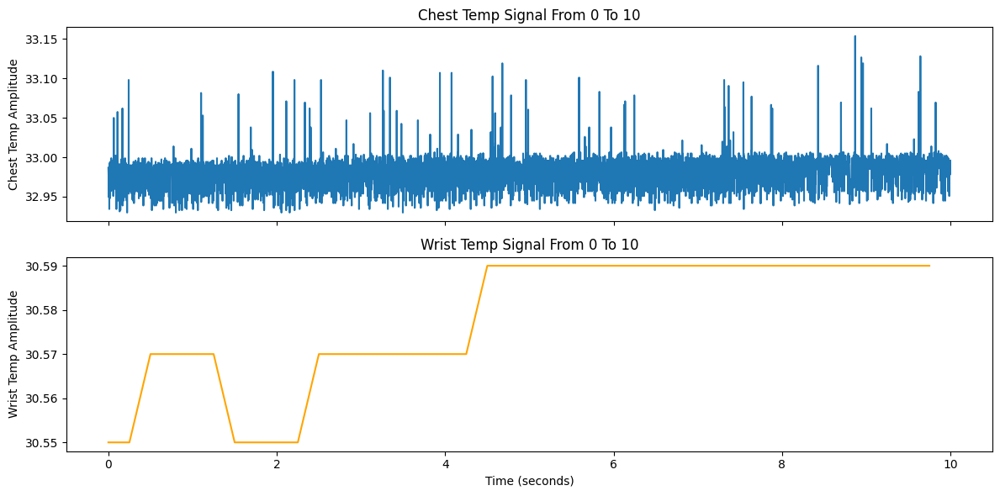

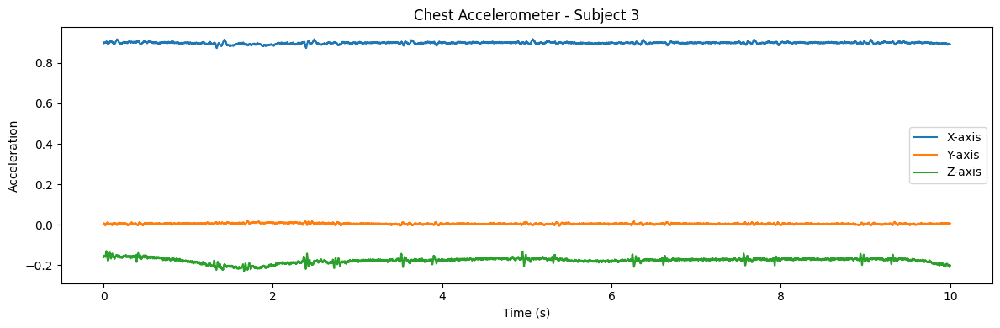

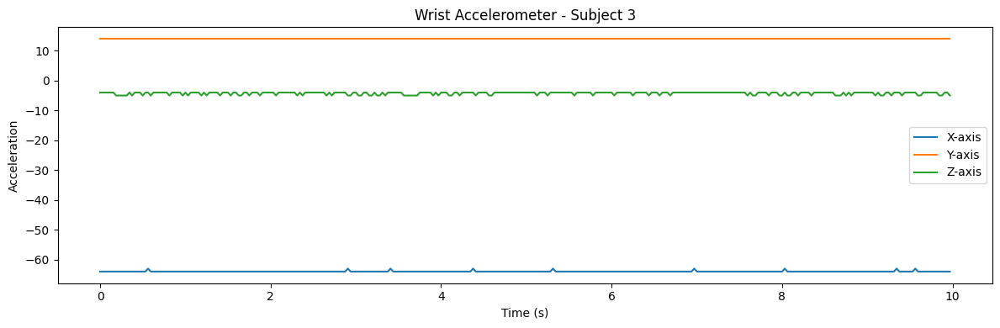

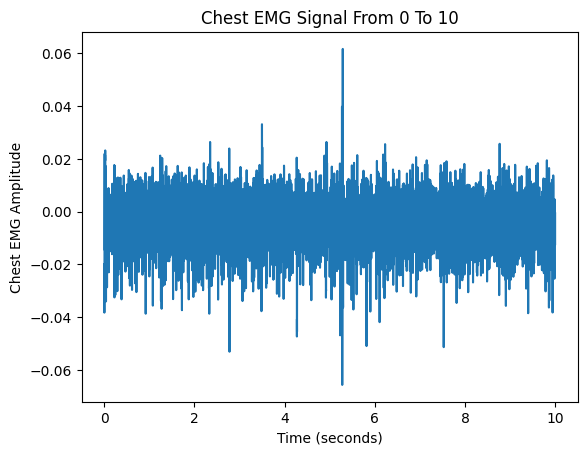

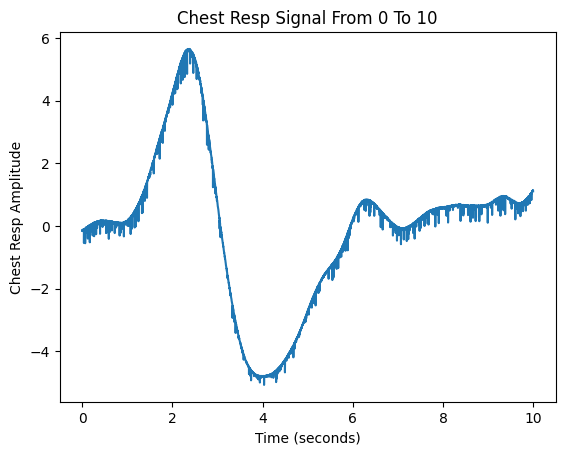

In [ ]:
plot_subject_signals(3, 4, 0, 10)

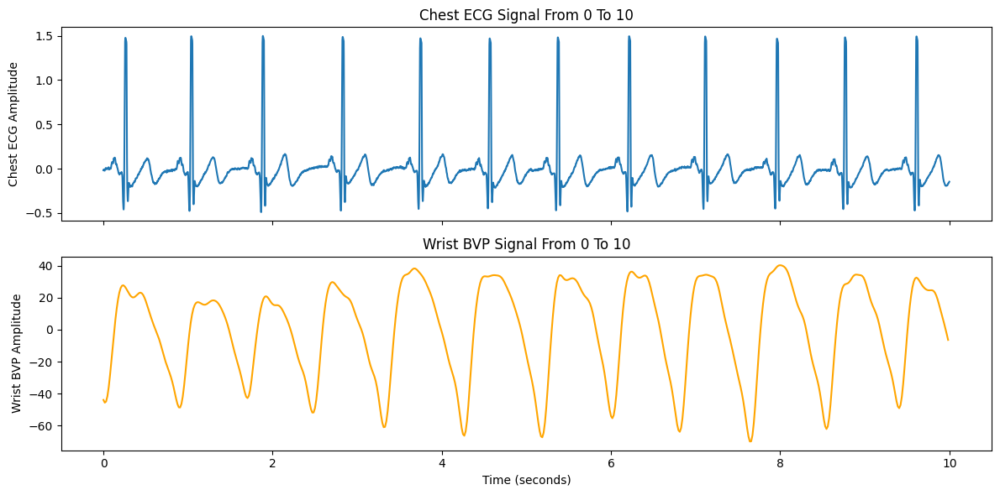

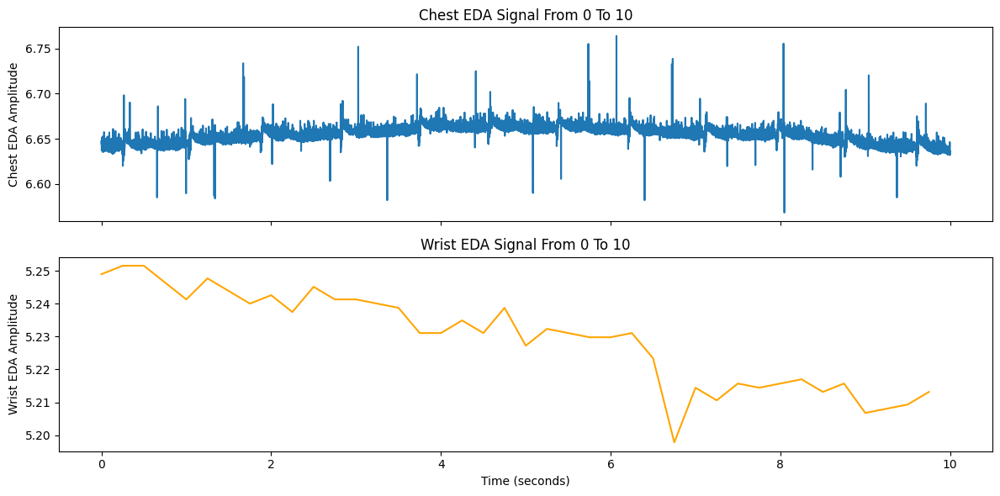

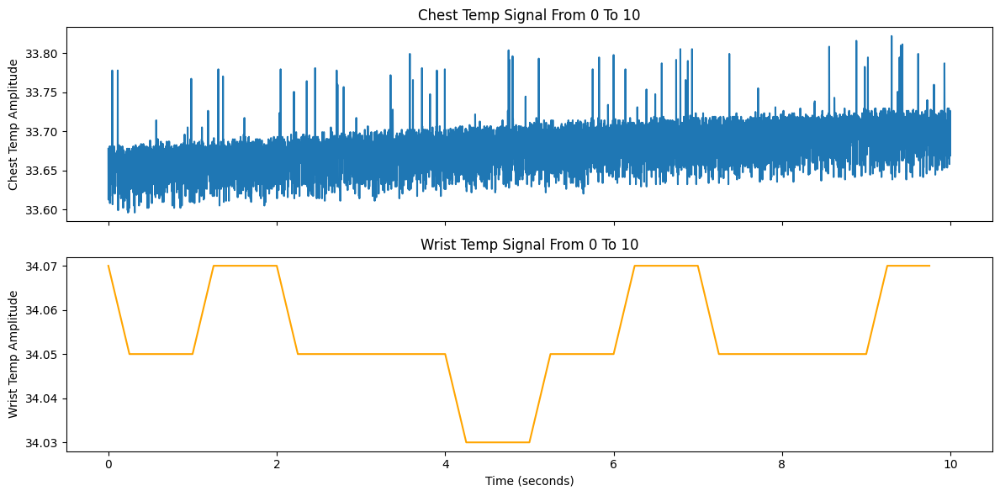

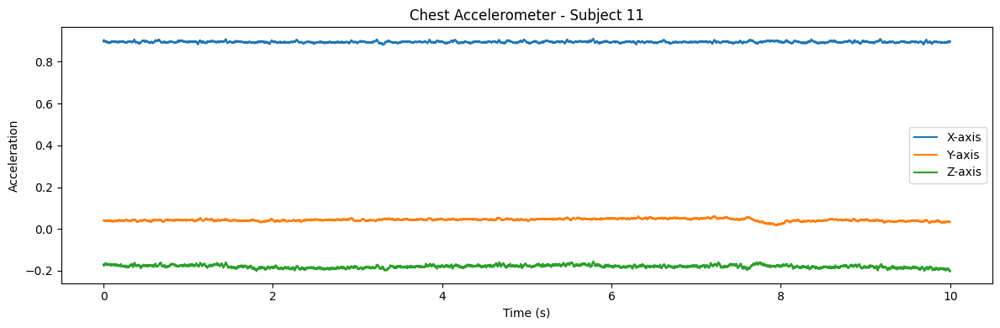

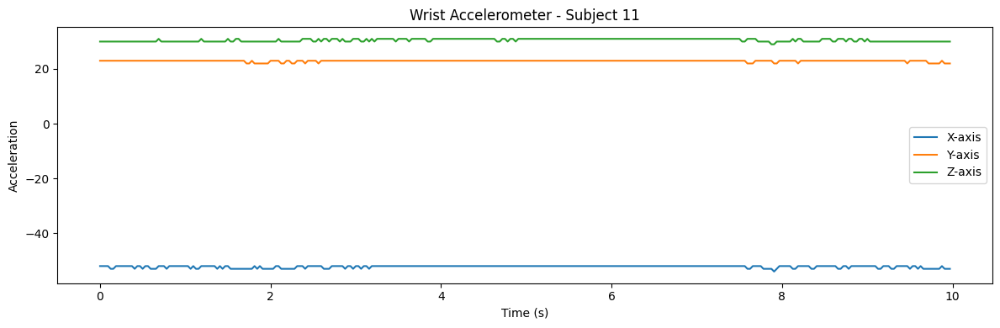

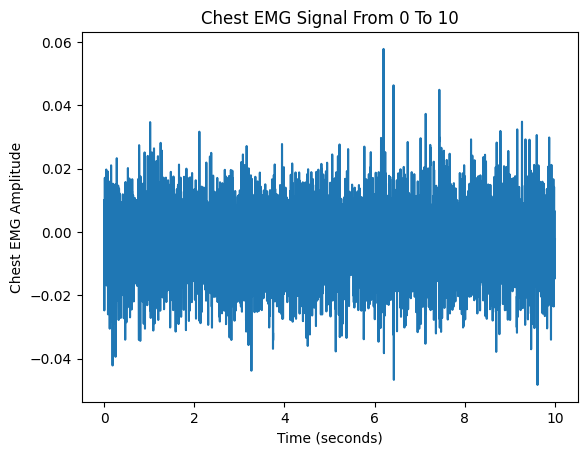

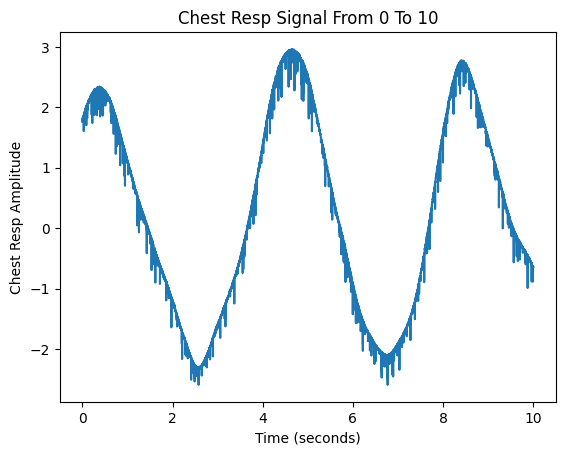

In [ ]:
plot_subject_signals(11, 1, 0, 10)

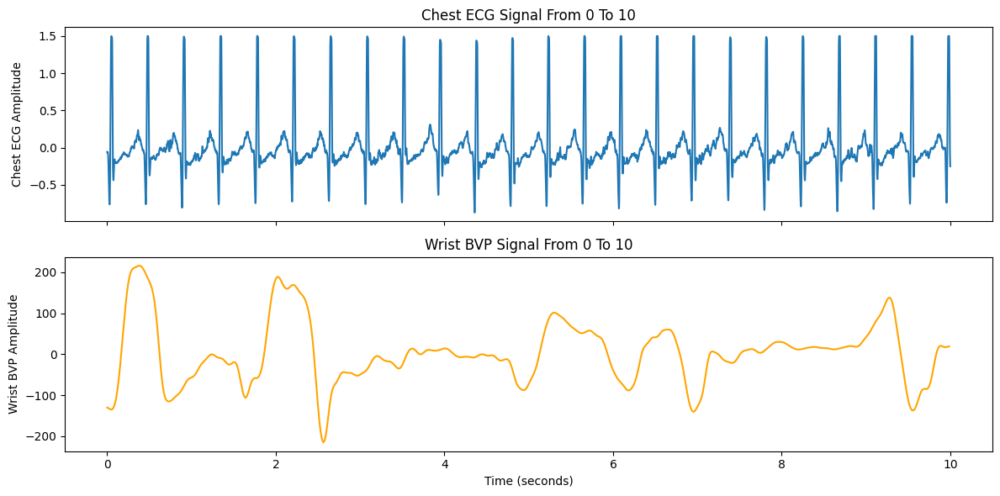

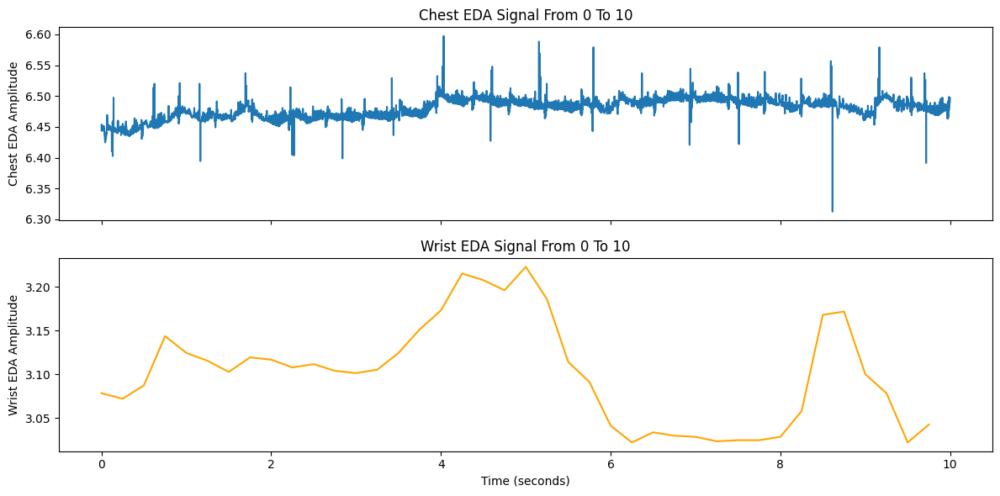

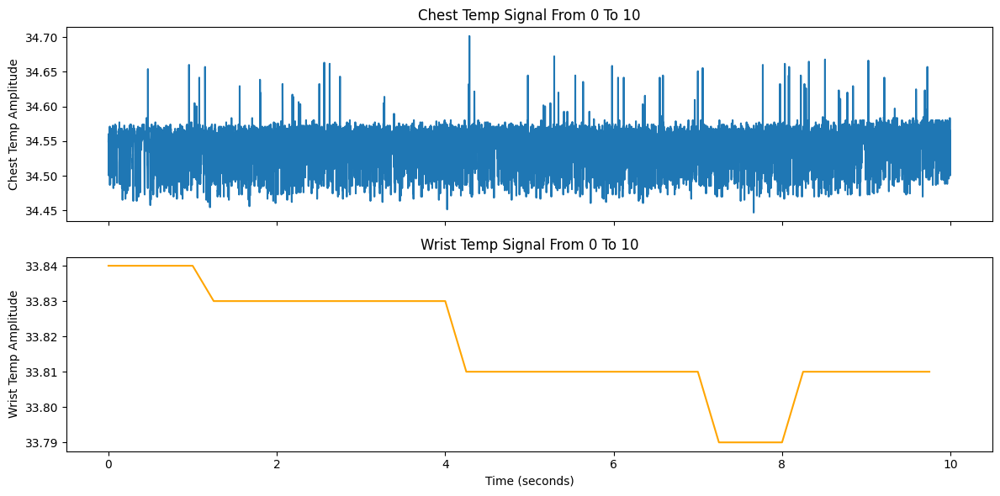

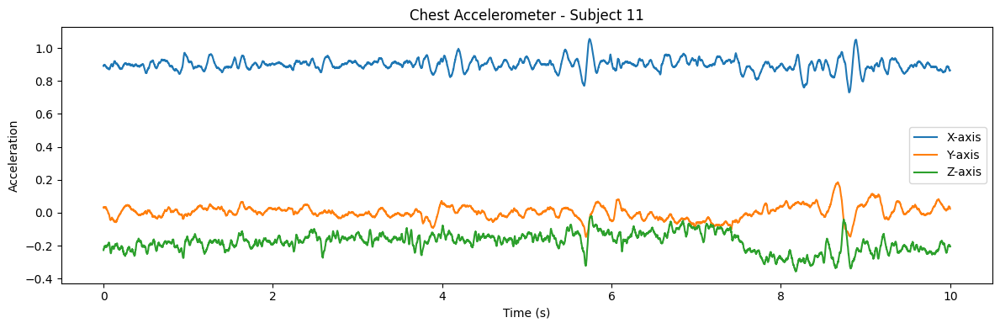

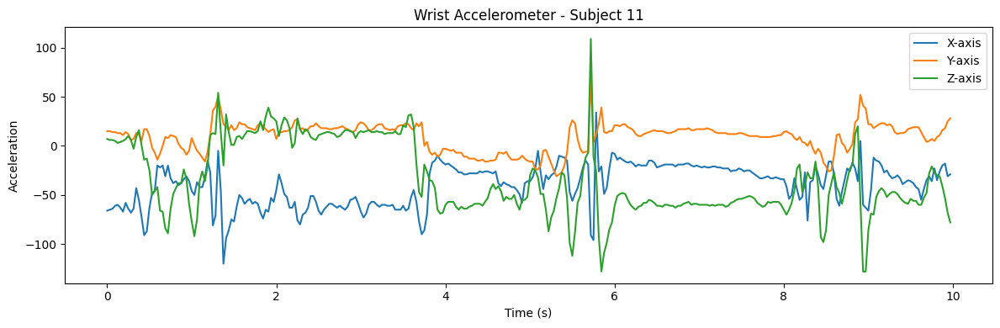

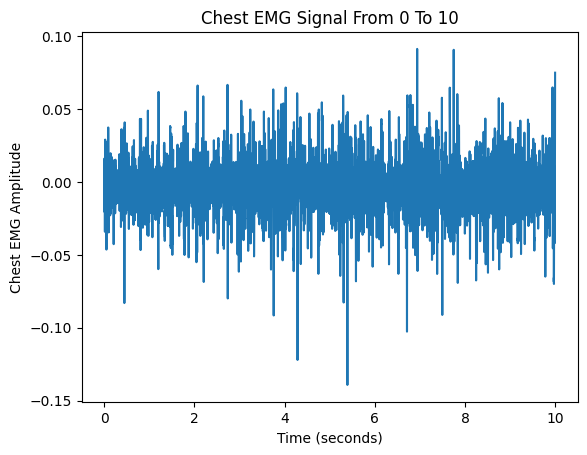

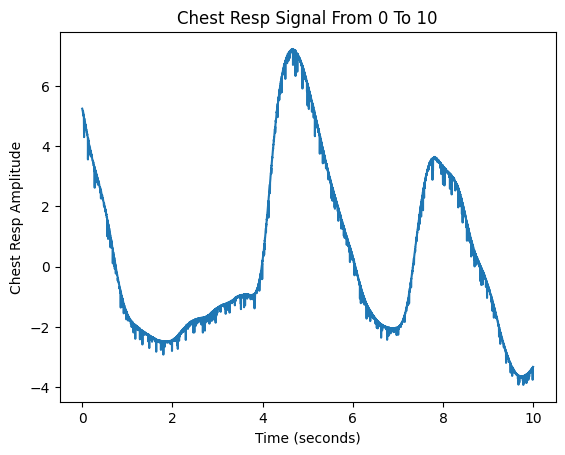

In [ ]:
plot_subject_signals(11, 2, 0, 10)

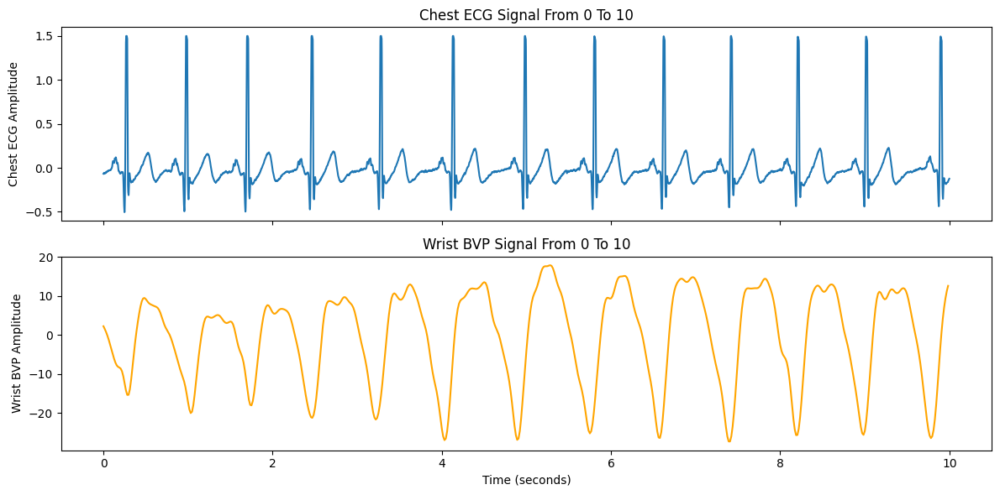

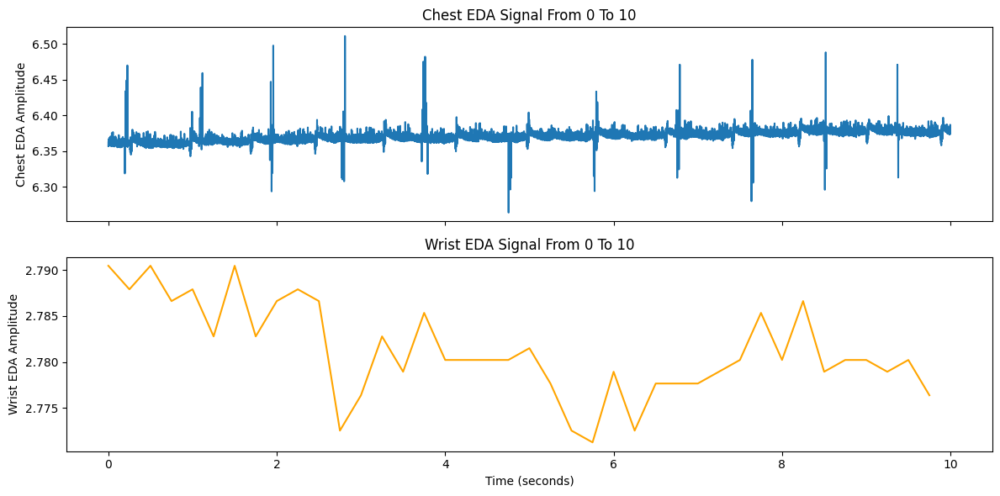

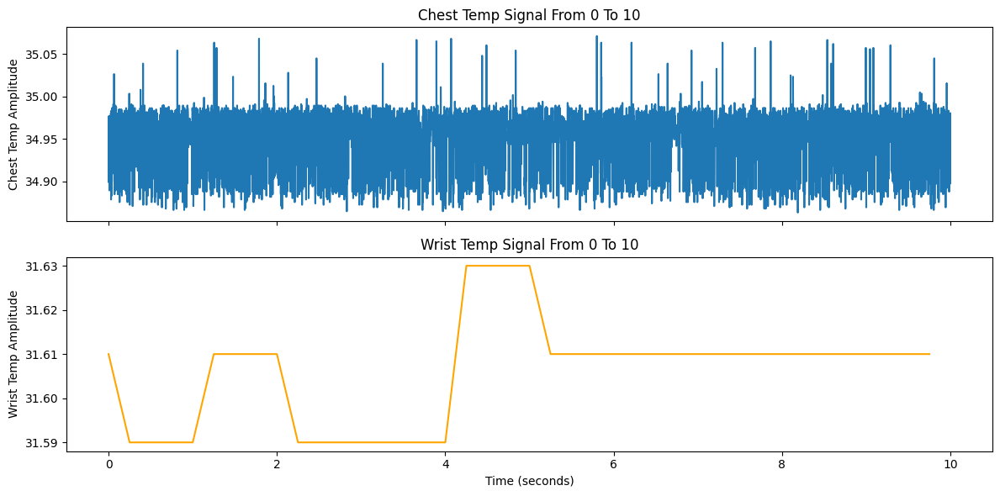

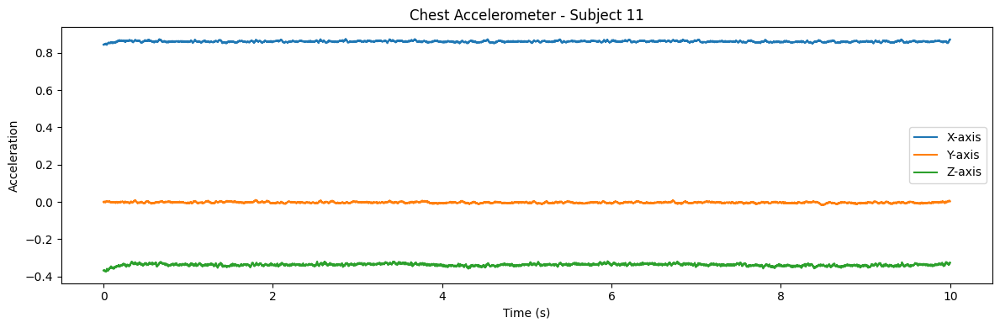

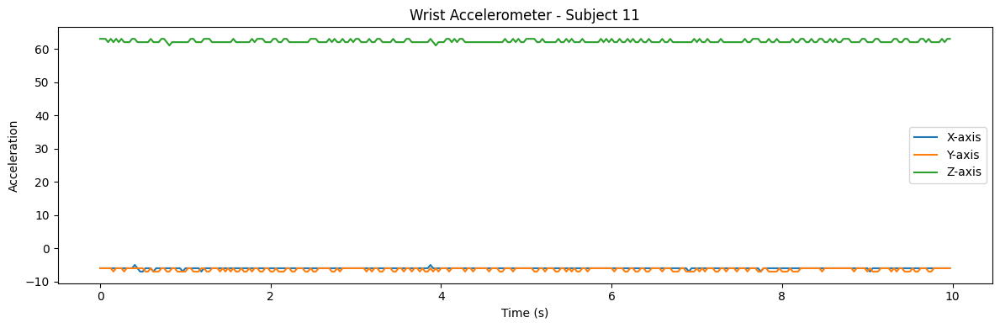

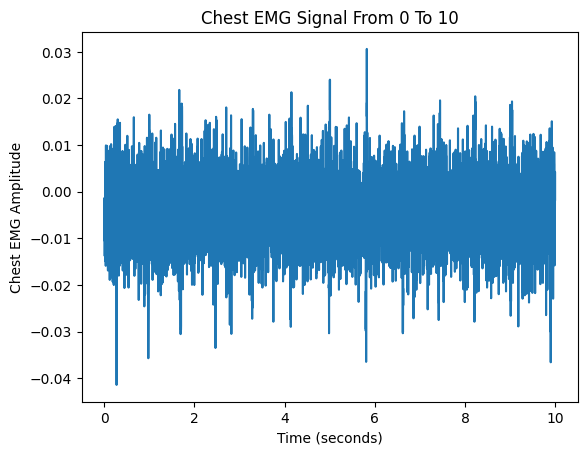

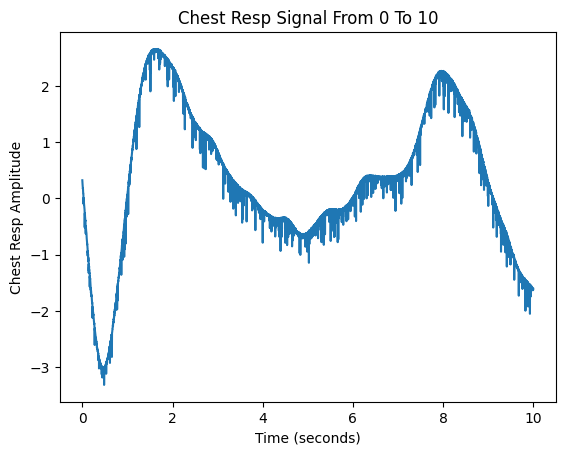

In [ ]:
plot_subject_signals(11, 3, 0, 10)

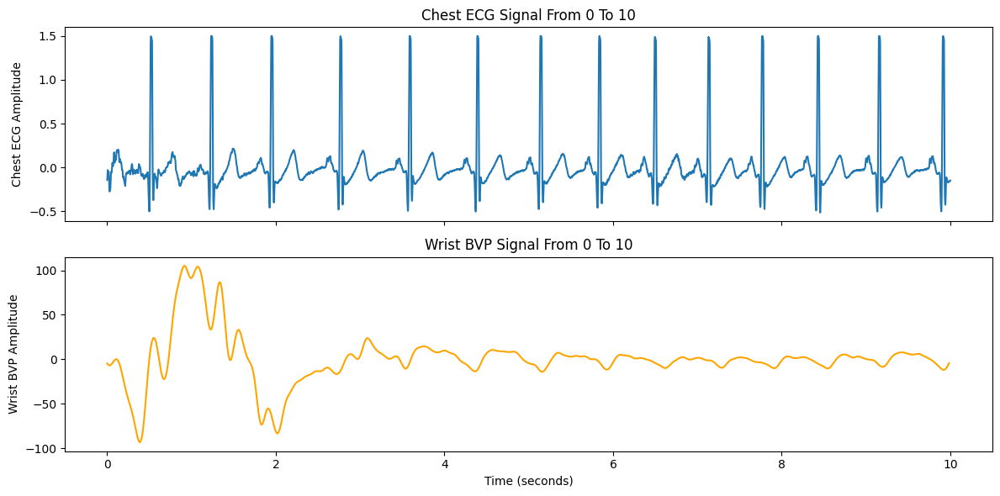

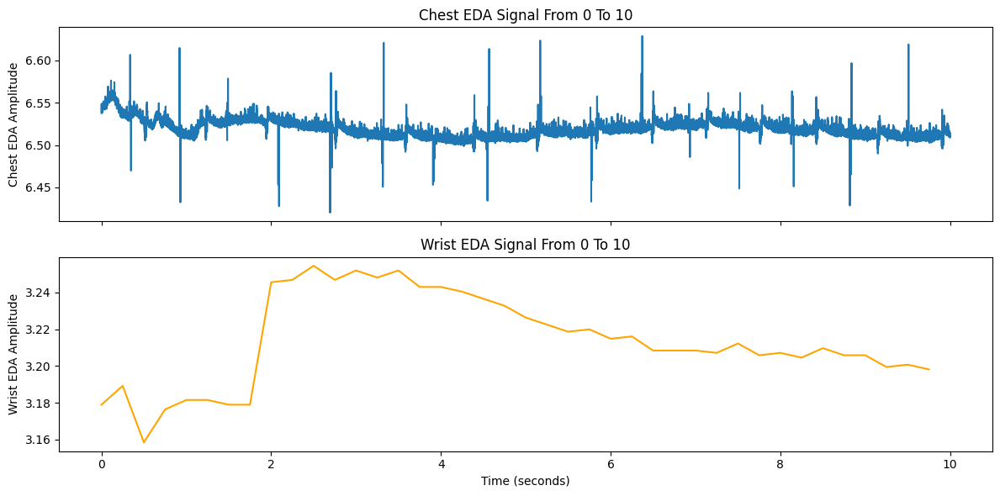

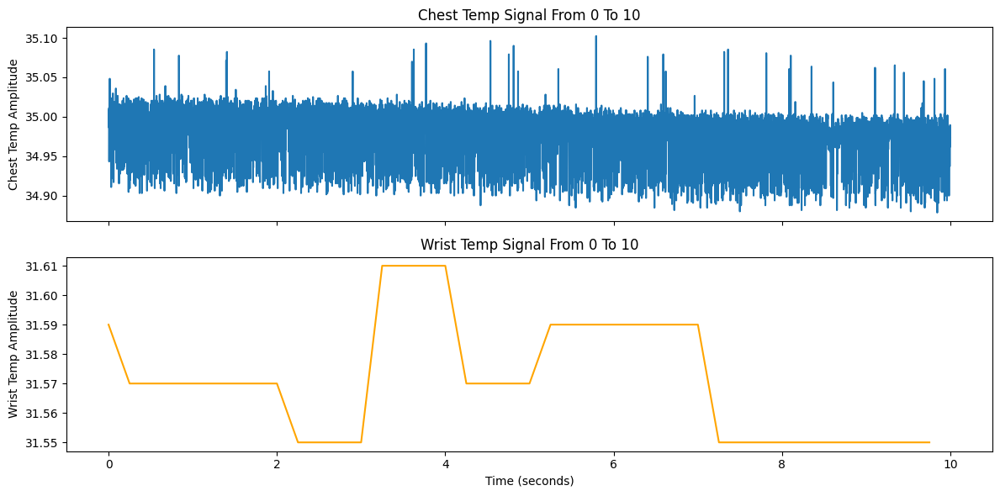

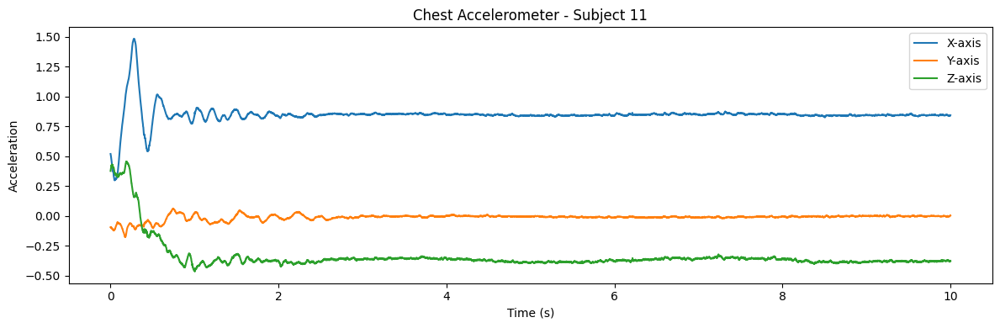

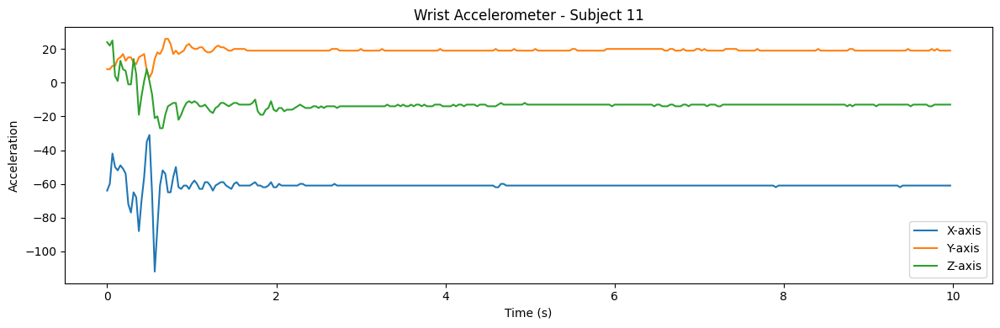

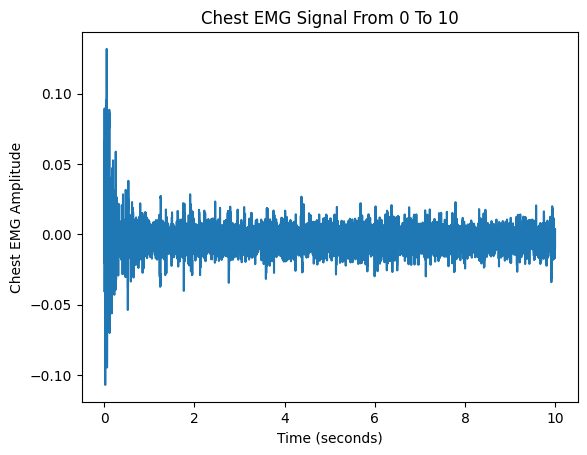

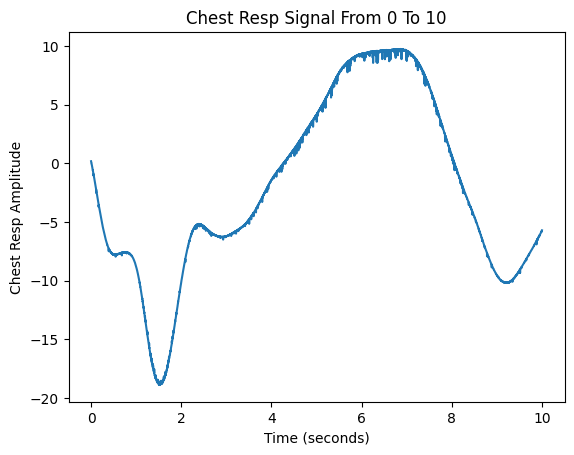

In [ ]:
plot_subject_signals(11, 4, 0, 10)

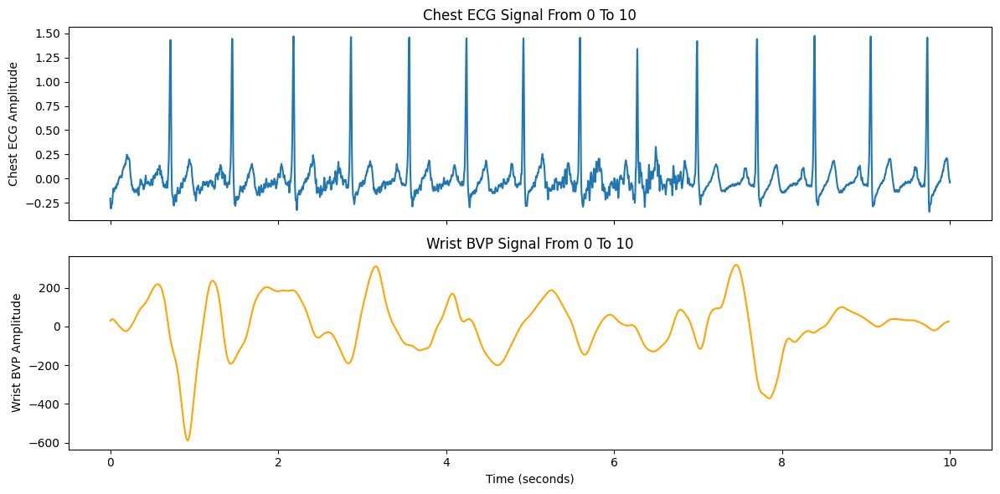

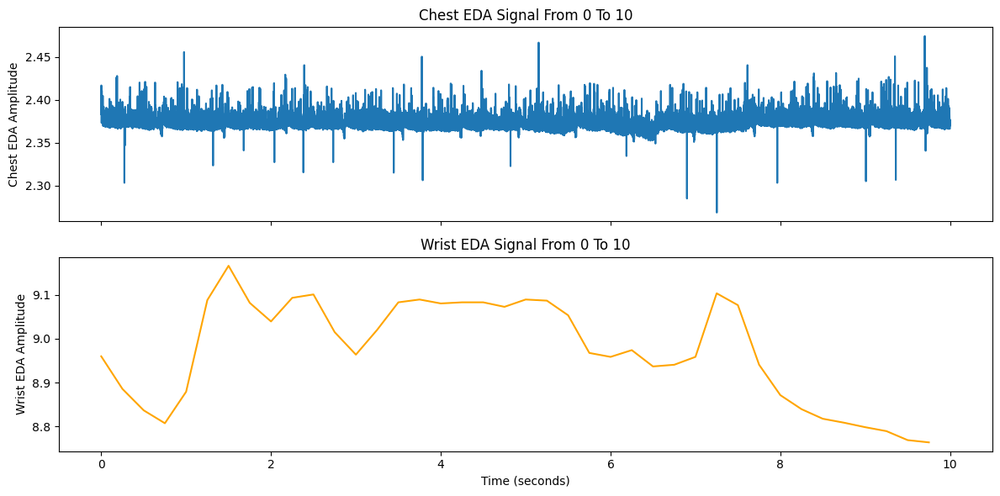

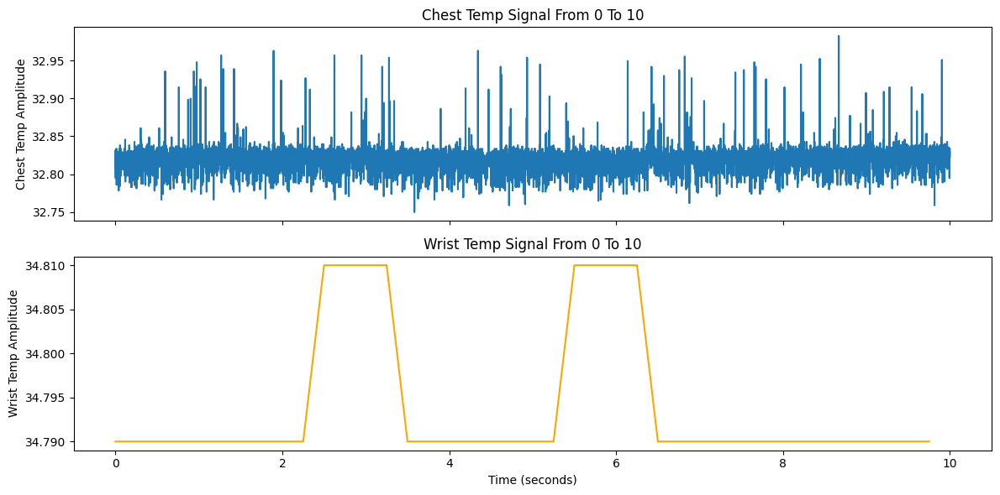

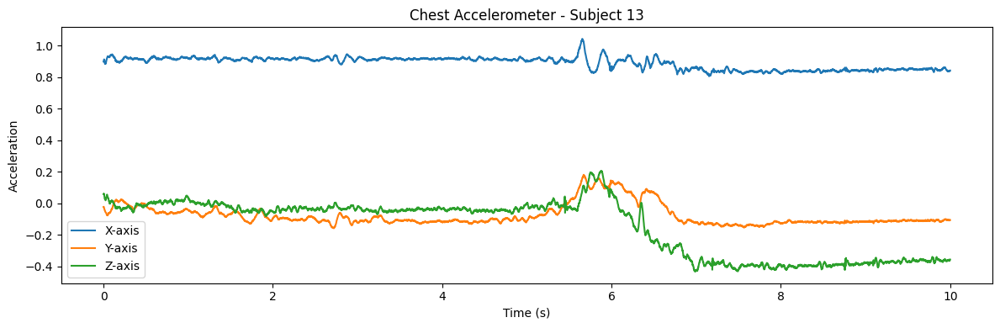

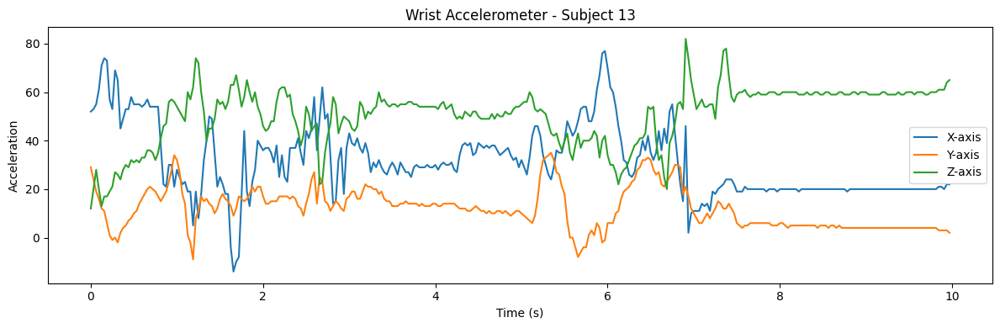

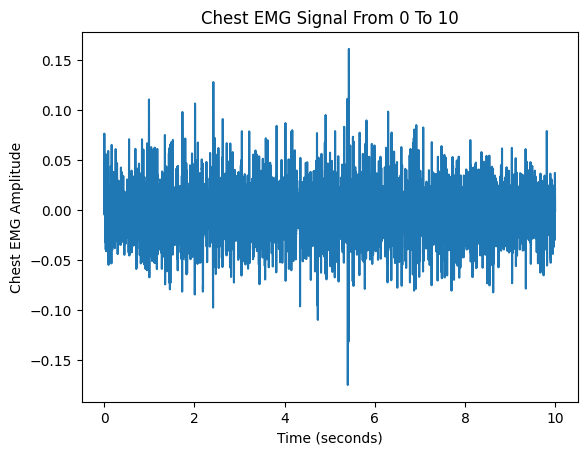

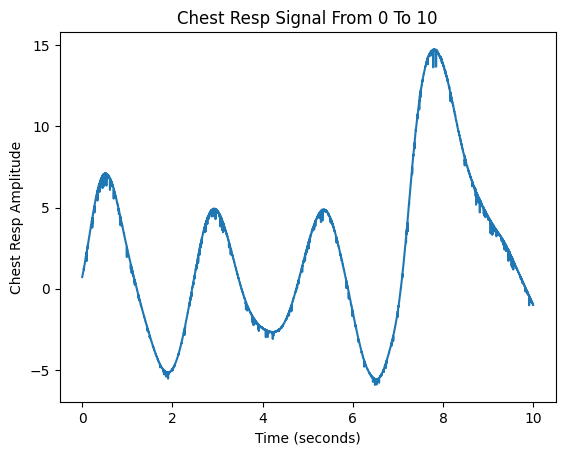

In [ ]:
plot_subject_signals(13, 1, 0, 10)

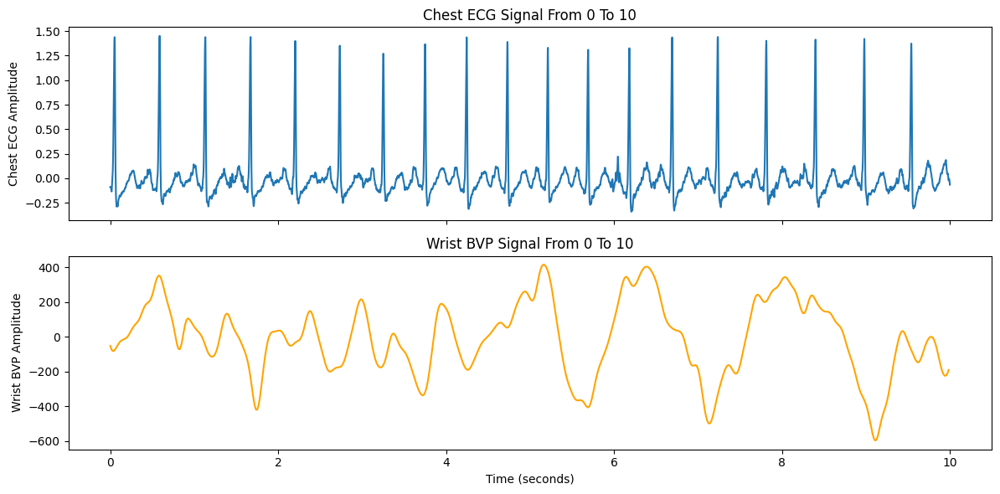

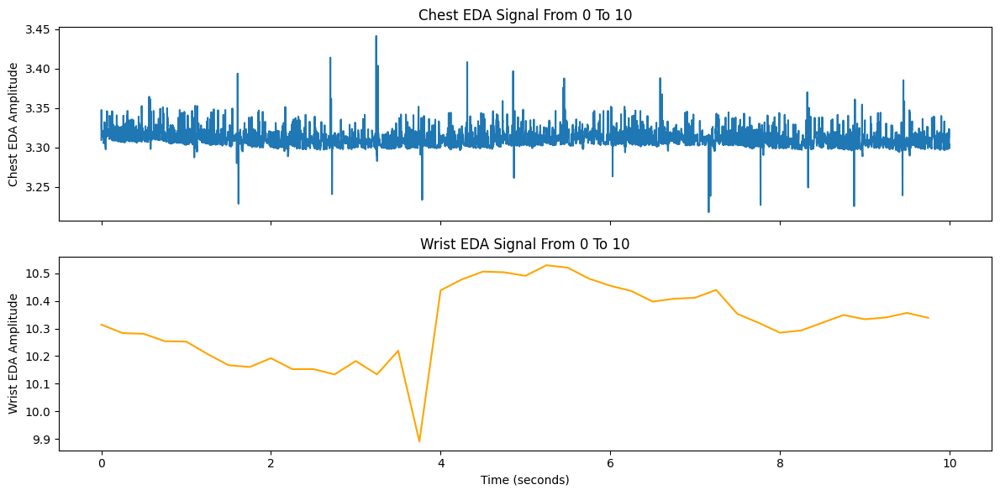

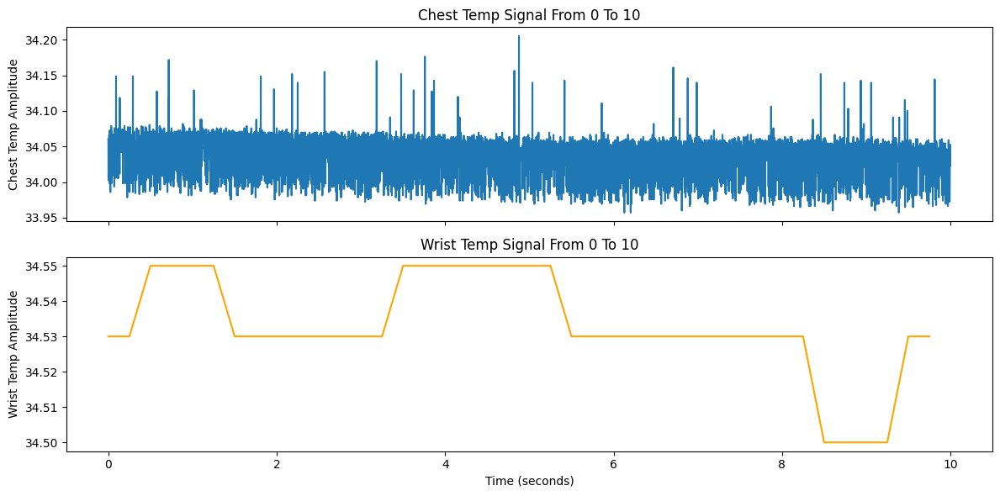

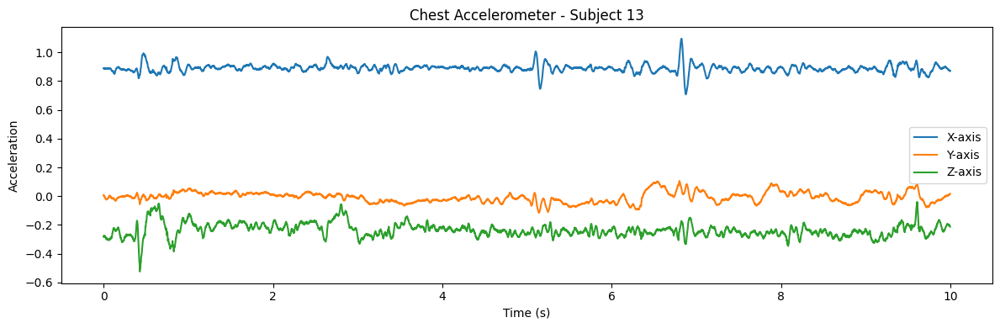

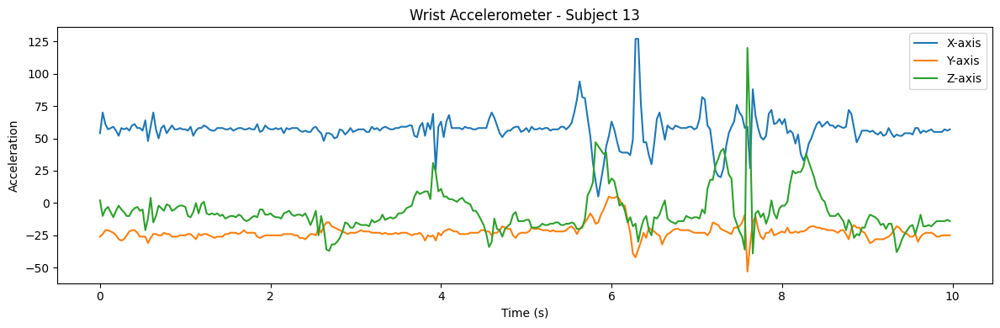

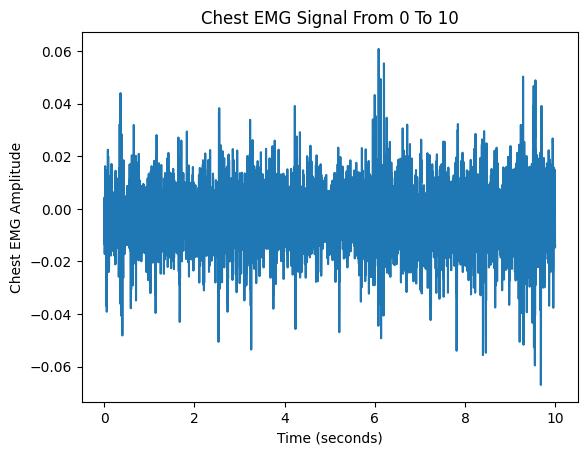

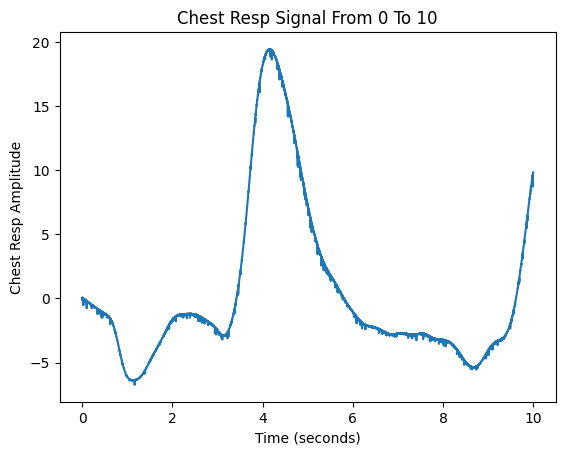

In [ ]:
plot_subject_signals(13, 2, 0, 10)

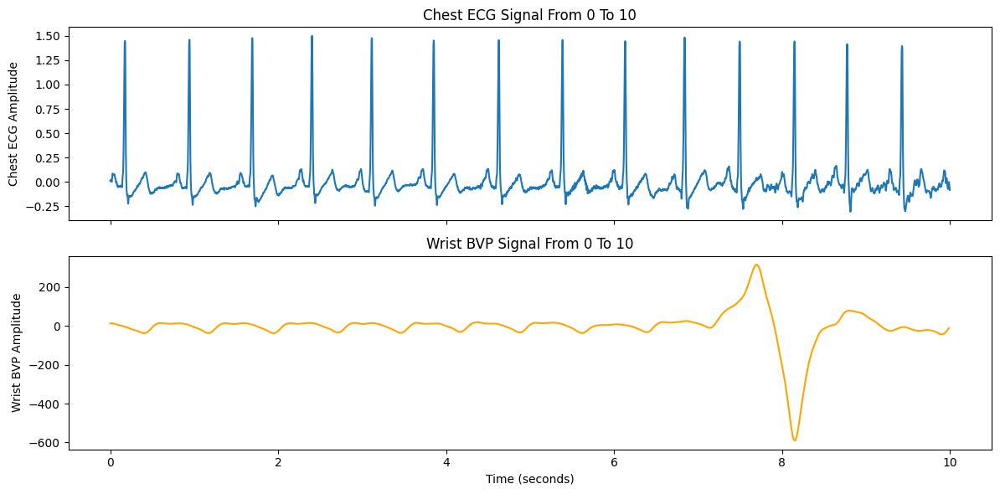

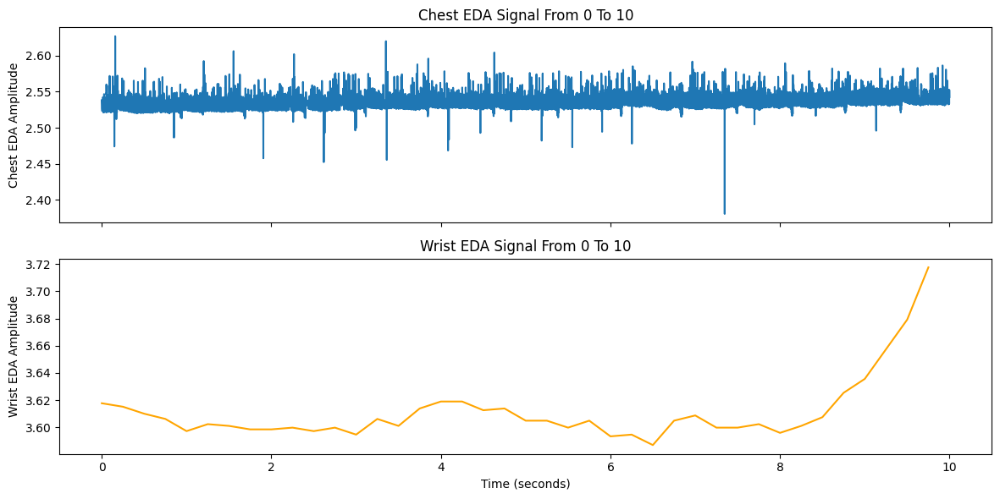

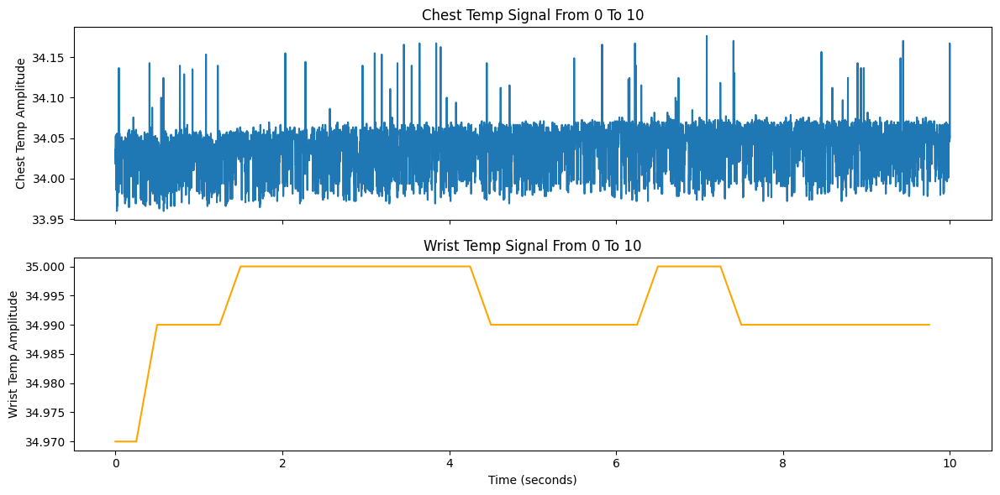

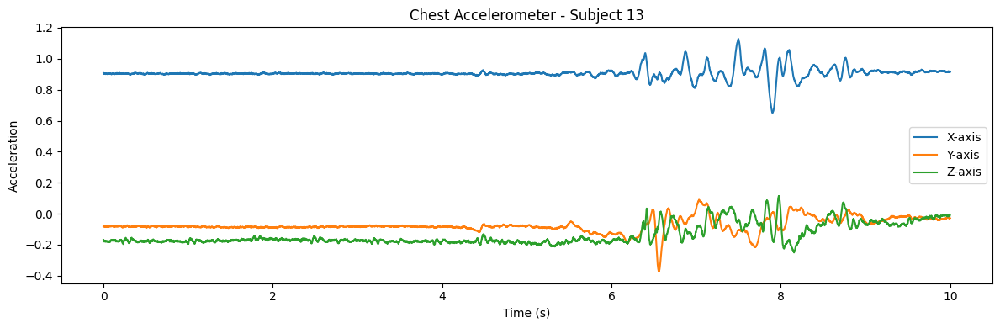

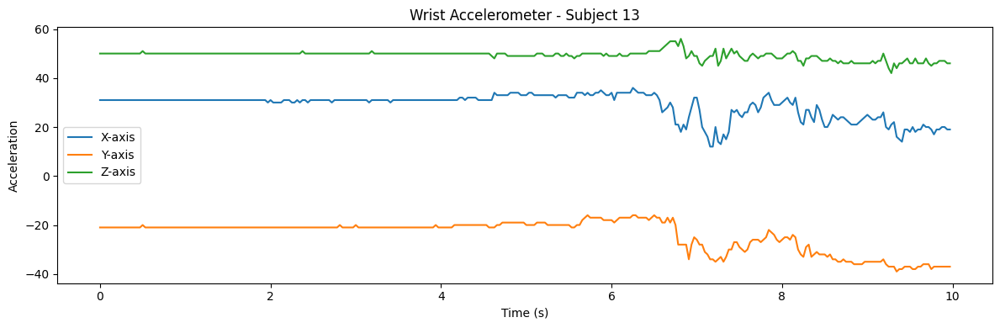

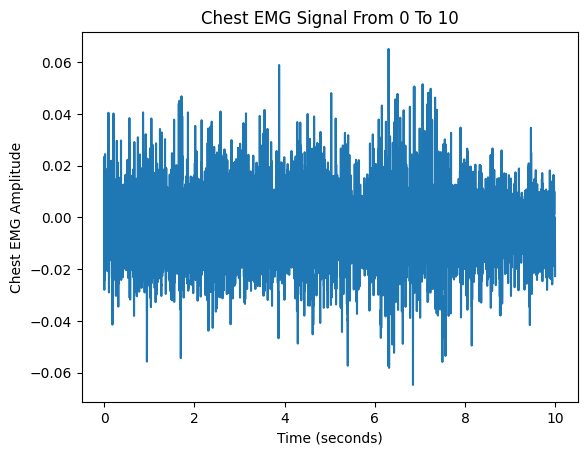

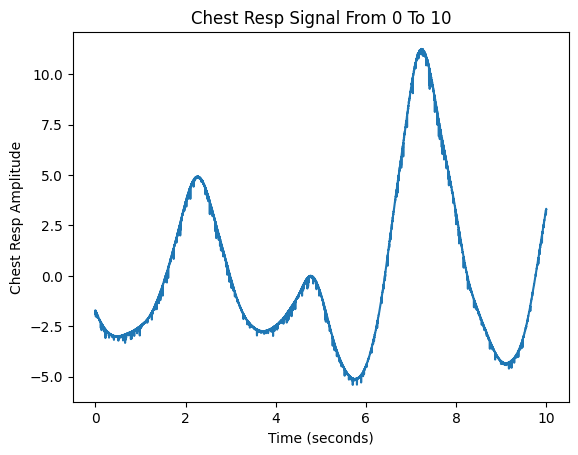

In [ ]:
plot_subject_signals(13, 3, 0, 10)

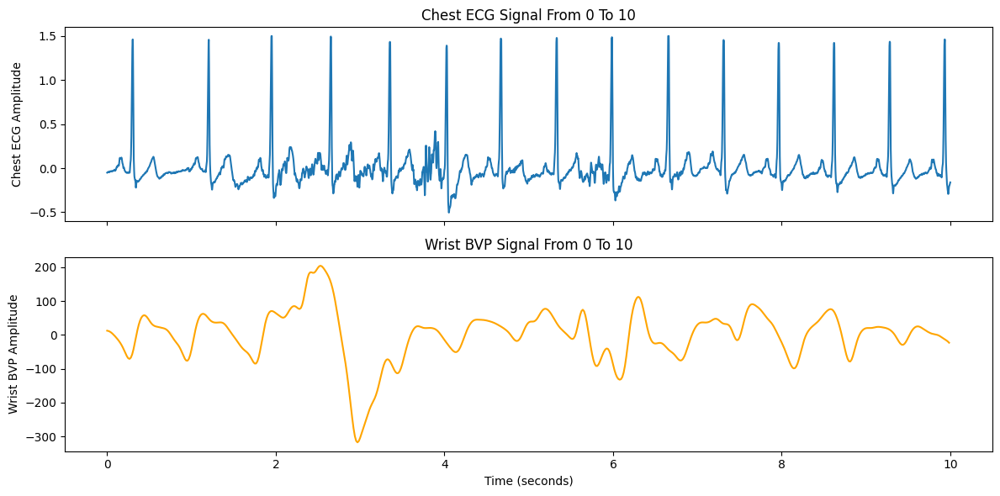

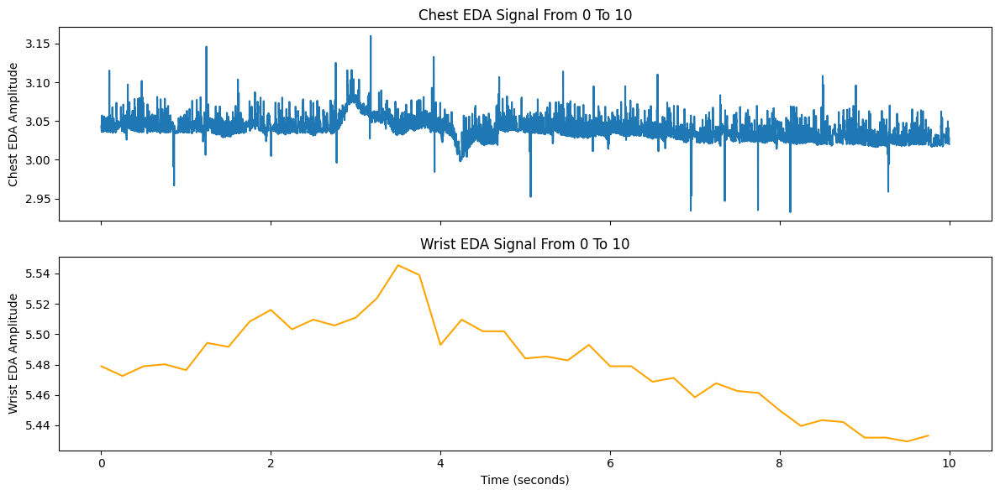

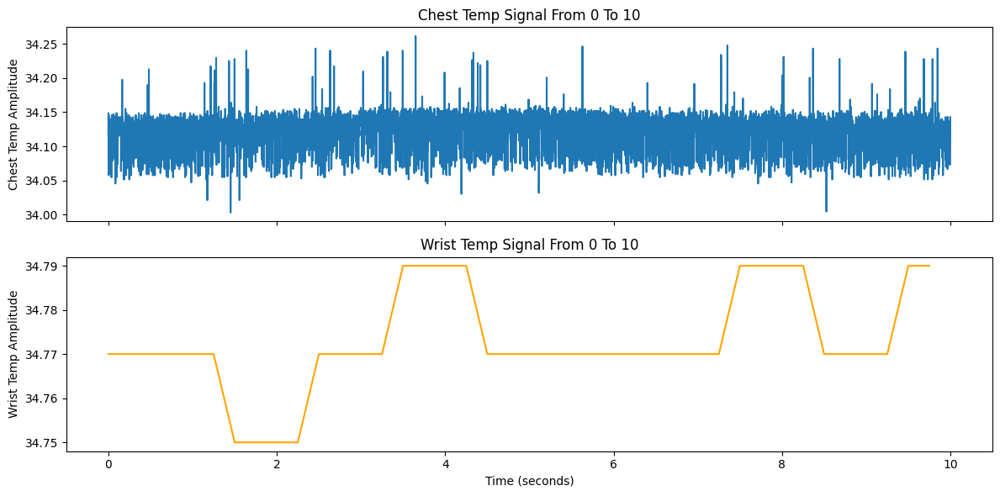

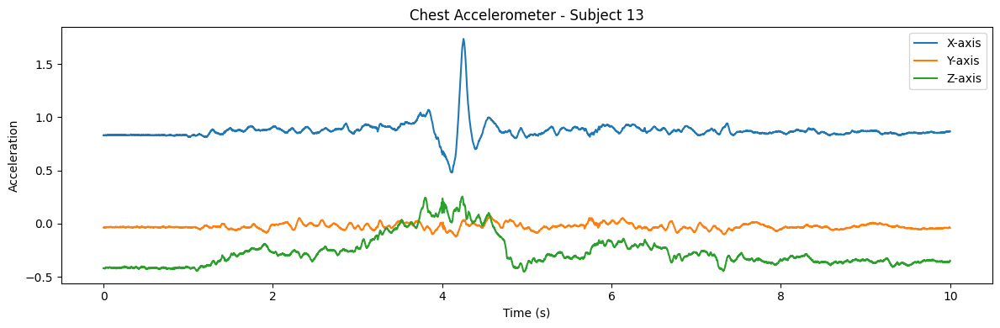

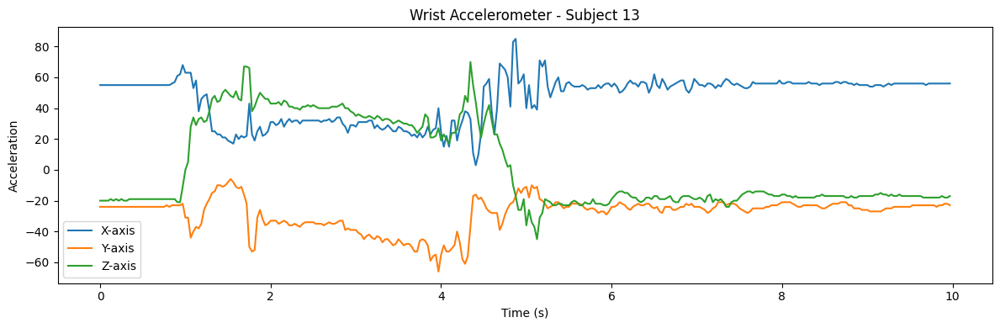

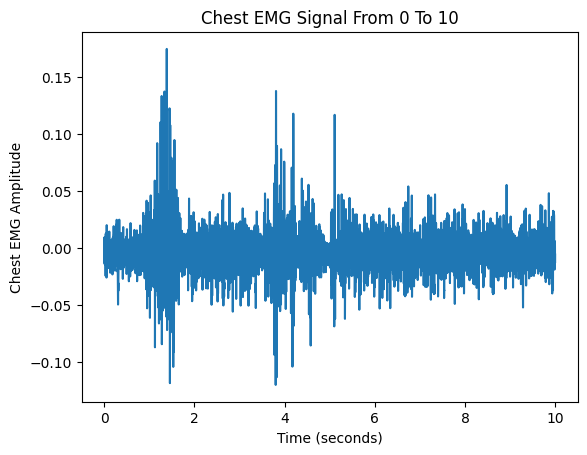

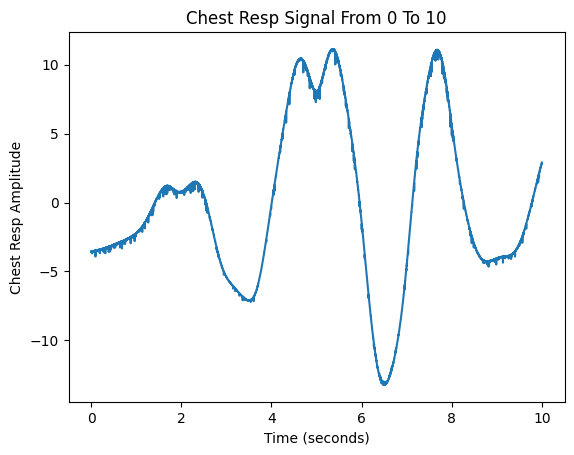

In [ ]:
plot_subject_signals(13, 4, 0, 10)

### Observations from Plotted Signals

| **State**     | **Heart Rate**           | **Skin Conductance**         | **Breathing**                     | **Muscle Activity**         | **Body Temperature**            | **Movement**                    |
|---------------|--------------------------|-------------------------------|------------------------------------|------------------------------|----------------------------------|----------------------------------|
| **Baseline**   | Regular and steady        | Stable                        | Smooth and consistent              | Relaxed                      | Maintains typical levels         | Minimal and calm                |
| **Stress**     | Noticeably elevated       | Clearly increased             | Fast or shallow                    | Tense                        | Slight changes or fluctuations   | Restless or fidgety             |
| **Amusement**  | Raised due to excitement  | Mild to moderate increase     | Irregular, often disrupted         | Increased, especially facial | Slightly elevated                | Active and expressive           |
| **Meditation** | Lower and steady          | Reduced                       | Deep, slow, and controlled         | Minimal                      | Stable or slightly lowered       | Still and composed              |


# Feature Extraction

## Summary of Extracted Features

The window size used for feature extraction is **60 seconds** with 50% overlapping. Below is a breakdown of the extracted features per signal and what each feature represents.

---

### 1. ECG (Electrocardiogram)

- **Heart Rate (bpm)**: Beats per minute.
- **MeanNN**: Average of RR intervals (time between heartbeats).
- **SDNN**: Standard deviation of NN intervals; reflects heart rate variability (HRV).
- **RMSSD**: Root mean square of successive RR interval differences; short-term HRV measure.
- **pNN50**: Percentage of successive RR intervals that differ by more than 50 ms.
- **LF (Low Frequency)**: Sympathetic and parasympathetic activity (0.04–0.15 Hz).
- **HF (High Frequency)**: Parasympathetic (vagal) activity (0.15–0.4 Hz).
- **LF/HF Ratio**: Balance between sympathetic and parasympathetic nervous systems.
- **SD1 / SD2 / SD1SD2**: Nonlinear HRV features describing Poincaré plot geometry.

---

### 2. BVP (Blood Volume Pulse)

Extracted the **same HRV features** as ECG after peak detection on the cleaned BVP signal.

---

### 3. EDA (Electrodermal Activity)

- **Tonic and Phasic Statistics**:
  - Mean, Std, Min, Max, Range for tonic and phasic components.
- **SCR Features**:
  - Height, Amplitude, Rise Time, Recovery Time (mean, std, etc.).
  - **SCR Number**: Count of Skin Conductance Responses.
  - **Number of NaNs in Recovery**: Count of Skin Conductance Responses that didn't go back to base.

---

### 4. Temperature (TEMP)

- **Statistical Features**: 
  - Mean, Std, Min, Max, Range, Slope, Rate of Change.

These features reflect the trend, variability, and changes in skin temperature over time.

---

### 5. EMG (Electromyography)

- **Number of Peaks**: Count of muscular activations detected.
- **Activity Duration Stats**:
  - Mean, Std, Min, Max, Range, Slope, Rate of Change of activation durations.

These reflect muscle activity intensity and variability.

---

### 6. Respiration (RSP)

- **Inspiratory Time**: Duration of inhalation.
- **Expiratory Time**: Duration of exhalation.
- **Ti/Te Ratio**: Ratio of inhalation to exhalation time.
- **Tidal Volume Proxy**: Difference between peaks and troughs in the respiration signal.
- **Inter-Breath Interval (IBI)**: Time between consecutive breaths.
- **Respiratory Rate**: Breaths per minute (calculated from IBI).

Each feature includes basic statistics (mean, std, etc.).

---

### 7. ACC (Accelerometer)

For each axis (X, Y, Z):
- **Statistical Features**:
  - Mean, Std, Min, Max, Range, Slope, Rate of Change.

These features reflect physical motion and orientation.

---

### 8. Survey Data (Demographics & Context)

- **Age**, **Height**, **Weight**, **Gender**
- **Lifestyle**: Coffee intake, smoking habits, exercise, illness, and data quality.

---

**Note**: All signals are sampled at their respective frequencies and analyzed after removing `NaN` values and cleand to ensure signal integrity.


In [ ]:
import neurokit2 as nk
from scipy.stats import linregress
import warnings
warnings.filterwarnings('ignore')

In [ ]:
def get_signal(signal_name, frequency, subject = 13, Mood = 2, start_second = 0, duration = 60):
    df = pd.read_parquet("filtered_wesad.parquet", columns = [signal_name, "Mood", "Subject Number"])
    subject_data = df[(df['Subject Number'] == subject) & (df['Mood'] == Mood)].reset_index(drop=True)

    if frequency * (start_second + duration) > len(subject_data):
        return None
    
    signal = subject_data[signal_name].iloc[frequency * start_second : (frequency * (start_second + duration))].dropna().reset_index(drop=True)
    return signal

In [ ]:
def extract_stat_features(signal, frequency = 1):
    signal = np.array(signal)
    values = {
    "mean" : np.mean(signal),
    "std" : np.std(signal),
    "min" : np.min(signal),
    "max" : np.max(signal),
    "range" : np.max(signal) - np.min(signal)
    }
    time_vector = np.arange(len(signal)) / frequency
    slope, _, _, _, _ = linregress(time_vector, signal)
    rate_of_change = np.mean(np.abs(np.diff(signal)))
    values.update({'slope' : slope, 'rate_of_change' : rate_of_change})
    return values

In [ ]:
def extract_hrv(signal_name, r_peaks, sampling_frequency):
    hrv_time = nk.hrv_time(r_peaks, sampling_rate=sampling_frequency)
    meanNN = hrv_time['HRV_MeanNN'].values[0]
    bpm = 60000/meanNN
    SDNN = hrv_time['HRV_SDNN'].values[0]
    RMSSD = hrv_time['HRV_RMSSD'].values[0]
    pNN50 = hrv_time['HRV_pNN50'].values[0]

    hrv_frequency = nk.hrv_frequency(r_peaks, sampling_rate=sampling_frequency)
    LF = hrv_frequency['HRV_LF'].values[0]
    HF = hrv_frequency['HRV_HF'].values[0]
    LFHF = LF/HF
    
    hrv_nonlinear = nk.hrv_nonlinear(r_peaks, sampling_rate=sampling_frequency)
    SD1 = hrv_nonlinear['HRV_SD1'].values[0]
    SD2 = hrv_nonlinear['HRV_SD2'].values[0]
    SD1SD2 = hrv_nonlinear['HRV_SD1SD2'].values[0]

    features = {}

    features.update({
        f'{signal_name} bpm' : bpm,
        f'{signal_name} meanNN' : meanNN,
        f'{signal_name} SDNN' : SDNN,
        f'{signal_name} RMSSD' : RMSSD,
        f'{signal_name} pNN50' : pNN50,
        f'{signal_name} LF' : LF,
        f'{signal_name} HF' : HF,
        f'{signal_name} LF/HF' : LFHF,
        f'{signal_name} SD1' : SD1,
        f'{signal_name} SD2' : SD2,
        f'{signal_name} SD1/SD2' : SD1SD2,
    })
    
    return features

In [ ]:
def extract_ECG_features(signal, sampling_frequency, signal_name):
    ecg_fixed, isInverted = nk.ecg_invert(signal, sampling_rate = sampling_frequency)
    if isInverted:
        del signal
        signal = ecg_fixed
        del ecg_fixed
    else:
        del ecg_fixed
    gc.collect()

    signal = nk.ecg_clean(signal, sampling_rate=sampling_frequency, method='neurokit')
    _,r_peaks = nk.ecg_peaks(signal, sampling_rate=sampling_frequency, method='promac')
    features = extract_hrv(signal_name, r_peaks, sampling_frequency)
    
    return features

In [ ]:
def extract_BVP_features(signal, sampling_frequency, signal_name):
    signal = nk.ppg_clean(signal, sampling_rate=sampling_frequency, method='elgendi')
    _, r_peaks = nk.ppg_peaks(signal, sampling_rate=sampling_frequency, method='elgendi')
    features = extract_hrv(signal_name, r_peaks, sampling_frequency)
    
    return features

In [ ]:
def extract_Temp_features(signal, frequency, signal_name):
    stat_features = extract_stat_features(signal, frequency)
    
    features = {}
    features.update({f"{signal_name} {k}": v for k, v in stat_features.items()})

    return features

In [ ]:
def extract_EDA_features(signal, frequency, signal_name):
    waves,info = nk.eda_process(signal, frequency, method='neurokit')
    
    tonic_features = extract_stat_features(waves['EDA_Tonic'], frequency)
    phasic_features = extract_stat_features(waves['EDA_Phasic'], frequency)
    height_features = extract_stat_features(info['SCR_Height'])
    amplitude_features = extract_stat_features(info['SCR_Amplitude'])
    riseTime_features = extract_stat_features(info['SCR_RiseTime'])
    
    SCR_RecoveryTime = info['SCR_RecoveryTime'][~np.isnan(info['SCR_RecoveryTime'])]
    recoveryTime_features = extract_stat_features(SCR_RecoveryTime)
    
    features = {}
    features.update({f"{signal_name} tonic {k}": v for k, v in tonic_features.items()})
    features.update({f"{signal_name} phasic {k}": v for k, v in phasic_features.items()})
    features.update({f"{signal_name} height {k}": v for k, v in height_features.items()})
    features.update({f"{signal_name} amplitude {k}": v for k, v in amplitude_features.items()})
    features.update({f"{signal_name} riseTime {k}": v for k, v in riseTime_features.items()})
    features.update({f"{signal_name} recoveryTime {k}": v for k, v in recoveryTime_features.items()})
    features.update({f"{signal_name} SCR Number" : len(info['SCR_Peaks']), f"{signal_name} number of nans in recovery": np.isnan(info['SCR_Recovery']).sum()})

    return features

In [ ]:
def extract_ACC_features(signal, frequency, signal_name):
    stat_features = extract_stat_features(signal, frequency)
    
    features = {}
    features.update({f"{signal_name} {k}": v for k, v in stat_features.items()})

    return features

In [ ]:
def extract_EMG_features(signal, frequency, signal_name):
    signal = nk.emg_clean(signal, frequency, method='biosppy')
    amp = nk.emg_amplitude(signal)
    _, info = nk.emg_activation(emg_amplitude=amp, emg_cleaned=signal, sampling_rate=frequency, method='biosppy')
    
    duration = []
    for onset, offset in zip(info['EMG_Onsets'], info['EMG_Offsets']):
        duration.append((offset - onset) / frequency)
    stat_features = extract_stat_features(duration)
    features = {}
    
    features.update({f"{signal_name} number of peaks" : len(info['EMG_Onsets'])})
    features.update({f"{signal_name} activity {k}": v for k, v in stat_features.items()})
    
    return features

In [ ]:
def extract_rsp_features(signal, frequency, signal_name):
    waves, info = nk.rsp_process(signal, frequency, method='biosppy')

    inspiratory_time = []
    expiratory_time = []

    peaks = info['RSP_Peaks']
    troughs = info['RSP_Troughs']

    for i in range(min(len(peaks), len(troughs) - 1)):
        if troughs[i] < peaks[i] < troughs[i+1]:
            inspiratory_time.append((peaks[i] - troughs[i]) / frequency)
            expiratory_time.append((troughs[i+1] - peaks[i]) / frequency)
            
    ti_te_ratio = [i/x for i,x in zip(inspiratory_time, expiratory_time)]
    tv_proxy = [waves['RSP_Clean'][p] - waves['RSP_Clean'][t] for p, t in zip(peaks, troughs)]
    ibi = [(peaks[i+1] - peaks[i]) / frequency for i in range(len(peaks) - 1)]

    inspiratory_time_stat_features = extract_stat_features(inspiratory_time)
    expiratory_time_stat_features = extract_stat_features(expiratory_time)
    time_ratio_stat_features = extract_stat_features(ti_te_ratio)
    tv_proxy_stat_features = extract_stat_features(tv_proxy)
    ibi_stat_features = extract_stat_features(ibi)

    features = {}
    features.update({f"{signal_name} Inspiratory Time {k}": v for k, v in inspiratory_time_stat_features.items()})
    features.update({f"{signal_name} Expiratory Time {k}": v for k, v in expiratory_time_stat_features.items()})
    features.update({f"{signal_name} Ti/Te Ratio {k}": v for k, v in time_ratio_stat_features.items()})
    features.update({f"{signal_name} Tidal Volume {k}": v for k, v in tv_proxy_stat_features.items()})
    features.update({f"{signal_name} Inter-breath Interval {k}": v for k, v in ibi_stat_features.items()})
    features.update({f"{signal_name} Respiratory Rate" : 60 / ibi_stat_features["mean"]})

    return features

In [ ]:
def extract_features(signals_list, frequency_list, start_second, duration, subject_number, Mood):
    function_map = {
        'Chest Acc X': extract_ACC_features,
        'Chest Acc Y': extract_ACC_features,
        'Chest Acc Z': extract_ACC_features,
        'Wrist Acc X': extract_ACC_features,
        'Wrist Acc Y': extract_ACC_features,
        'Wrist Acc Z': extract_ACC_features,
        'Chest ECG'  : extract_ECG_features,
        'Wrist BVP'  : extract_BVP_features,
        'Chest Temp' : extract_Temp_features,
        'Wrist Temp' : extract_Temp_features,
        'Chest EDA'  : extract_EDA_features,
        'Wrist EDA'  : extract_EDA_features,
        'Chest EMG'  : extract_EMG_features,
        'Chest Resp' : extract_rsp_features
    }
    features = {}

    for signal, frequency in zip(signals_list, frequency_list):
        signal_value = get_signal(signal, 700, subject_number, Mood, start_second, duration)
        
        if signal_value is None or len(signal_value) <= 0:
            return None
            
        else:
            extractor_function = function_map[signal]
            features_dict = extractor_function(signal_value, frequency, signal)
            features.update({f"{k}": v for k, v in features_dict.items()})
            
    return features

In [ ]:
def get_subject_survey_features(subject, Mood):
    df = pd.read_parquet("filtered_wesad.parquet", columns = ['Age', 'Height', 'Weight', 'Gender', 'Drink Coffee Today', 'Drink Coffee Last Hour', 'Do Sports Today', 'Smoker', 'Smoke Last Hour', 'Feel Ill Today', 'Accurate Data', "Mood", "Subject Number"])
    subject_data = df[(df['Subject Number'] == subject) & (df['Mood'] == Mood)]
    return subject_data.iloc[0].to_dict()

In [ ]:
signals = ['Chest Acc X', 'Chest Acc Y', 'Chest Acc Z', 'Chest ECG', 'Chest EMG', 'Chest EDA', 'Chest Temp', 'Chest Resp','Wrist Acc X', 'Wrist Acc Y', 'Wrist Acc Z', 'Wrist BVP', 'Wrist EDA', 'Wrist Temp']
frequencies = [700, 700, 700, 700, 700, 700, 700, 700, 32, 32, 32, 64, 4, 4]
features = {}
df = pd.DataFrame()

for subject_number in range(2, 18):
    if subject_number == 12:
        continue
    
    for Mood in range(1, 5):
        start_second = 0
        duration = 60
        while True:
            subject_new_features = extract_features(signals, frequencies, start_second, duration, subject_number, Mood)
            
            if subject_new_features is not None:
                subject_survey_features = get_subject_survey_features(subject_number, Mood)
                subject_new_features.update({f"{k}": v for k, v in subject_survey_features.items()})
                df = pd.concat([df, pd.DataFrame([subject_new_features])], ignore_index=True)
                start_second += 30
                
            else:
                break

In [ ]:
df.to_parquet("wesad_data_features.parquet")

In [ ]:
df.head()

,Chest Acc X mean,Chest Acc X std,Chest Acc X min,Chest Acc X max,Chest Acc X range,Chest Acc X slope,Chest Acc X rate_of_change,Chest Acc Y mean,Chest Acc Y std,Chest Acc Y min,...,Gender,Drink Coffee Today,Drink Coffee Last Hour,Do Sports Today,Smoker,Smoke Last Hour,Feel Ill Today,Accurate Data,Mood,Subject Number
0,0.759085,0.127055,0.5390,1.1454,0.6064,-0.006226,0.001433,-0.130697,0.042169,-0.2778,...,1,-1,-1,-1,-1,-1,-1,-1,1,2
1,0.636856,0.066817,0.5390,1.1454,0.6064,-0.001683,0.001377,-0.111829,0.015888,-0.2076,...,1,-1,-1,-1,-1,-1,-1,-1,1,2
2,0.619940,0.006468,0.5808,0.6446,0.0638,0.000046,0.001305,-0.107815,0.008387,-0.1446,...,1,-1,-1,-1,-1,-1,-1,-1,1,2
3,0.621261,0.005610,0.5910,0.6446,0.0536,0.000033,0.001298,-0.103998,0.005044,-0.1374,...,1,-1,-1,-1,-1,-1,-1,-1,1,2
4,0.648417,0.076594,0.5770,0.9350,0.3580,0.001980,0.001355,-0.110911,0.042728,-0.2896,...,1,-1,-1,-1,-1,-1,-1,-1,1,2


# Cleaning the final Dataframe

Some features could not be extracted in certain windows due to the window size limitations, so those windows were excluded, and only the successfully extracted records were used for training and testing the models.

In [ ]:
print(df.isnull().sum())
print(len(df.index))

Chest Acc X mean     0
Chest Acc X std      0
Chest Acc X min      0
Chest Acc X max      0
Chest Acc X range    0
                    ..
Smoke Last Hour      0
Feel Ill Today       0
Accurate Data        0
Mood                 0
Subject Number       0
Length: 223, dtype: int64
1293


In [ ]:
df_cleaned = df.dropna()
print(df_cleaned.isnull().sum())
print(len(df_cleaned))

Chest Acc X mean     0
Chest Acc X std      0
Chest Acc X min      0
Chest Acc X max      0
Chest Acc X range    0
                    ..
Smoke Last Hour      0
Feel Ill Today       0
Accurate Data        0
Mood                 0
Subject Number       0
Length: 223, dtype: int64
664


In [ ]:
df.to_parquet("filtered_wesad_data_features.parquet")

In [ ]:
df_cleaned.head()

,Chest Acc X mean,Chest Acc X std,Chest Acc X min,Chest Acc X max,Chest Acc X range,Chest Acc X slope,Chest Acc X rate_of_change,Chest Acc Y mean,Chest Acc Y std,Chest Acc Y min,...,Gender,Drink Coffee Today,Drink Coffee Last Hour,Do Sports Today,Smoker,Smoke Last Hour,Feel Ill Today,Accurate Data,Mood,Subject Number
0,0.759085,0.127055,0.5390,1.1454,0.6064,-0.006226,0.001433,-0.130697,0.042169,-0.2778,...,1,-1,-1,-1,-1,-1,-1,-1,1,2
1,0.636856,0.066817,0.5390,1.1454,0.6064,-0.001683,0.001377,-0.111829,0.015888,-0.2076,...,1,-1,-1,-1,-1,-1,-1,-1,1,2
4,0.648417,0.076594,0.5770,0.9350,0.3580,0.001980,0.001355,-0.110911,0.042728,-0.2896,...,1,-1,-1,-1,-1,-1,-1,-1,1,2
5,0.660468,0.073354,0.5770,0.9350,0.3580,-0.000078,0.001340,-0.086645,0.051961,-0.2896,...,1,-1,-1,-1,-1,-1,-1,-1,1,2
8,0.640738,0.004852,0.6058,0.6862,0.0804,-0.000006,0.001280,-0.064341,0.006075,-0.1196,...,1,-1,-1,-1,-1,-1,-1,-1,1,2


In [ ]:
print(len(df_cleaned[df_cleaned['Subject Number'] != 16]))      

627


In [ ]:
df_cleaned = df_cleaned[df_cleaned['Subject Number'] != 16]     #Subject 16 caused an error during feature extraction and was therefore excluded from the analysis.
df_cleaned = df_cleaned.drop(columns=['Drink Coffee Last Hour', 'Smoke Last Hour', 'Subject Number'])   #Since the 'Subject Number' is no longer needed, and the other two features only contained the value 'No', they were removed from the dataframe

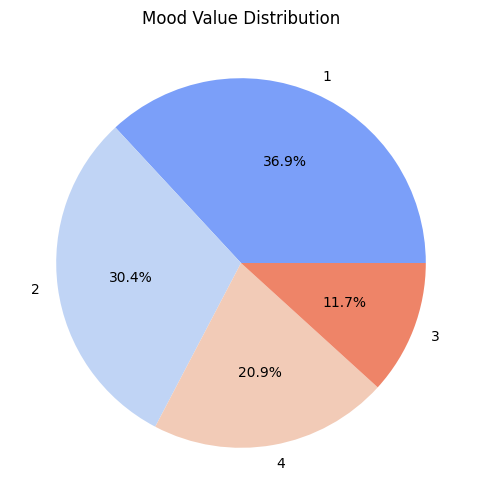

In [ ]:
mood_counts = df_cleaned['Mood'].value_counts(normalize=True)
plt.figure(figsize=(6, 6))
plt.pie(mood_counts.values, labels=mood_counts.index, autopct="%1.1f%%", colors=sns.color_palette("coolwarm", len(mood_counts)))
plt.title("Mood Value Distribution")
plt.show()

In [ ]:
# Randomly assigns 0 to approximately 50% of the values in each binary column, to simulating missing values (Inofrmation was not Provided) to make the feature optional
binary_cols = ['Gender', 'Drink Coffee Today', 'Do Sports Today', 'Smoker', 'Feel Ill Today', 'Accurate Data']
np.random.seed(42)

for col in binary_cols:
    mask = np.random.rand(len(df_cleaned)) < 0.5
    df_cleaned.loc[mask, col] = 0

In [ ]:
df_cleaned.to_parquet("final_wesad_data_features.parquet")      #save the last version of the data after cleaning 

# Models Training and Evaluation

To effectively capture different real-life use cases and research perspectives, we designed multiple models, each tailored for a specific purpose. These models fall into two main categories:

---

## Category 1: **WESAD-Centric Models (Controlled Conditions)**

These models are developed based strictly on the controlled conditions and features extracted from the WESAD dataset.

### 🧠 Model 1: *VitalCore Classifier*
- **Type**: One-vs-Rest Logistic Regression
- **Features Used**: Top 10 features from **ECG**, **Chest EDA**, and **Respiration**
- **Rationale**: Focuses on physiological signals that are frequently referenced in academic literature.
- **Performance**: Achieved **79% accuracy**

### 🌐 Model 2: *FusionTop Classifier*
- **Type**: One-vs-Rest Logistic Regression
- **Features Used**: Top 15 features from **all available signals**
- **Rationale**: Combines a wider range of informative signals for improved accuracy.
- **Performance**: Achieved **84% accuracy**

---

## Category 2: **Real-World-Oriented Models (Wearable Scenarios)**

These models are designed with practical, real-world deployment in mind—targeting wearables like smartwatches, fitness trackers, and sports gear.

### ⌚ Model 3: *SmartBand Core*
- **Type**: Weighted One-vs-One Logistic Regression
- **Features Used**: **BVP** and **Wrist Acceleration**
- **Rationale**: Utilizes only sensors commonly available in everyday smartwatches.
- **Performance**: Achieved **74% accuracy**

### 🏃‍♂️ Model 4: *WristFit Classifier*
- **Type**: Weighted One-vs-One Logistic Regression
- **Features Used**: **All Wrist-based Signals**
- **Rationale**: Tailored for fitness wearables and advanced smartwatch usage.
- **Performance**: Achieved **81% accuracy**

### 🧍 Model 5: *ChestPro Classifier*
- **Type**: Weighted One-vs-One Logistic Regression
- **Features Used**: **All Chest-based Signals**
- **Rationale**: Suitable for athletes in sports (e.g., football) where limb wearables are impractical.
- **Performance**: Achieved **85% accuracy**

### 🔬 Model 6: *FullScope Model*
- **Type**: Weighted One-vs-One Logistic Regression
- **Features Used**: **All Extracted Features**
- **Rationale**: Designed for experimental setups and comprehensive research environments.
- **Performance**: Achieved **87% accuracy**

---

## Summary & Future Improvements

All models demonstrate promising results, but there's still room for enhancement. With access to larger, more diverse datasets—especially those capturing more natural variations—model performance and generalization can be significantly improved.

## *VitalCore Classifier*

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from sklearn.feature_selection import SelectKBest, f_classif

In [ ]:
df = pd.read_parquet("final_wesad_data_features.parquet")

not_needed_columns = ['Age', 'Gender', 'Drink Coffee Today', 'Do Sports Today', 
                    'Smoker', 'Feel Ill Today', 'Accurate Data', 'Height', 'Weight']
numerical_cols = [col for col in df.columns if col not in not_needed_columns]

In [ ]:
X = df.drop(['Mood'] + [col for col in df.columns if col.startswith("Chest Acc") or col.startswith("Chest EMG") or col.startswith("Chest Temp") or col.startswith("Wrist")], axis=1)
y = df['Mood']

In [ ]:
selector = SelectKBest(score_func=f_classif, k=10)
X_new = selector.fit_transform(X, y)
selected_indices = selector.get_support(indices=True)
selected_features = X.columns[selected_indices]
X = X[selected_features]

In [ ]:
X.head()

,Chest ECG bpm,Chest EDA riseTime std,Chest EDA riseTime max,Chest Resp Inspiratory Time mean,Chest Resp Inspiratory Time min,Chest Resp Expiratory Time mean,Chest Resp Inter-breath Interval mean,Chest Resp Inter-breath Interval min,Chest Resp Inter-breath Interval max,Chest Resp Respiratory Rate
0,80.671043,0.374593,1.710000,1.780510,1.144286,1.767143,3.499388,2.150000,5.422857,17.145856
1,74.974671,0.236525,1.011429,1.430672,1.094286,1.520000,3.034370,2.125714,5.277143,19.773464
4,74.733096,0.707188,2.055714,1.428908,1.160000,1.447731,2.903193,2.234286,4.481429,20.666898
5,75.179604,0.593571,2.055714,1.419683,0.818571,1.498889,2.914127,2.040000,5.078571,20.589357
8,72.760102,0.142093,0.818571,1.370150,1.070000,1.360977,2.726316,2.297143,3.282857,22.007722


In [ ]:
classes = np.unique(y)
n_classes = len(classes)
y_bin = label_binarize(y, classes=classes)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
y_test_bin = label_binarize(y_test, classes=classes)

In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
model = OneVsRestClassifier(LogisticRegression(penalty='l1', solver='liblinear', C= 10, max_iter= 1000, class_weight = 'balanced', multi_class='ovr'))
model.fit(X_train, y_train)

OneVsRestClassifier(estimator=LogisticRegression(C=10, class_weight='balanced',
                                                 max_iter=1000,
                                                 multi_class='ovr',
                                                 penalty='l1',
                                                 solver='liblinear'))

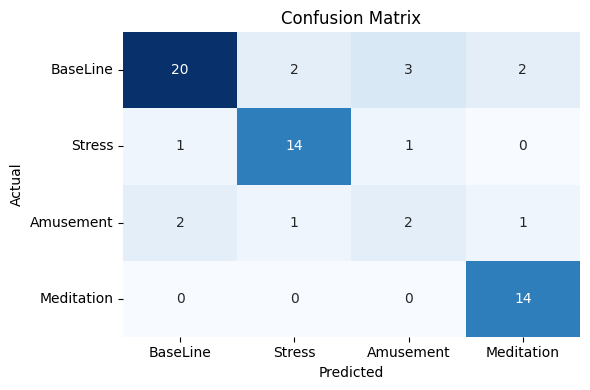


Classification Report:
               precision    recall  f1-score   support

    BaseLine       0.87      0.74      0.80        27
      Stress       0.82      0.88      0.85        16
   Amusement       0.33      0.33      0.33         6
  Meditation       0.82      1.00      0.90        14

    accuracy                           0.79        63
   macro avg       0.71      0.74      0.72        63
weighted avg       0.80      0.79      0.79        63

Training Accuracy: 0.7837
Testing Accuracy: 0.7937
Cross-Validation Accuracy: 75.35% (+/- 2.05%)


In [ ]:
y_pred = model.predict(X_test)
classes_names = ['BaseLine', 'Stress', 'Amusement', 'Meditation']

cm = confusion_matrix(y_test, y_pred)
cr = classification_report(y_test, y_pred, target_names=classes_names)

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=classes_names,
            yticklabels=classes_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

print("\nClassification Report:\n", cr)
print(f"Training Accuracy: {model.score(X_train, y_train):.4f}")
print(f"Testing Accuracy: {model.score(X_test, y_test):.4f}")
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print(f"Cross-Validation Accuracy: {cv_scores.mean() * 100:.2f}% (+/- {cv_scores.std() * 100:.2f}%)")

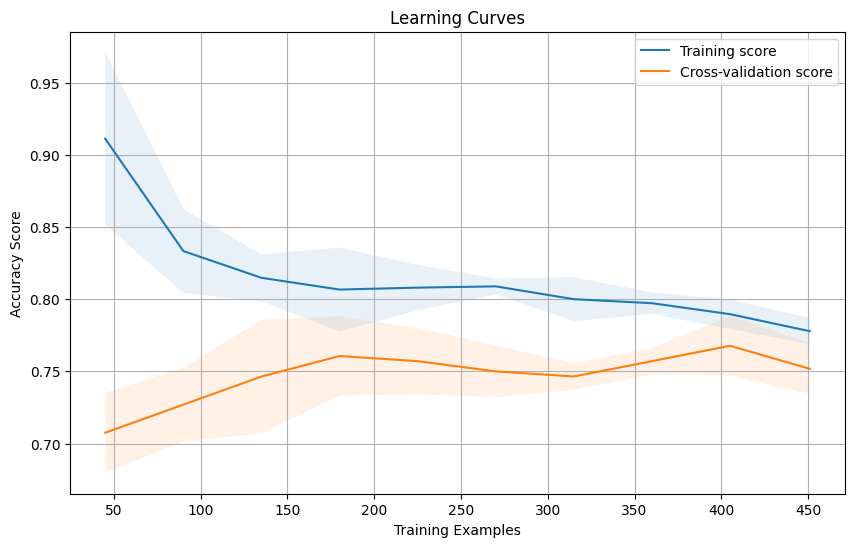

In [ ]:
def plot_learning_curve(estimator, X, y, filename):
    train_sizes, train_scores, val_scores = learning_curve(
        estimator, X, y, cv=5, n_jobs=-1, shuffle=True, train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy'
    )
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)
    val_std = np.std(val_scores, axis=1)
    
    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_mean, label='Training score')
    plt.plot(train_sizes, val_mean, label='Cross-validation score')
    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1)
    plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.1)
    plt.xlabel('Training Examples')
    plt.ylabel('Accuracy Score')
    plt.title('Learning Curves')
    plt.legend(loc='best')
    plt.grid(True)
    plt.savefig(filename)
    plt.show()

plot_learning_curve(model, X_train, y_train, 'Learning Curve')

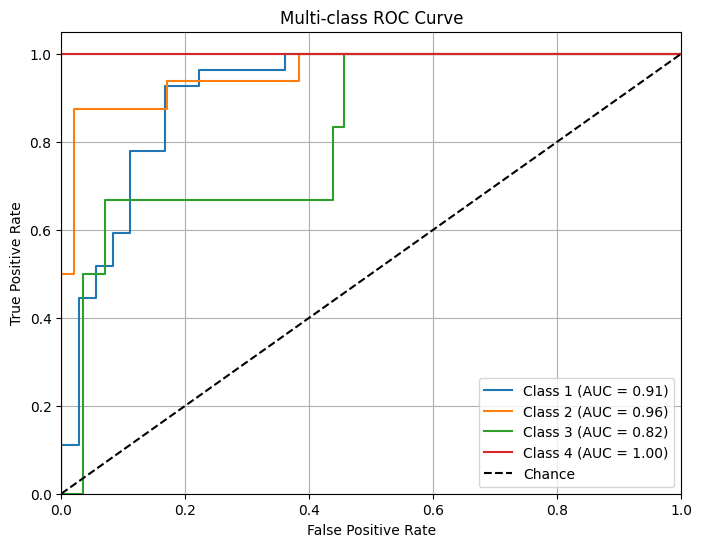

In [ ]:
y_score = np.array(model.predict_proba(X_test))

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(8, 6))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {classes[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Chance')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-class ROC Curve')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

In [ ]:
import joblib
model_and_scaler_dict = {
    'model': model,
    'scaler': scaler
}
joblib.dump(model_and_scaler_dict, 'VitalCore Classifier.pkl')

## *FusionTop Classifier*

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from sklearn.feature_selection import SelectKBest, f_classif

In [ ]:
df = pd.read_parquet("final_wesad_data_features.parquet")

categorical_cols = ['Gender', 'Drink Coffee Today', 'Do Sports Today', 
                    'Smoker', 'Feel Ill Today', 'Accurate Data']
df = pd.get_dummies(df, columns=categorical_cols).astype(np.float64)
df['Mood'] = df['Mood'].map(int)

In [ ]:
X = df.drop(['Mood'], axis=1)
y = df['Mood']

In [ ]:
selector = SelectKBest(score_func=f_classif, k=15)
X_new = selector.fit_transform(X, y)
selected_indices = selector.get_support(indices=True)
selected_features = X.columns[selected_indices]
X = X[selected_features]

In [ ]:
X.head()

,Chest Acc X rate_of_change,Chest Acc Y rate_of_change,Chest Acc Z rate_of_change,Chest ECG bpm,Chest ECG meanNN,Chest EDA riseTime std,Chest EDA riseTime max,Chest Resp Inspiratory Time mean,Chest Resp Inspiratory Time min,Chest Resp Expiratory Time mean,Chest Resp Inter-breath Interval mean,Chest Resp Inter-breath Interval min,Chest Resp Inter-breath Interval max,Chest Resp Respiratory Rate,Wrist EDA riseTime mean
0,0.001433,0.001356,0.002363,80.671043,743.761302,0.374593,1.710000,1.780510,1.144286,1.767143,3.499388,2.150000,5.422857,17.145856,0.875000
1,0.001377,0.001317,0.002302,74.974671,800.270270,0.236525,1.011429,1.430672,1.094286,1.520000,3.034370,2.125714,5.277143,19.773464,0.861111
4,0.001355,0.001305,0.002320,74.733096,802.857143,0.707188,2.055714,1.428908,1.160000,1.447731,2.903193,2.234286,4.481429,20.666898,0.575000
5,0.001340,0.001312,0.002308,75.179604,798.088803,0.593571,2.055714,1.419683,0.818571,1.498889,2.914127,2.040000,5.078571,20.589357,0.607143
8,0.001280,0.001250,0.002169,72.760102,824.627767,0.142093,0.818571,1.370150,1.070000,1.360977,2.726316,2.297143,3.282857,22.007722,0.558824


In [ ]:
classes = np.unique(y)
n_classes = len(classes)
y_bin = label_binarize(y, classes=classes)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
y_test_bin = label_binarize(y_test, classes=classes)

In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
model = OneVsRestClassifier(LogisticRegression(penalty='l1', solver='liblinear', C= 10, max_iter= 1000, class_weight = 'balanced', multi_class='ovr'))
model.fit(X_train, y_train)

OneVsRestClassifier(estimator=LogisticRegression(C=10, class_weight='balanced',
                                                 max_iter=1000,
                                                 multi_class='ovr',
                                                 penalty='l1',
                                                 solver='liblinear'))

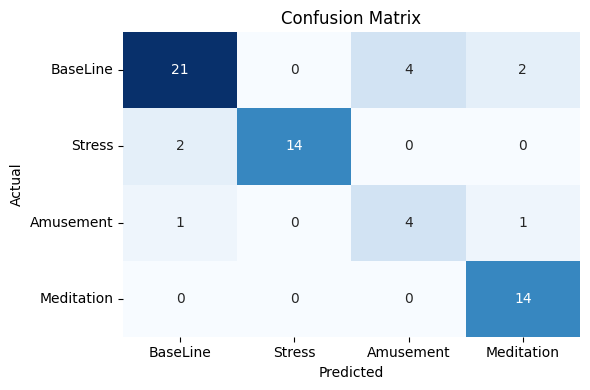


Classification Report:
               precision    recall  f1-score   support

    BaseLine       0.88      0.78      0.82        27
      Stress       1.00      0.88      0.93        16
   Amusement       0.50      0.67      0.57         6
  Meditation       0.82      1.00      0.90        14

    accuracy                           0.84        63
   macro avg       0.80      0.83      0.81        63
weighted avg       0.86      0.84      0.85        63

Training Accuracy: 0.8369
Testing Accuracy: 0.8413
Cross-Validation Accuracy: 80.14% (+/- 3.85%)


In [ ]:
y_pred = model.predict(X_test)
classes_names = ['BaseLine', 'Stress', 'Amusement', 'Meditation']

cm = confusion_matrix(y_test, y_pred)
cr = classification_report(y_test, y_pred, target_names=classes_names)

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=classes_names,
            yticklabels=classes_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

print("\nClassification Report:\n", cr)
print(f"Training Accuracy: {model.score(X_train, y_train):.4f}")
print(f"Testing Accuracy: {model.score(X_test, y_test):.4f}")
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print(f"Cross-Validation Accuracy: {cv_scores.mean() * 100:.2f}% (+/- {cv_scores.std() * 100:.2f}%)")

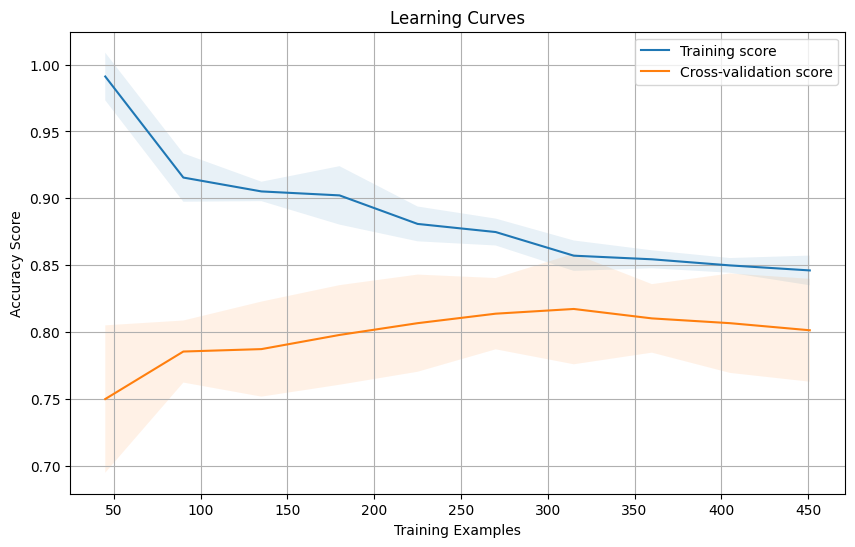

In [ ]:
def plot_learning_curve(estimator, X, y, filename):
    train_sizes, train_scores, val_scores = learning_curve(
        estimator, X, y, cv=5, n_jobs=-1, shuffle=True, train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy'
    )
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)
    val_std = np.std(val_scores, axis=1)
    
    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_mean, label='Training score')
    plt.plot(train_sizes, val_mean, label='Cross-validation score')
    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1)
    plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.1)
    plt.xlabel('Training Examples')
    plt.ylabel('Accuracy Score')
    plt.title('Learning Curves')
    plt.legend(loc='best')
    plt.grid(True)
    plt.savefig(filename)
    plt.show()

plot_learning_curve(model, X_train, y_train, 'Learning Curve')

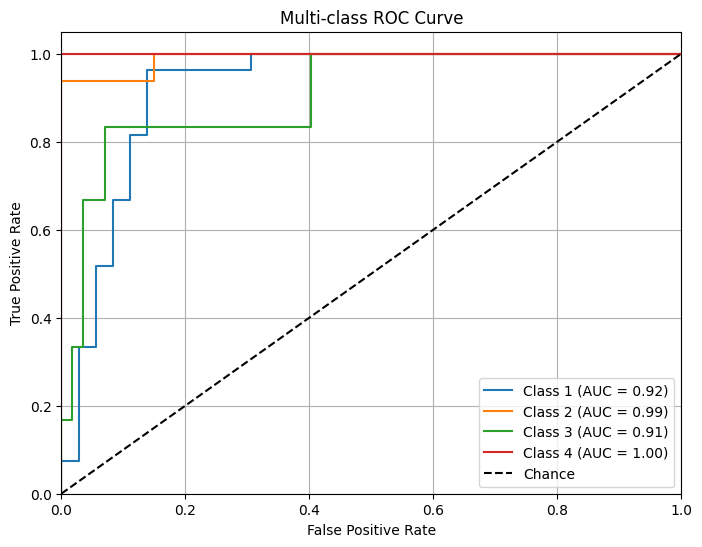

In [ ]:
y_score = np.array(model.predict_proba(X_test))

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(8, 6))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {classes[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Chance')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-class ROC Curve')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

In [ ]:
import joblib
model_and_scaler_dict = {
    'model': model,
    'scaler': scaler
}
joblib.dump(model_and_scaler_dict, 'FusionTop Classifier.pkl')

## *SmartBand Core*

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc

In [ ]:
df = pd.read_parquet("final_wesad_data_features.parquet")

categorical_cols = ['Gender', 'Drink Coffee Today', 'Do Sports Today', 
                    'Smoker', 'Feel Ill Today', 'Accurate Data']
numerical_cols = [col for col in df.columns if col.startswith("Wrist BVP ") or col.startswith("Wrist Acc ")] + ['Age', 'Height', 'Weight']

df = df[categorical_cols].join(df[numerical_cols]).join(df[['Mood']])

In [ ]:
df

,Gender,Drink Coffee Today,Do Sports Today,Smoker,Feel Ill Today,Accurate Data,Wrist Acc X mean,Wrist Acc X std,Wrist Acc X min,Wrist Acc X max,...,Wrist BVP LF,Wrist BVP HF,Wrist BVP LF/HF,Wrist BVP SD1,Wrist BVP SD2,Wrist BVP SD1/SD2,Age,Height,Weight,Mood
0,1,-1,-1,-1,-1,-1,32.923958,25.081792,-55.0,127.0,...,0.030300,0.126671,0.239205,245.107235,250.062308,0.980185,27.0,180.0,75.0,1
1,0,0,-1,-1,-1,0,31.516146,23.427831,-31.0,104.0,...,0.040560,0.151418,0.267870,204.886649,259.704537,0.788922,27.0,180.0,75.0,1
4,0,0,-1,0,-1,0,40.770833,13.902997,-45.0,109.0,...,0.032240,0.097907,0.329297,183.411633,218.085943,0.841006,27.0,175.0,80.0,1
5,1,0,0,-1,-1,0,44.686458,14.893847,-45.0,109.0,...,0.033897,0.140445,0.241353,239.636547,256.954457,0.932603,27.0,175.0,80.0,1
8,1,0,0,0,0,-1,53.043750,8.576565,-9.0,102.0,...,0.036238,0.108491,0.334016,188.402515,124.515358,1.513087,27.0,180.0,80.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1215,1,-1,-1,-1,0,-1,55.168750,5.251653,44.0,68.0,...,0.028316,0.148395,0.190816,163.106266,218.766279,0.745573,27.0,186.0,75.0,4
1217,1,-1,0,-1,0,-1,51.055208,0.228386,51.0,52.0,...,0.009959,0.106377,0.093622,164.559256,204.128891,0.806154,27.0,186.0,75.0,4
1218,0,0,0,-1,-1,-1,51.015104,0.134168,50.0,52.0,...,0.046332,0.045091,1.027504,177.377836,227.392462,0.780052,28.0,186.0,83.0,4
1219,0,-1,-1,-1,0,0,50.931250,0.255079,50.0,52.0,...,0.037449,0.123816,0.302460,167.173704,172.647521,0.968295,27.0,180.0,83.0,4


In [ ]:
df = pd.get_dummies(df, columns=categorical_cols).astype(np.float64)
df['Mood'] = df['Mood'].map(int)
df

,Wrist Acc X mean,Wrist Acc X std,Wrist Acc X min,Wrist Acc X max,Wrist Acc X range,Wrist Acc X slope,Wrist Acc X rate_of_change,Wrist Acc Y mean,Wrist Acc Y std,Wrist Acc Y min,...,Do Sports Today_1,Smoker_-1,Smoker_0,Smoker_1,Feel Ill Today_-1,Feel Ill Today_0,Feel Ill Today_1,Accurate Data_-1,Accurate Data_0,Accurate Data_1
0,32.923958,25.081792,-55.0,127.0,182.0,-0.567320,4.102137,3.414062,17.038679,-35.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,31.516146,23.427831,-31.0,104.0,135.0,0.364378,2.393955,12.029687,10.152106,-24.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,40.770833,13.902997,-45.0,109.0,154.0,0.056272,2.636269,30.093229,11.359245,-18.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
5,44.686458,14.893847,-45.0,109.0,154.0,0.120167,3.145388,25.500000,10.291430,-18.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
8,53.043750,8.576565,-9.0,102.0,111.0,-0.061882,1.018239,23.525000,6.488483,-6.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1215,55.168750,5.251653,44.0,68.0,24.0,-0.253959,0.421053,-18.184375,12.108209,-42.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1217,51.055208,0.228386,51.0,52.0,1.0,-0.001732,0.100052,-25.989062,0.104009,-26.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1218,51.015104,0.134168,50.0,52.0,2.0,-0.001263,0.033351,-25.712500,0.452597,-26.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1219,50.931250,0.255079,50.0,52.0,2.0,-0.004245,0.106826,-25.224479,0.417239,-26.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [ ]:
def calc_model_acc(model, X_train, X_test, y_train, y_test, print_it = True):
    train_acc = round(model.score(X_train, y_train), 4)
    test_acc = round(model.score(X_test, y_test), 4)
    cv_scores = cross_val_score(model, X_train, y_train, cv=5)
    cross_val_acc_mean = round(cv_scores.mean(), 4)
    cross_val_acc_std = round(cv_scores.std(), 4)
    
    if print_it:
        print(f"Training Accuracy: {train_acc}")
        print(f"Testing Accuracy: {test_acc}")
        print(f"Cross-Validation Accuracy: {cross_val_acc_mean} (+/- {cross_val_acc_std})")
    else:
        return train_acc, test_acc, cross_val_acc_mean, cross_val_acc_std

In [ ]:
def eval_model(model, X_train = None, y_train = None, X_test = None, y_test = None, classes_names = None):
    y_pred = model.predict(X_test)
    
    cm = confusion_matrix(y_test, y_pred)
    cr = classification_report(y_test, y_pred, target_names=classes_names)
    
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=classes_names,
                yticklabels=classes_names)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix for {classes_names[0]} vs {classes_names[1]}')
    plt.tight_layout()
    plt.show()
    
    print(f"\nClassification Report for {classes_names[0]} vs {classes_names[1]}:\n", cr)
    
    if not X_train.empty:
        calc_model_acc(model, X_train, X_test, y_train, y_test)

In [ ]:
def plot_learning_curve(estimator, X, y, filename, classes_names):
    train_sizes, train_scores, val_scores = learning_curve(
        estimator, X, y, cv=5, n_jobs=-1, shuffle=True, train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy'
    )
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)
    val_std = np.std(val_scores, axis=1)
    
    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_mean, label='Training score')
    plt.plot(train_sizes, val_mean, label='Cross-validation score')
    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1)
    plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.1)
    plt.xlabel('Training Examples')
    plt.ylabel('Accuracy Score')
    plt.title(f'Learning Curves for {classes_names[0]} vs {classes_names[1]}')
    plt.legend(loc='best')
    plt.grid(True)
    plt.savefig(filename)
    plt.show()

In [ ]:
def plot_roc_curve(model, X_test, y_test, classes_names):
    y_score = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', label='Chance')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {classes_names[0]} vs {classes_names[1]}')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

In [ ]:
def create_and_train_model(Moods, names, prams):
    model_data = df[df['Mood'].isin(Moods)].copy()
    model_data = model_data.sample(frac=1, random_state=42).reset_index(drop=True)
    
    
    mapping = {Moods[0]: 0, Moods[1]: 1}
    model_data_Y = model_data['Mood'].map(mapping)
    model_data_X = model_data.drop('Mood', axis=1)

    
    X_train, X_test, y_train, y_test = train_test_split(model_data_X, model_data_Y, test_size=0.1, random_state=42, stratify=model_data_Y)
    scaler = StandardScaler()
    X_train[numerical_cols] = scaler.fit_transform(X_train[numerical_cols])
    original_X_test = X_test.copy()
    X_test[numerical_cols] = scaler.transform(X_test[numerical_cols])

    if prams is None:
        prams = {'penalty': 'l2', 'solver': 'liblinear', 'C': 0.135, 'max_iter': 2000000, 'class_weight': 'balanced'}
    model = LogisticRegression(**prams)
    model.fit(X_train, y_train)

    eval_model(model, X_train, y_train, X_test, y_test, names)
    plot_learning_curve(model, X_train, y_train, f'{Moods[0]} vs {Moods[1]} Learning Curve.png', names)
    plot_roc_curve(model, X_test, y_test, names)

    return model, scaler, X_train, original_X_test, X_test, y_train, y_test

In [ ]:
def get_models(model_name, data_moods, label_pair, params=None):
    global overall_train_acc, overall_test_acc, overall_cross_val_acc_mean, overall_cross_val_acc_std, test_df

    model, scaler, X_train, original_X_test, X_test, y_train, y_test = create_and_train_model(data_moods, label_pair, params)
    train_acc, test_acc, cross_val_acc_mean, cross_val_acc_std = calc_model_acc(model, X_train, X_test, y_train, y_test, print_it=False)

    models[model_name] = model
    scalers[model_name] = scaler
    confidence[model_name] = cross_val_acc_mean

    y_test_remapped = pd.Series(y_test).map({0: data_moods[0], 1: data_moods[1]})

    test_data = pd.concat([pd.DataFrame(original_X_test).reset_index(drop=True), pd.DataFrame(y_test_remapped).reset_index(drop=True)], axis=1)
    test_df = pd.concat([test_df, test_data], ignore_index=True).drop_duplicates()

    overall_train_acc += train_acc
    overall_test_acc += test_acc
    overall_cross_val_acc_mean += cross_val_acc_mean
    overall_cross_val_acc_std += cross_val_acc_std

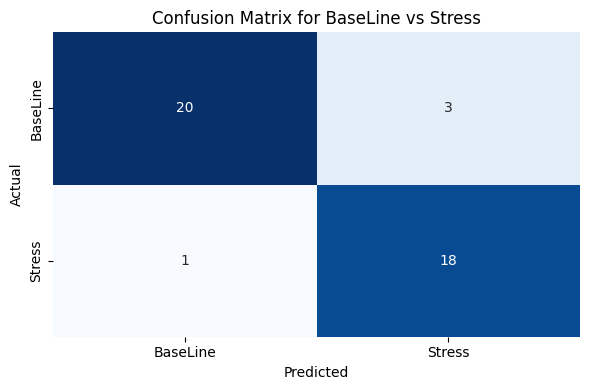


Classification Report for BaseLine vs Stress:
               precision    recall  f1-score   support

    BaseLine       0.95      0.87      0.91        23
      Stress       0.86      0.95      0.90        19

    accuracy                           0.90        42
   macro avg       0.90      0.91      0.90        42
weighted avg       0.91      0.90      0.90        42

Training Accuracy: 0.9437
Testing Accuracy: 0.9048
Cross-Validation Accuracy: 0.9169 (+/- 0.0351)


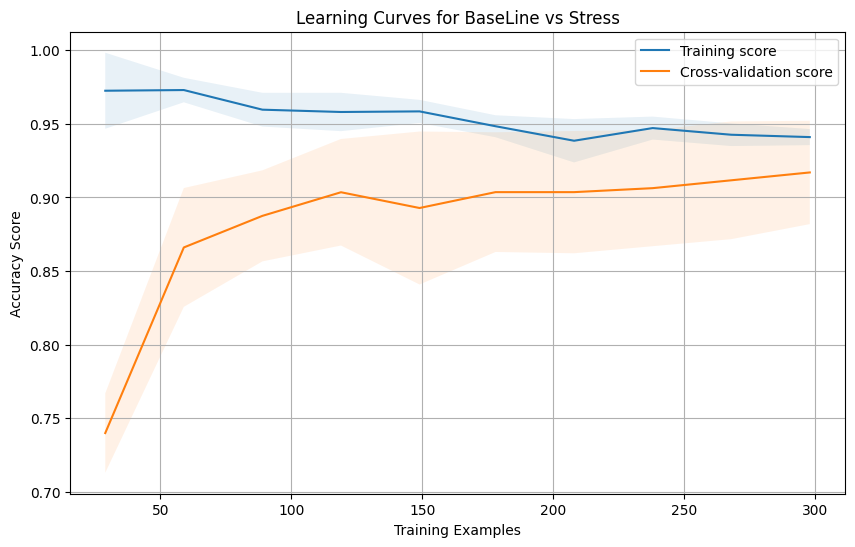

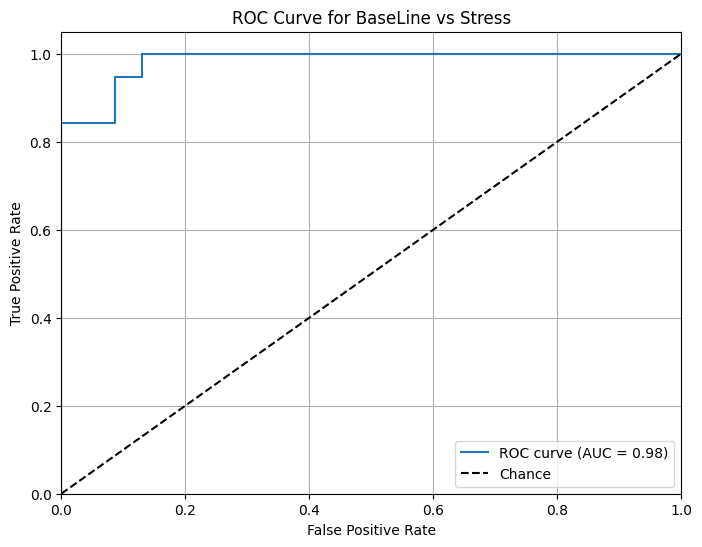

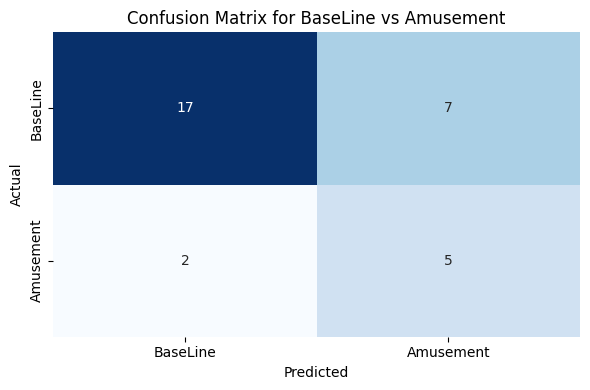


Classification Report for BaseLine vs Amusement:
               precision    recall  f1-score   support

    BaseLine       0.89      0.71      0.79        24
   Amusement       0.42      0.71      0.53         7

    accuracy                           0.71        31
   macro avg       0.66      0.71      0.66        31
weighted avg       0.79      0.71      0.73        31

Training Accuracy: 0.7794
Testing Accuracy: 0.7097
Cross-Validation Accuracy: 0.7131 (+/- 0.0561)


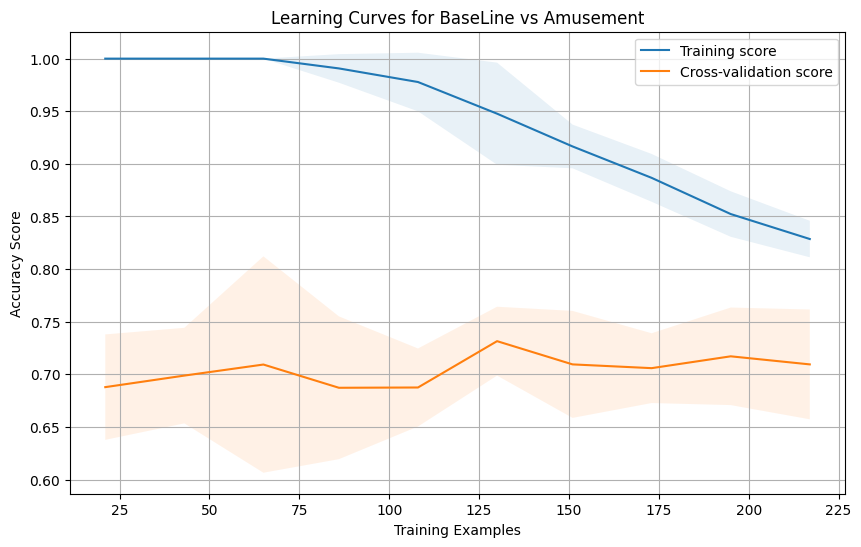

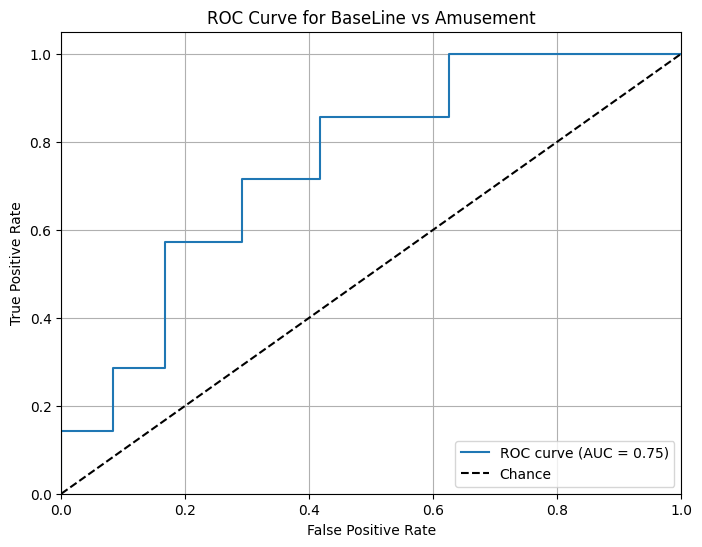

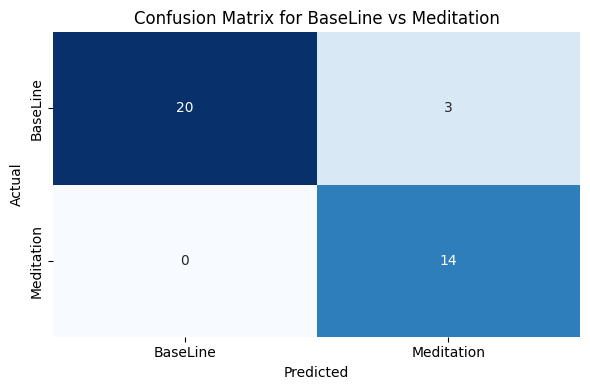


Classification Report for BaseLine vs Meditation:
               precision    recall  f1-score   support

    BaseLine       1.00      0.87      0.93        23
  Meditation       0.82      1.00      0.90        14

    accuracy                           0.92        37
   macro avg       0.91      0.93      0.92        37
weighted avg       0.93      0.92      0.92        37

Training Accuracy: 0.8524
Testing Accuracy: 0.9189
Cross-Validation Accuracy: 0.8224 (+/- 0.034)


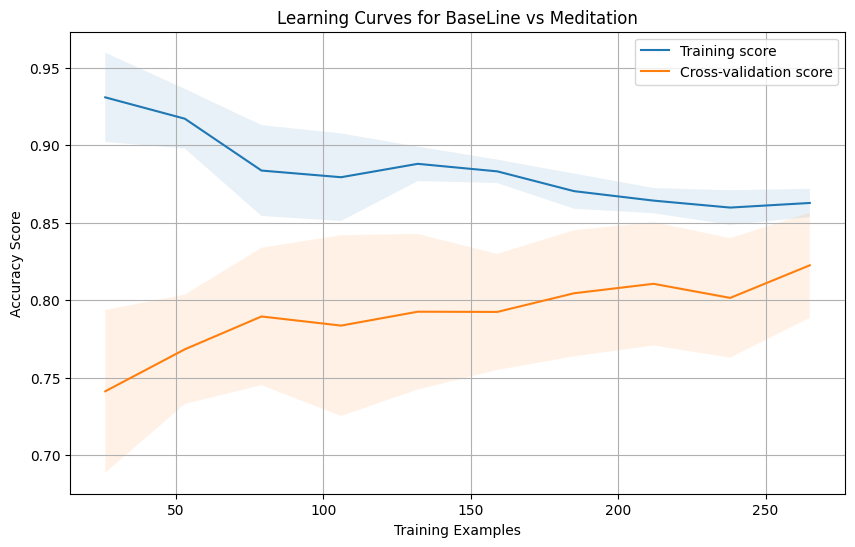

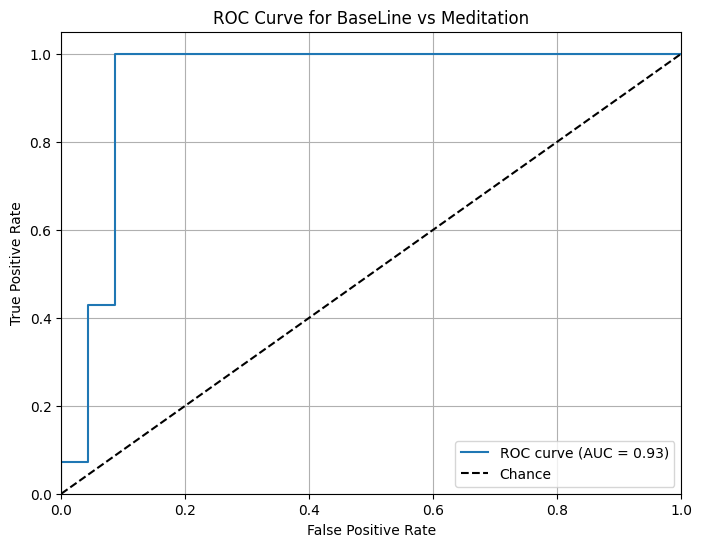

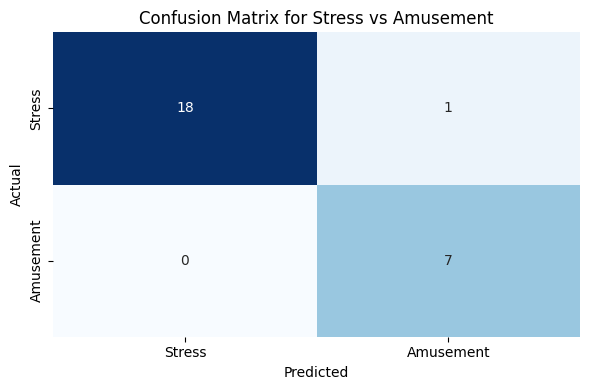


Classification Report for Stress vs Amusement:
               precision    recall  f1-score   support

      Stress       1.00      0.95      0.97        19
   Amusement       0.88      1.00      0.93         7

    accuracy                           0.96        26
   macro avg       0.94      0.97      0.95        26
weighted avg       0.97      0.96      0.96        26

Training Accuracy: 0.9353
Testing Accuracy: 0.9615
Cross-Validation Accuracy: 0.8877 (+/- 0.0444)


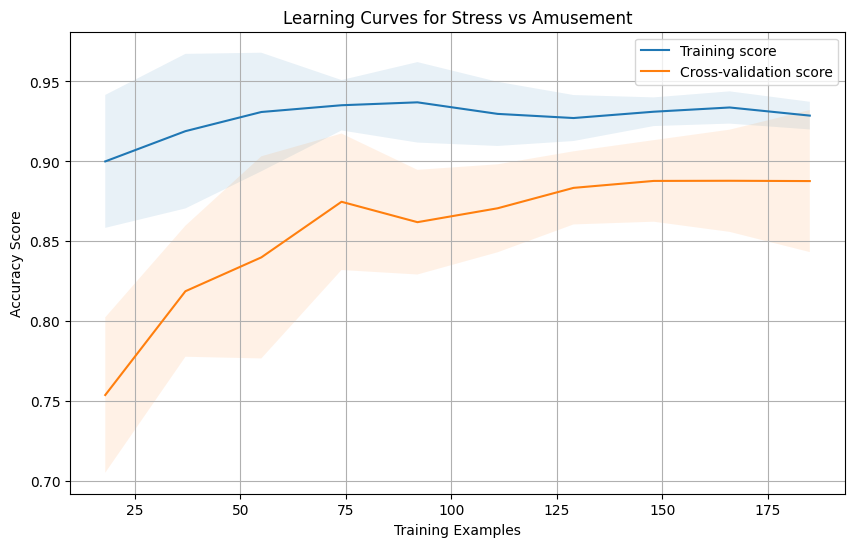

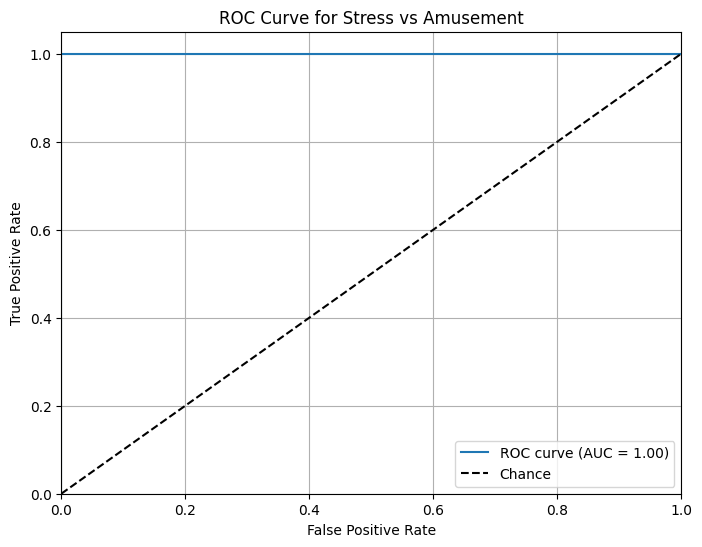

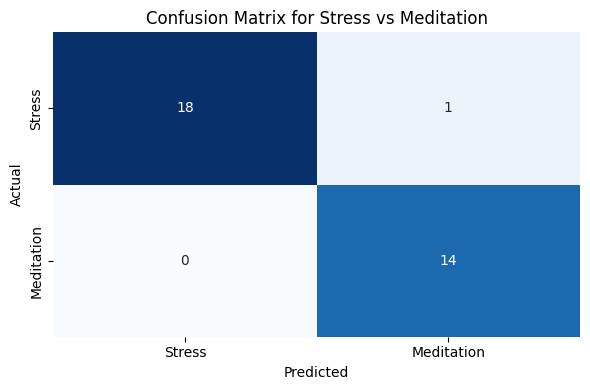


Classification Report for Stress vs Meditation:
               precision    recall  f1-score   support

      Stress       1.00      0.95      0.97        19
  Meditation       0.93      1.00      0.97        14

    accuracy                           0.97        33
   macro avg       0.97      0.97      0.97        33
weighted avg       0.97      0.97      0.97        33

Training Accuracy: 0.9519
Testing Accuracy: 0.9697
Cross-Validation Accuracy: 0.9209 (+/- 0.0236)


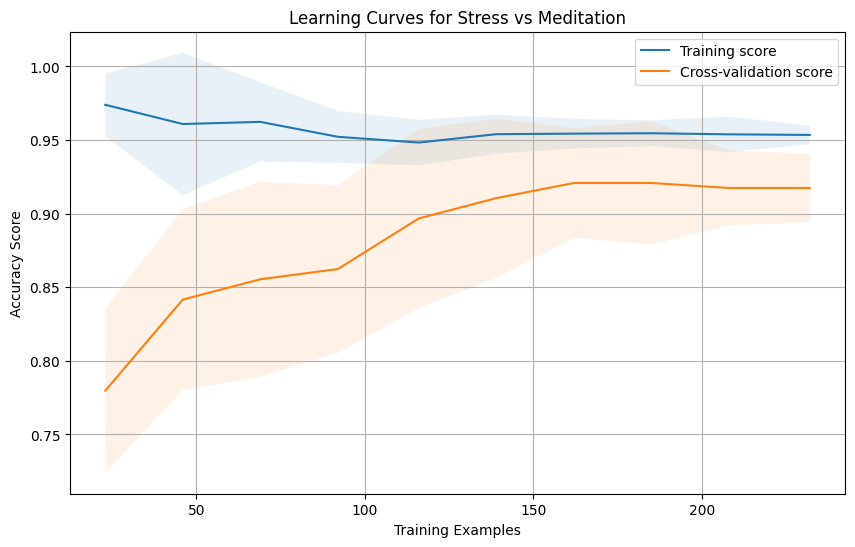

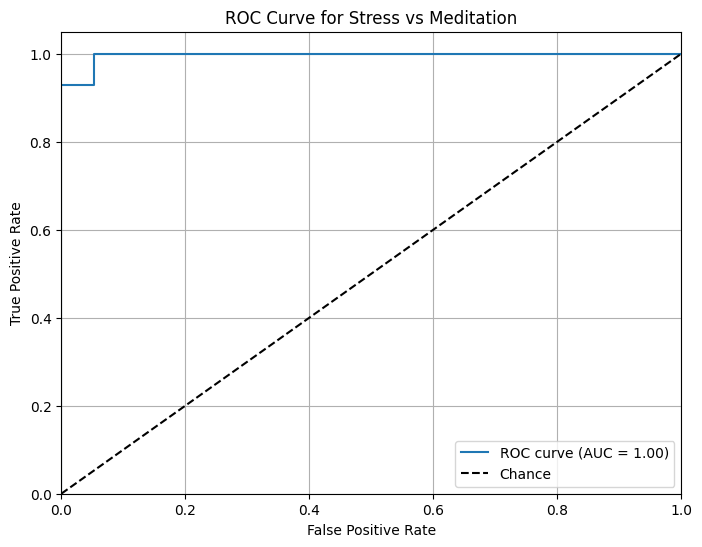

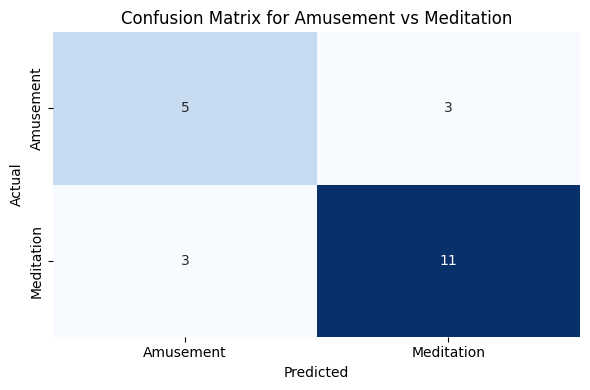


Classification Report for Amusement vs Meditation:
               precision    recall  f1-score   support

   Amusement       0.62      0.62      0.62         8
  Meditation       0.79      0.79      0.79        14

    accuracy                           0.73        22
   macro avg       0.71      0.71      0.71        22
weighted avg       0.73      0.73      0.73        22

Training Accuracy: 0.8158
Testing Accuracy: 0.7273
Cross-Validation Accuracy: 0.7316 (+/- 0.0805)


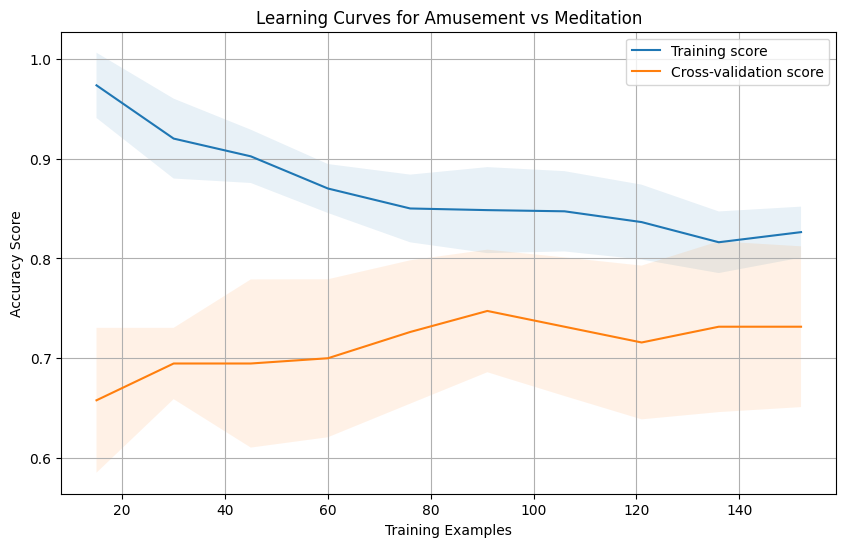

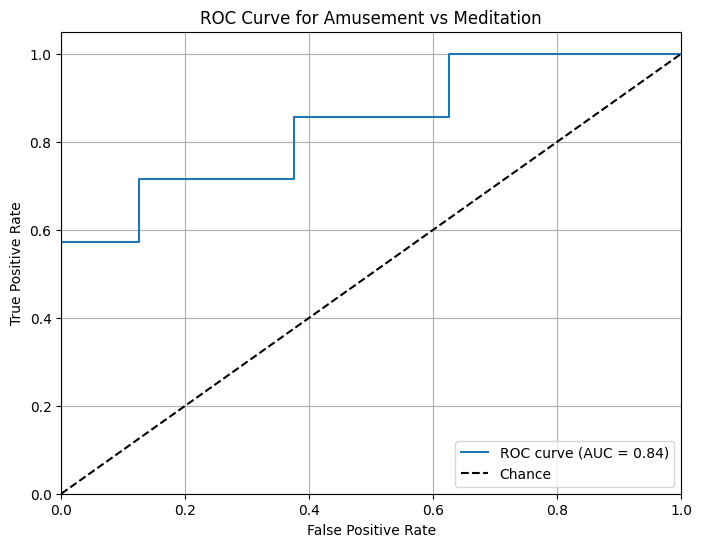

Overall Training Accuracy: 0.88
Overall Testing Accuracy: 0.87
Overall Cross-Validation Accuracy: 0.83% (+/- 0.05%)


In [ ]:
overall_train_acc = 0
overall_test_acc = 0
overall_cross_val_acc_mean = 0
overall_cross_val_acc_std = 0
models = {}
scalers = {}
confidence = {}
test_df = pd.DataFrame()

get_models('BaseLine_VS_Stress', [1, 2], ['BaseLine', 'Stress'])
get_models('BaseLine_VS_Amusement', [1, 3], ['BaseLine', 'Amusement'], {'penalty': 'l2',  'solver': 'liblinear',  'C': 100,  'class_weight': 'balanced',  'max_iter': 500000,  'random_state': 42 })
get_models('BaseLine_VS_Meditation', [1, 4], ['BaseLine', 'Meditation'])
get_models('Stress_VS_Amusement', [2, 3], ['Stress', 'Amusement'])
get_models('Stress_VS_Meditation', [2, 4], ['Stress', 'Meditation'])
get_models('Amusement_VS_Meditation', [3, 4], ['Amusement', 'Meditation'], {'penalty': 'l2',  'solver': 'liblinear',  'C': 0.1,  'class_weight': 'balanced',  'max_iter': 500000,  'random_state': 42 })

num_models = 6
print(f"Overall Training Accuracy: {overall_train_acc / num_models:.2f}")
print(f"Overall Testing Accuracy: {overall_test_acc / num_models:.2f}")
print(f"Overall Cross-Validation Accuracy: {overall_cross_val_acc_mean / num_models:.2f}% (+/- {overall_cross_val_acc_std / num_models:.2f}%)")

In [ ]:
def evaluate_overall_model(case):
    models_names = ['BaseLine_VS_Stress', 'BaseLine_VS_Amusement', 'BaseLine_VS_Meditation', 
                    'Stress_VS_Amusement', 'Stress_VS_Meditation', 'Amusement_VS_Meditation']
    pred_dict = {}
    
    for model_name in models_names:
        case_copy = case.copy()
        case_copy[numerical_cols] = scalers[model_name].transform([case_copy[numerical_cols]])[0]
        prob = models[model_name].predict_proba([case_copy])[0]
        pred_dict[model_name] = prob[0]
    
    predictionProbabilities = [0, 0, 0, 0]
    
    predictionProbabilities[0] = ((pred_dict[models_names[0]] * confidence[models_names[0]]) + 
                                  (pred_dict[models_names[1]] * confidence[models_names[1]]) + 
                                  (pred_dict[models_names[2]] * confidence[models_names[2]])) / 3
                                  
    predictionProbabilities[1] = (((1 - pred_dict[models_names[0]]) * confidence[models_names[0]]) + 
                                  (pred_dict[models_names[3]] * confidence[models_names[3]]) + 
                                  (pred_dict[models_names[4]] * confidence[models_names[4]])) / 3
                                  
    predictionProbabilities[2] = (((1 - pred_dict[models_names[1]]) * confidence[models_names[1]]) + 
                                  ((1 - pred_dict[models_names[3]]) * confidence[models_names[3]]) + 
                                  (pred_dict[models_names[5]] * confidence[models_names[5]])) / 3
                                  
    predictionProbabilities[3] = (((1 - pred_dict[models_names[2]]) * confidence[models_names[2]]) + 
                                  ((1 - pred_dict[models_names[4]]) * confidence[models_names[4]]) + 
                                  ((1 - pred_dict[models_names[5]]) * confidence[models_names[5]])) / 3
    
    maxProb = np.argmax(predictionProbabilities)
    
    if predictionProbabilities[maxProb] >= class_thresholds.get(['BaseLine', 'Stress', 'Amusement', 'Meditation'][maxProb], 0.5):
        return maxProb + 1
    else:
        return 5

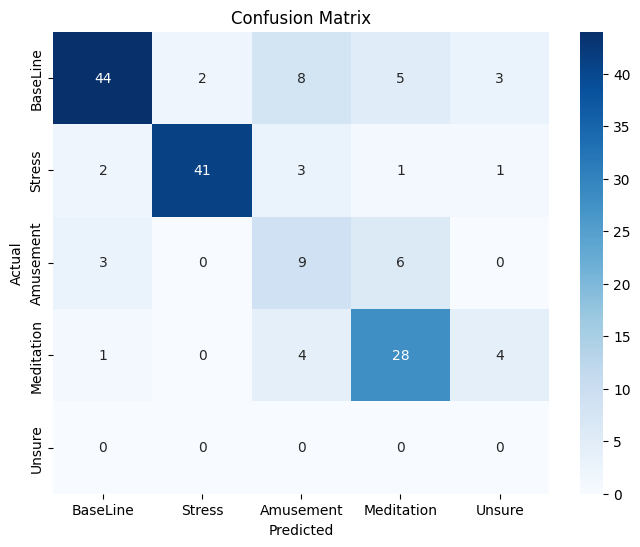

Classification Report:
              precision    recall  f1-score   support

    BaseLine       0.88      0.71      0.79        62
      Stress       0.95      0.85      0.90        48
   Amusement       0.38      0.50      0.43        18
  Meditation       0.70      0.76      0.73        37
      Unsure       0.00      0.00      0.00         0

    accuracy                           0.74       165
   macro avg       0.58      0.56      0.57       165
weighted avg       0.81      0.74      0.77       165



In [ ]:
class_thresholds = {
    'BaseLine': 0.55,
    'Stress': 0.55,
    'Amusement': 0.55,
    'Meditation': 0.55
}

predictions = []
true_labels = []
for index, row in test_df.iterrows():
    case = row.drop('Mood')
    true_label = row['Mood']
    prediction = evaluate_overall_model(case)
    predictions.append(prediction)
    true_labels.append(true_label)

target_names = ['BaseLine', 'Stress', 'Amusement', 'Meditation', 'Unsure']

cm = confusion_matrix(true_labels, predictions)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=target_names,
            yticklabels=target_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

print("Classification Report:")
print(classification_report(true_labels, predictions, target_names=target_names))

In [ ]:
import joblib
models_and_scalers_dict = {
    'models': models,
    'scalers': scalers
}
joblib.dump(models_and_scalers_dict, 'SmartBand Core.pkl')

## *WristFit Classifier*

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc

In [ ]:
df = pd.read_parquet("final_wesad_data_features.parquet")

categorical_cols = ['Gender', 'Drink Coffee Today', 'Do Sports Today', 
                    'Smoker', 'Feel Ill Today', 'Accurate Data']
numerical_cols = [col for col in df.columns if col.startswith("Wrist")] + ['Age', 'Height', 'Weight']

df = df[categorical_cols].join(df[numerical_cols]).join(df[['Mood']])

In [ ]:
df

,Gender,Drink Coffee Today,Do Sports Today,Smoker,Feel Ill Today,Accurate Data,Wrist Acc X mean,Wrist Acc X std,Wrist Acc X min,Wrist Acc X max,...,Wrist Temp std,Wrist Temp min,Wrist Temp max,Wrist Temp range,Wrist Temp slope,Wrist Temp rate_of_change,Age,Height,Weight,Mood
0,1,-1,-1,-1,-1,-1,32.923958,25.081792,-55.0,127.0,...,0.028533,35.75,35.87,0.12,-0.001209,0.003180,27.0,180.0,75.0,1
1,0,0,-1,-1,-1,0,31.516146,23.427831,-31.0,104.0,...,0.048893,35.66,35.87,0.21,-0.002561,0.003431,27.0,180.0,75.0,1
4,0,0,-1,0,-1,0,40.770833,13.902997,-45.0,109.0,...,0.039032,35.73,35.87,0.14,0.002076,0.003305,27.0,175.0,80.0,1
5,1,0,0,-1,-1,0,44.686458,14.893847,-45.0,109.0,...,0.021508,35.79,35.89,0.10,0.000242,0.003682,27.0,175.0,80.0,1
8,1,0,0,0,0,-1,53.043750,8.576565,-9.0,102.0,...,0.038288,35.77,35.91,0.14,0.002073,0.003598,27.0,180.0,80.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1215,1,-1,-1,-1,0,-1,55.168750,5.251653,44.0,68.0,...,0.123549,29.49,29.83,0.34,-0.006585,0.003347,27.0,186.0,75.0,4
1217,1,-1,0,-1,0,-1,51.055208,0.228386,51.0,52.0,...,0.030441,29.39,29.49,0.10,-0.001358,0.002176,27.0,186.0,75.0,4
1218,0,0,0,-1,-1,-1,51.015104,0.134168,50.0,52.0,...,0.023188,29.33,29.43,0.10,-0.001069,0.002343,28.0,186.0,83.0,4
1219,0,-1,-1,-1,0,0,50.931250,0.255079,50.0,52.0,...,0.017663,29.31,29.41,0.10,-0.000668,0.003096,27.0,180.0,83.0,4


In [ ]:
df = pd.get_dummies(df, columns=categorical_cols).astype(np.float64)
df['Mood'] = df['Mood'].map(int)
df

,Wrist Acc X mean,Wrist Acc X std,Wrist Acc X min,Wrist Acc X max,Wrist Acc X range,Wrist Acc X slope,Wrist Acc X rate_of_change,Wrist Acc Y mean,Wrist Acc Y std,Wrist Acc Y min,...,Do Sports Today_1,Smoker_-1,Smoker_0,Smoker_1,Feel Ill Today_-1,Feel Ill Today_0,Feel Ill Today_1,Accurate Data_-1,Accurate Data_0,Accurate Data_1
0,32.923958,25.081792,-55.0,127.0,182.0,-0.567320,4.102137,3.414062,17.038679,-35.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,31.516146,23.427831,-31.0,104.0,135.0,0.364378,2.393955,12.029687,10.152106,-24.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,40.770833,13.902997,-45.0,109.0,154.0,0.056272,2.636269,30.093229,11.359245,-18.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
5,44.686458,14.893847,-45.0,109.0,154.0,0.120167,3.145388,25.500000,10.291430,-18.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
8,53.043750,8.576565,-9.0,102.0,111.0,-0.061882,1.018239,23.525000,6.488483,-6.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1215,55.168750,5.251653,44.0,68.0,24.0,-0.253959,0.421053,-18.184375,12.108209,-42.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1217,51.055208,0.228386,51.0,52.0,1.0,-0.001732,0.100052,-25.989062,0.104009,-26.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1218,51.015104,0.134168,50.0,52.0,2.0,-0.001263,0.033351,-25.712500,0.452597,-26.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1219,50.931250,0.255079,50.0,52.0,2.0,-0.004245,0.106826,-25.224479,0.417239,-26.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [ ]:
def calc_model_acc(model, X_train, X_test, y_train, y_test, print_it = True):
    train_acc = round(model.score(X_train, y_train), 4)
    test_acc = round(model.score(X_test, y_test), 4)
    cv_scores = cross_val_score(model, X_train, y_train, cv=5)
    cross_val_acc_mean = round(cv_scores.mean(), 4)
    cross_val_acc_std = round(cv_scores.std(), 4)
    
    if print_it:
        print(f"Training Accuracy: {train_acc}")
        print(f"Testing Accuracy: {test_acc}")
        print(f"Cross-Validation Accuracy: {cross_val_acc_mean} (+/- {cross_val_acc_std})")
    else:
        return train_acc, test_acc, cross_val_acc_mean, cross_val_acc_std

In [ ]:
def eval_model(model, X_train = None, y_train = None, X_test = None, y_test = None, classes_names = None):
    y_pred = model.predict(X_test)
    
    cm = confusion_matrix(y_test, y_pred)
    cr = classification_report(y_test, y_pred, target_names=classes_names)
    
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=classes_names,
                yticklabels=classes_names)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix for {classes_names[0]} vs {classes_names[1]}')
    plt.tight_layout()
    plt.show()
    
    print(f"\nClassification Report for {classes_names[0]} vs {classes_names[1]}:\n", cr)
    
    if not X_train.empty:
        calc_model_acc(model, X_train, X_test, y_train, y_test)

In [ ]:
def plot_learning_curve(estimator, X, y, filename, classes_names):
    train_sizes, train_scores, val_scores = learning_curve(
        estimator, X, y, cv=5, n_jobs=-1, shuffle=True, train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy'
    )
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)
    val_std = np.std(val_scores, axis=1)
    
    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_mean, label='Training score')
    plt.plot(train_sizes, val_mean, label='Cross-validation score')
    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1)
    plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.1)
    plt.xlabel('Training Examples')
    plt.ylabel('Accuracy Score')
    plt.title(f'Learning Curves for {classes_names[0]} vs {classes_names[1]}')
    plt.legend(loc='best')
    plt.grid(True)
    plt.savefig(filename)
    plt.show()

In [ ]:
def plot_roc_curve(model, X_test, y_test, classes_names):
    y_score = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', label='Chance')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {classes_names[0]} vs {classes_names[1]}')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

In [ ]:
def create_and_train_model(Moods, names, prams):
    model_data = df[df['Mood'].isin(Moods)].copy()
    model_data = model_data.sample(frac=1, random_state=42).reset_index(drop=True)
    
    
    mapping = {Moods[0]: 0, Moods[1]: 1}
    model_data_Y = model_data['Mood'].map(mapping)
    model_data_X = model_data.drop('Mood', axis=1)

    
    X_train, X_test, y_train, y_test = train_test_split(model_data_X, model_data_Y, test_size=0.1, random_state=42, stratify=model_data_Y)
    scaler = StandardScaler()
    X_train[numerical_cols] = scaler.fit_transform(X_train[numerical_cols])
    original_X_test = X_test.copy()
    X_test[numerical_cols] = scaler.transform(X_test[numerical_cols])

    if prams is None:
        prams = {'penalty': 'l2', 'solver': 'liblinear', 'C': 0.135, 'max_iter': 2000000, 'class_weight': 'balanced'}
    model = LogisticRegression(**prams)
    model.fit(X_train, y_train)

    eval_model(model, X_train, y_train, X_test, y_test, names)
    plot_learning_curve(model, X_train, y_train, f'{Moods[0]} vs {Moods[1]} Learning Curve.png', names)
    plot_roc_curve(model, X_test, y_test, names)

    return model, scaler, X_train, original_X_test, X_test, y_train, y_test

In [ ]:
def get_models(model_name, data_moods, label_pair, params=None):
    global overall_train_acc, overall_test_acc, overall_cross_val_acc_mean, overall_cross_val_acc_std, test_df

    model, scaler, X_train, original_X_test, X_test, y_train, y_test = create_and_train_model(data_moods, label_pair, params)
    train_acc, test_acc, cross_val_acc_mean, cross_val_acc_std = calc_model_acc(model, X_train, X_test, y_train, y_test, print_it=False)

    models[model_name] = model
    scalers[model_name] = scaler
    confidence[model_name] = cross_val_acc_mean

    y_test_remapped = pd.Series(y_test).map({0: data_moods[0], 1: data_moods[1]})

    test_data = pd.concat([pd.DataFrame(original_X_test).reset_index(drop=True), pd.DataFrame(y_test_remapped).reset_index(drop=True)], axis=1)
    test_df = pd.concat([test_df, test_data], ignore_index=True).drop_duplicates()

    overall_train_acc += train_acc
    overall_test_acc += test_acc
    overall_cross_val_acc_mean += cross_val_acc_mean
    overall_cross_val_acc_std += cross_val_acc_std

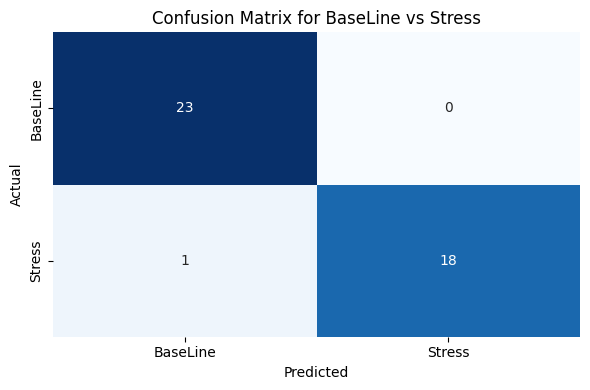


Classification Report for BaseLine vs Stress:
               precision    recall  f1-score   support

    BaseLine       0.96      1.00      0.98        23
      Stress       1.00      0.95      0.97        19

    accuracy                           0.98        42
   macro avg       0.98      0.97      0.98        42
weighted avg       0.98      0.98      0.98        42

Training Accuracy: 0.9866
Testing Accuracy: 0.9762
Cross-Validation Accuracy: 0.9759 (+/- 0.0101)


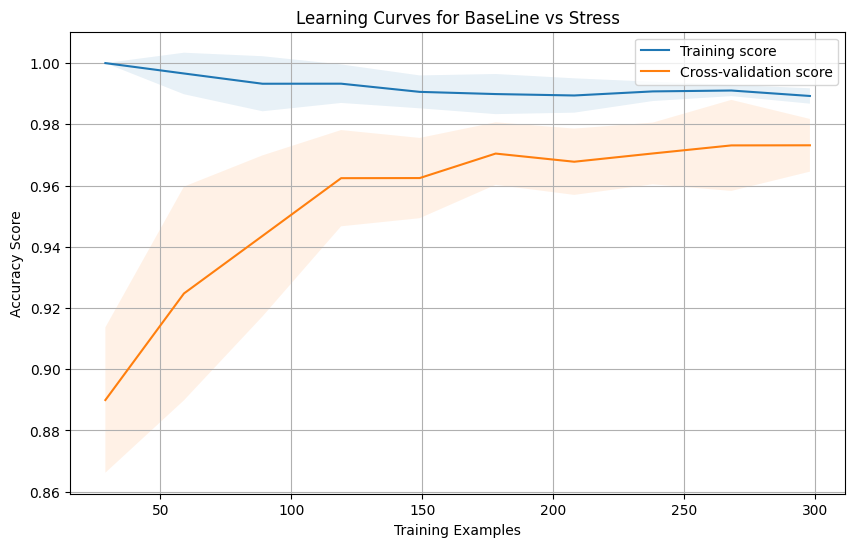

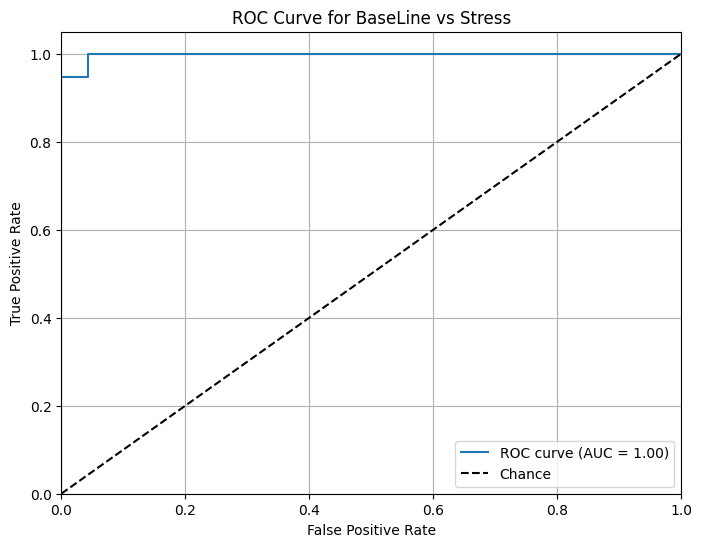

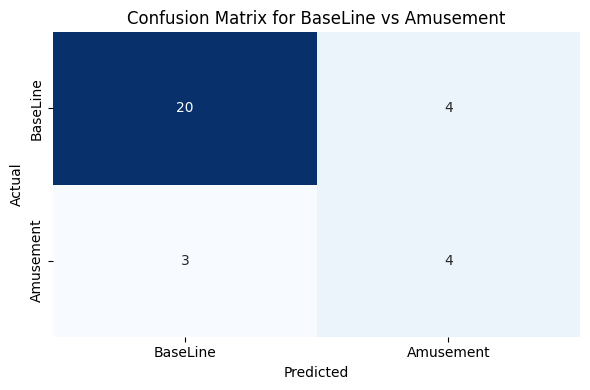


Classification Report for BaseLine vs Amusement:
               precision    recall  f1-score   support

    BaseLine       0.87      0.83      0.85        24
   Amusement       0.50      0.57      0.53         7

    accuracy                           0.77        31
   macro avg       0.68      0.70      0.69        31
weighted avg       0.79      0.77      0.78        31

Training Accuracy: 1.0
Testing Accuracy: 0.7742
Cross-Validation Accuracy: 0.7908 (+/- 0.0528)


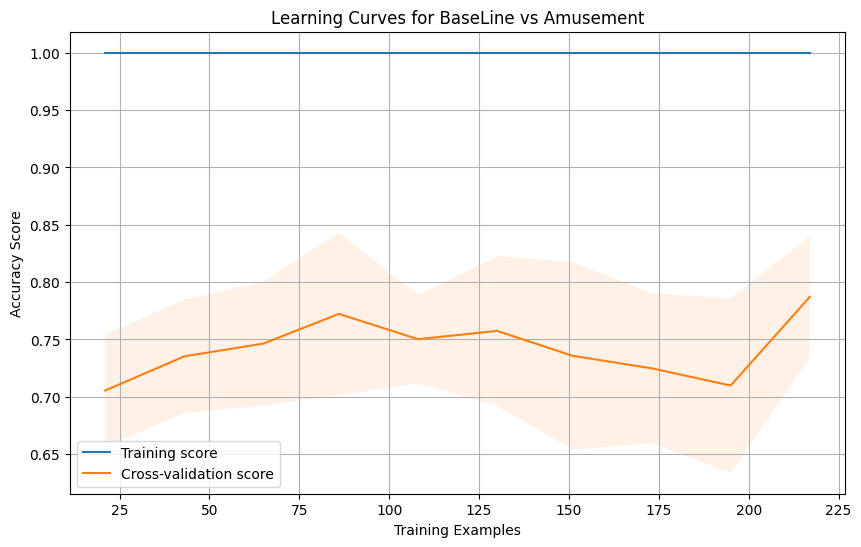

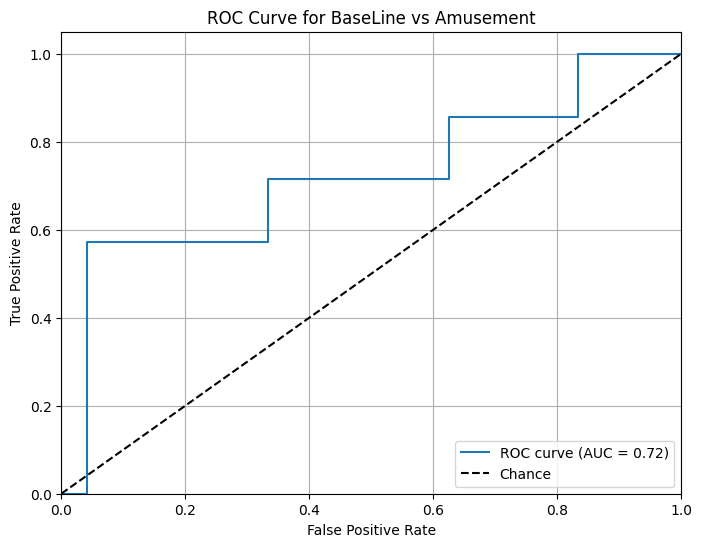

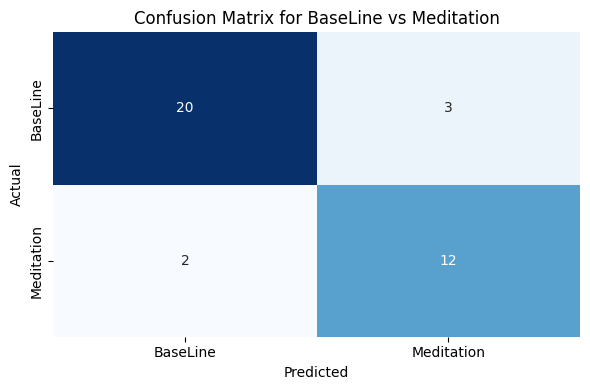


Classification Report for BaseLine vs Meditation:
               precision    recall  f1-score   support

    BaseLine       0.91      0.87      0.89        23
  Meditation       0.80      0.86      0.83        14

    accuracy                           0.86        37
   macro avg       0.85      0.86      0.86        37
weighted avg       0.87      0.86      0.87        37

Training Accuracy: 0.9398
Testing Accuracy: 0.8649
Cross-Validation Accuracy: 0.8735 (+/- 0.0204)


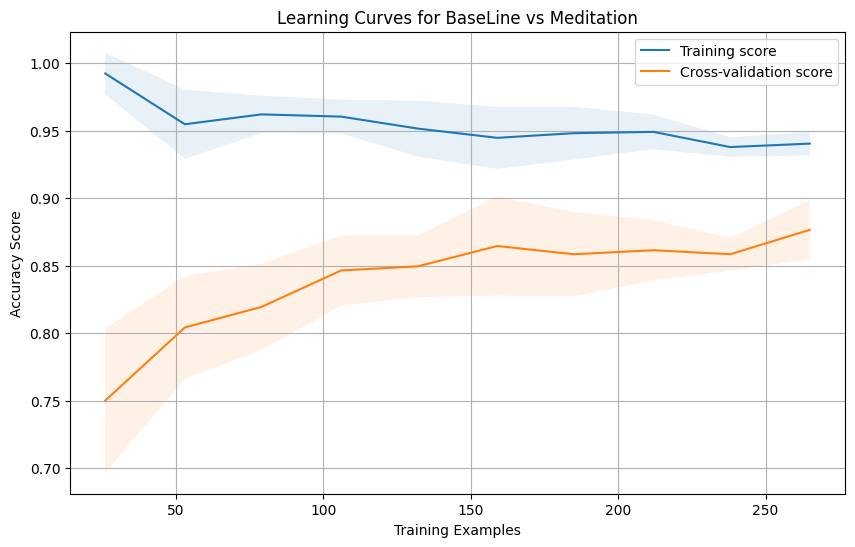

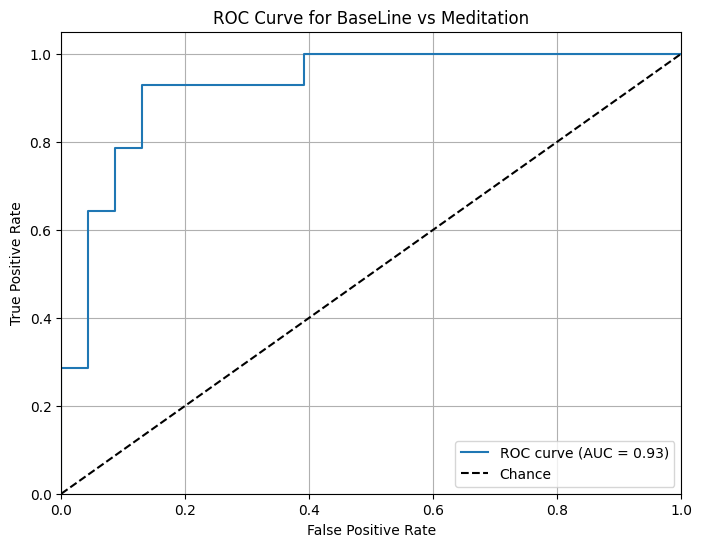

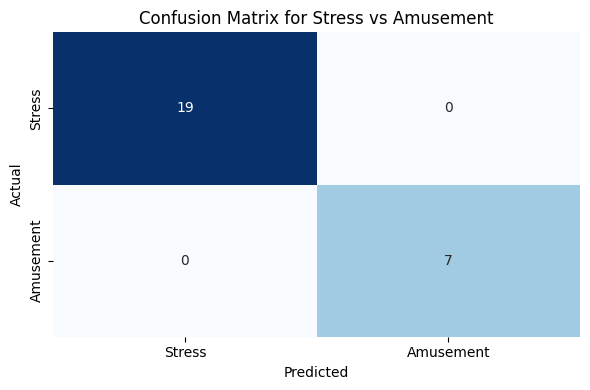


Classification Report for Stress vs Amusement:
               precision    recall  f1-score   support

      Stress       1.00      1.00      1.00        19
   Amusement       1.00      1.00      1.00         7

    accuracy                           1.00        26
   macro avg       1.00      1.00      1.00        26
weighted avg       1.00      1.00      1.00        26

Training Accuracy: 0.9698
Testing Accuracy: 1.0
Cross-Validation Accuracy: 0.9224 (+/- 0.0397)


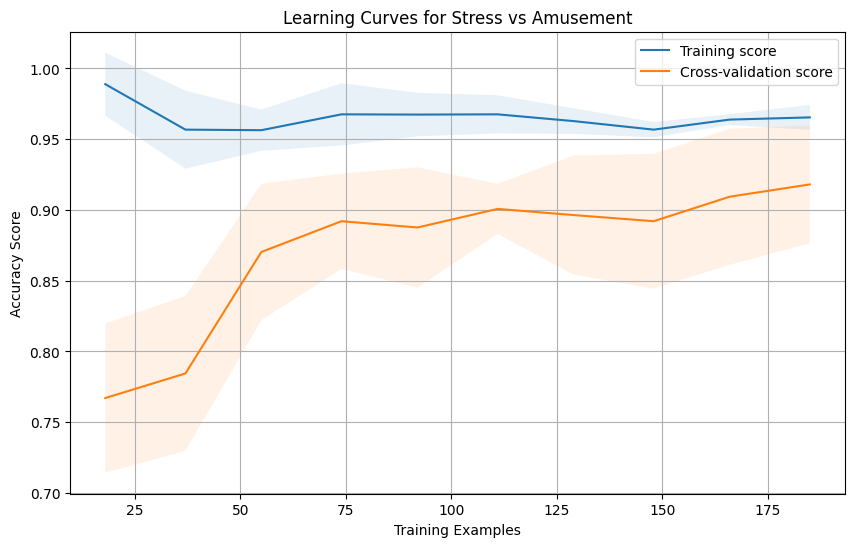

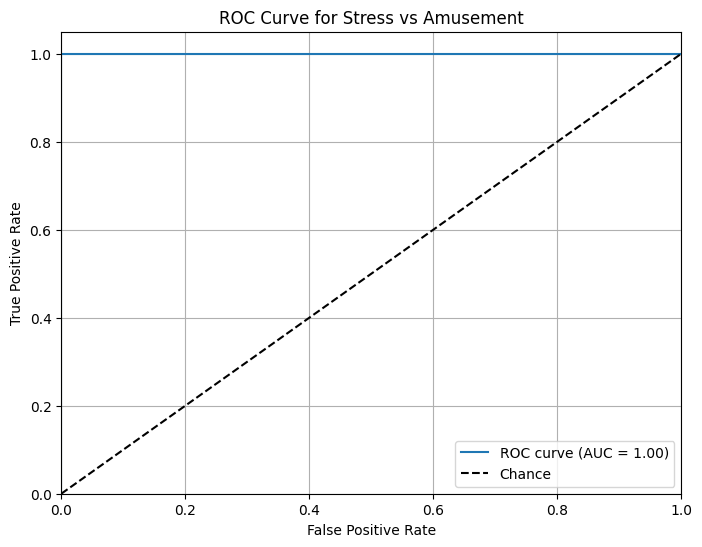

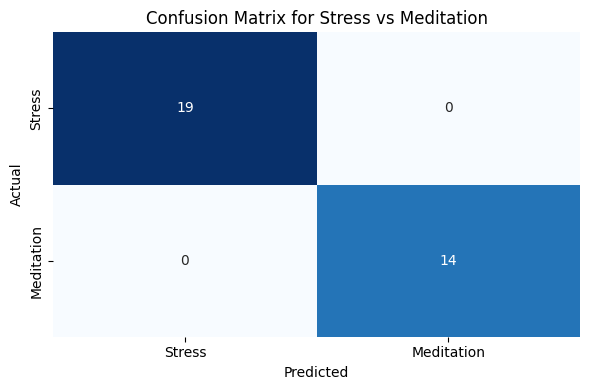


Classification Report for Stress vs Meditation:
               precision    recall  f1-score   support

      Stress       1.00      1.00      1.00        19
  Meditation       1.00      1.00      1.00        14

    accuracy                           1.00        33
   macro avg       1.00      1.00      1.00        33
weighted avg       1.00      1.00      1.00        33

Training Accuracy: 0.9863
Testing Accuracy: 1.0
Cross-Validation Accuracy: 0.9553 (+/- 0.0233)


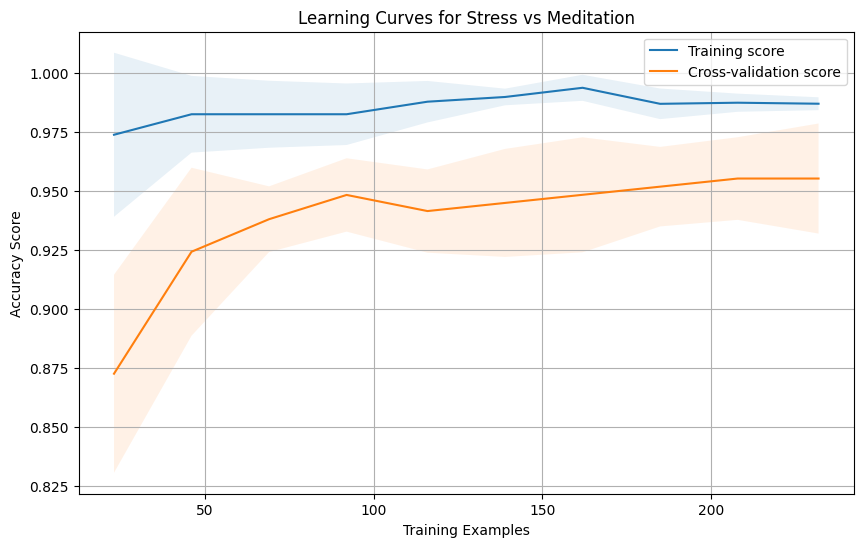

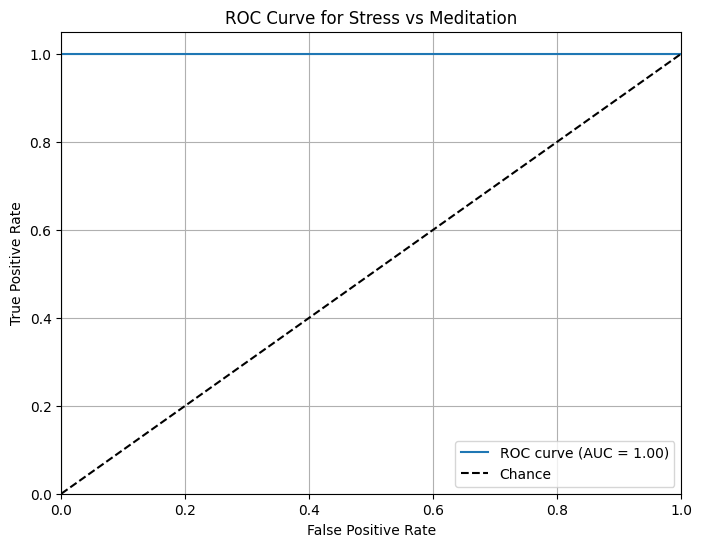

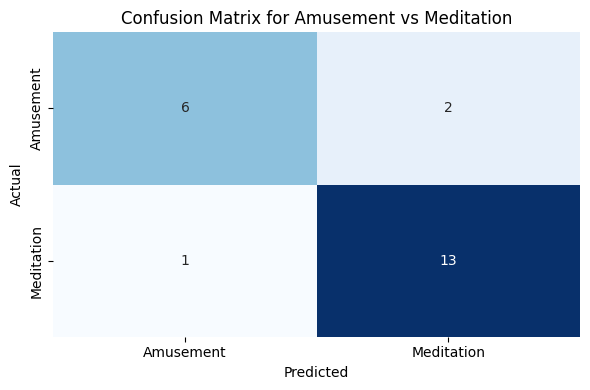


Classification Report for Amusement vs Meditation:
               precision    recall  f1-score   support

   Amusement       0.86      0.75      0.80         8
  Meditation       0.87      0.93      0.90        14

    accuracy                           0.86        22
   macro avg       0.86      0.84      0.85        22
weighted avg       0.86      0.86      0.86        22

Training Accuracy: 0.9211
Testing Accuracy: 0.8636
Cross-Validation Accuracy: 0.8158 (+/- 0.06)


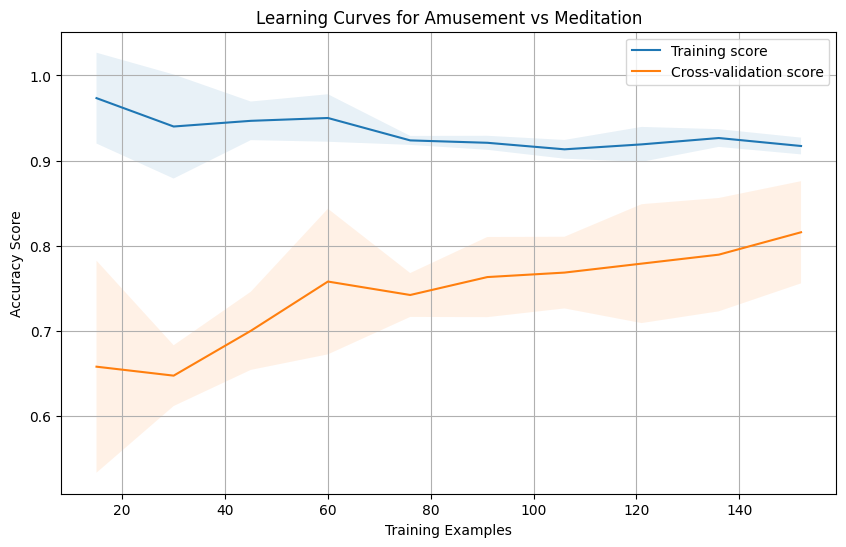

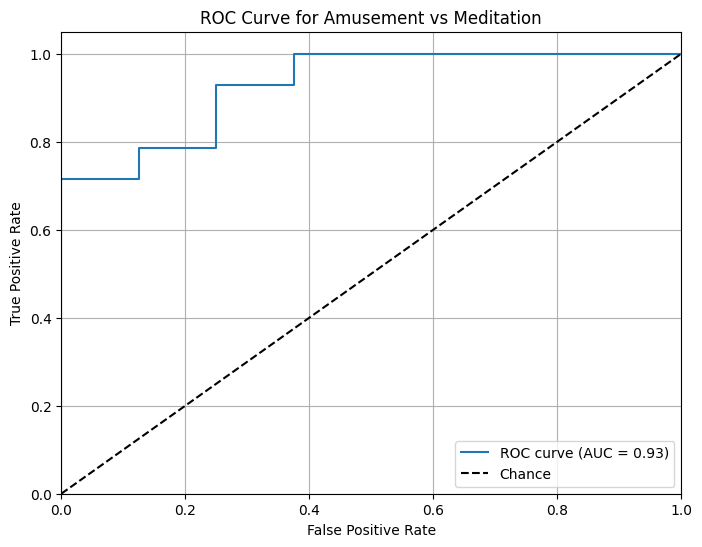

Overall Training Accuracy: 0.97
Overall Testing Accuracy: 0.91
Overall Cross-Validation Accuracy: 0.89% (+/- 0.03%)


In [ ]:
overall_train_acc = 0
overall_test_acc = 0
overall_cross_val_acc_mean = 0
overall_cross_val_acc_std = 0
models = {}
scalers = {}
confidence = {}
test_df = pd.DataFrame()

get_models('BaseLine_VS_Stress', [1, 2], ['BaseLine', 'Stress'])
get_models('BaseLine_VS_Amusement', [1, 3], ['BaseLine', 'Amusement'], {'penalty': 'l2',  'solver': 'liblinear',  'C': 100,  'class_weight': 'balanced',  'max_iter': 500000,  'random_state': 42 })
get_models('BaseLine_VS_Meditation', [1, 4], ['BaseLine', 'Meditation'])
get_models('Stress_VS_Amusement', [2, 3], ['Stress', 'Amusement'])
get_models('Stress_VS_Meditation', [2, 4], ['Stress', 'Meditation'])
get_models('Amusement_VS_Meditation', [3, 4], ['Amusement', 'Meditation'], {'penalty': 'l2',  'solver': 'liblinear',  'C': 0.1,  'class_weight': 'balanced',  'max_iter': 500000,  'random_state': 42 })

num_models = 6
print(f"Overall Training Accuracy: {overall_train_acc / num_models:.2f}")
print(f"Overall Testing Accuracy: {overall_test_acc / num_models:.2f}")
print(f"Overall Cross-Validation Accuracy: {overall_cross_val_acc_mean / num_models:.2f}% (+/- {overall_cross_val_acc_std / num_models:.2f}%)")

In [ ]:
def evaluate_overall_model(case):
    models_names = ['BaseLine_VS_Stress', 'BaseLine_VS_Amusement', 'BaseLine_VS_Meditation', 
                    'Stress_VS_Amusement', 'Stress_VS_Meditation', 'Amusement_VS_Meditation']
    pred_dict = {}
    
    for model_name in models_names:
        case_copy = case.copy()
        case_copy[numerical_cols] = scalers[model_name].transform([case_copy[numerical_cols]])[0]
        prob = models[model_name].predict_proba([case_copy])[0]
        pred_dict[model_name] = prob[0]
    
    predictionProbabilities = [0, 0, 0, 0]
    
    predictionProbabilities[0] = ((pred_dict[models_names[0]] * confidence[models_names[0]]) + 
                                  (pred_dict[models_names[1]] * confidence[models_names[1]]) + 
                                  (pred_dict[models_names[2]] * confidence[models_names[2]])) / 3
                                  
    predictionProbabilities[1] = (((1 - pred_dict[models_names[0]]) * confidence[models_names[0]]) + 
                                  (pred_dict[models_names[3]] * confidence[models_names[3]]) + 
                                  (pred_dict[models_names[4]] * confidence[models_names[4]])) / 3
                                  
    predictionProbabilities[2] = (((1 - pred_dict[models_names[1]]) * confidence[models_names[1]]) + 
                                  ((1 - pred_dict[models_names[3]]) * confidence[models_names[3]]) + 
                                  (pred_dict[models_names[5]] * confidence[models_names[5]])) / 3
                                  
    predictionProbabilities[3] = (((1 - pred_dict[models_names[2]]) * confidence[models_names[2]]) + 
                                  ((1 - pred_dict[models_names[4]]) * confidence[models_names[4]]) + 
                                  ((1 - pred_dict[models_names[5]]) * confidence[models_names[5]])) / 3
    
    maxProb = np.argmax(predictionProbabilities)
    
    if predictionProbabilities[maxProb] >= class_thresholds.get(['BaseLine', 'Stress', 'Amusement', 'Meditation'][maxProb], 0.5):
        return maxProb + 1
    else:
        return 5

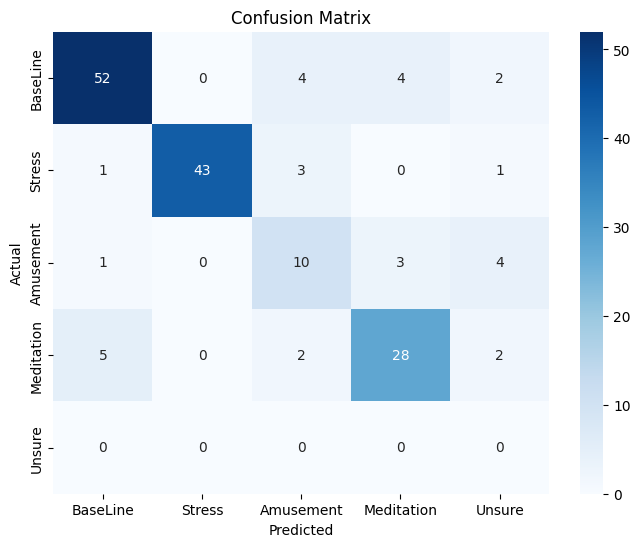

Classification Report:
              precision    recall  f1-score   support

    BaseLine       0.88      0.84      0.86        62
      Stress       1.00      0.90      0.95        48
   Amusement       0.53      0.56      0.54        18
  Meditation       0.80      0.76      0.78        37
      Unsure       0.00      0.00      0.00         0

    accuracy                           0.81       165
   macro avg       0.64      0.61      0.62       165
weighted avg       0.86      0.81      0.83       165



In [ ]:
class_thresholds = {
    'BaseLine': 0.68,
    'Stress': 0.68,
    'Amusement': 0.68,
    'Meditation': 0.68
}

predictions = []
true_labels = []
for index, row in test_df.iterrows():
    case = row.drop('Mood')
    true_label = row['Mood']
    prediction = evaluate_overall_model(case)
    predictions.append(prediction)
    true_labels.append(true_label)

target_names = ['BaseLine', 'Stress', 'Amusement', 'Meditation', 'Unsure']

cm = confusion_matrix(true_labels, predictions)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=target_names,
            yticklabels=target_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

print("Classification Report:")
print(classification_report(true_labels, predictions, target_names=target_names))

In [ ]:
import joblib
models_and_scalers_dict = {
    'models': models,
    'scalers': scalers
}
joblib.dump(models_and_scalers_dict, 'WristFit Classifier.pkl')

## *ChestPro Classifier*

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc

In [ ]:
df = pd.read_parquet("final_wesad_data_features.parquet")

categorical_cols = ['Gender', 'Drink Coffee Today', 'Do Sports Today', 
                    'Smoker', 'Feel Ill Today', 'Accurate Data']
numerical_cols = [col for col in df.columns if col.startswith("Chest")] + ['Age', 'Height', 'Weight']

df = df[categorical_cols].join(df[numerical_cols]).join(df[['Mood']])

In [ ]:
df

,Gender,Drink Coffee Today,Do Sports Today,Smoker,Feel Ill Today,Accurate Data,Chest Acc X mean,Chest Acc X std,Chest Acc X min,Chest Acc X max,...,Chest Resp Inter-breath Interval min,Chest Resp Inter-breath Interval max,Chest Resp Inter-breath Interval range,Chest Resp Inter-breath Interval slope,Chest Resp Inter-breath Interval rate_of_change,Chest Resp Respiratory Rate,Age,Height,Weight,Mood
0,1,-1,-1,-1,-1,-1,0.759085,0.127055,0.5390,1.1454,...,2.150000,5.422857,3.272857,-0.126386,0.985934,17.145856,27.0,180.0,75.0,1
1,0,0,-1,-1,-1,0,0.636856,0.066817,0.5390,1.1454,...,2.125714,5.277143,3.151429,-0.062314,0.520446,19.773464,27.0,180.0,75.0,1
4,0,0,-1,0,-1,0,0.648417,0.076594,0.5770,0.9350,...,2.234286,4.481429,2.247143,0.052836,0.585089,20.666898,27.0,175.0,80.0,1
5,1,0,0,-1,-1,0,0.660468,0.073354,0.5770,0.9350,...,2.040000,5.078571,3.038571,-0.053301,1.061681,20.589357,27.0,175.0,80.0,1
8,1,0,0,0,0,-1,0.640738,0.004852,0.6058,0.6862,...,2.297143,3.282857,0.985714,-0.005103,0.310556,22.007722,27.0,180.0,80.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1215,1,-1,-1,-1,0,-1,0.657293,0.038612,0.5962,0.9574,...,3.267143,8.955714,5.688571,0.199473,1.994694,10.417636,27.0,186.0,75.0,4
1217,1,-1,0,-1,0,-1,0.638245,0.003342,0.6214,0.6534,...,4.667143,8.241429,3.574286,0.426854,0.713265,10.443540,27.0,186.0,75.0,4
1218,0,0,0,-1,-1,-1,0.641019,0.004597,0.6238,0.6642,...,5.155714,8.194286,3.038571,-0.072959,1.338333,8.948682,28.0,186.0,83.0,4
1219,0,-1,-1,-1,0,0,0.643368,0.004199,0.6250,0.6642,...,5.197143,8.052857,2.855714,-0.209592,0.932381,9.571559,27.0,180.0,83.0,4


In [ ]:
df = pd.get_dummies(df, columns=categorical_cols).astype(np.float64)
df['Mood'] = df['Mood'].map(int)
df

,Chest Acc X mean,Chest Acc X std,Chest Acc X min,Chest Acc X max,Chest Acc X range,Chest Acc X slope,Chest Acc X rate_of_change,Chest Acc Y mean,Chest Acc Y std,Chest Acc Y min,...,Do Sports Today_1,Smoker_-1,Smoker_0,Smoker_1,Feel Ill Today_-1,Feel Ill Today_0,Feel Ill Today_1,Accurate Data_-1,Accurate Data_0,Accurate Data_1
0,0.759085,0.127055,0.5390,1.1454,0.6064,-0.006226,0.001433,-0.130697,0.042169,-0.2778,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,0.636856,0.066817,0.5390,1.1454,0.6064,-0.001683,0.001377,-0.111829,0.015888,-0.2076,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,0.648417,0.076594,0.5770,0.9350,0.3580,0.001980,0.001355,-0.110911,0.042728,-0.2896,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
5,0.660468,0.073354,0.5770,0.9350,0.3580,-0.000078,0.001340,-0.086645,0.051961,-0.2896,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
8,0.640738,0.004852,0.6058,0.6862,0.0804,-0.000006,0.001280,-0.064341,0.006075,-0.1196,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1215,0.657293,0.038612,0.5962,0.9574,0.3612,-0.000795,0.001351,0.014019,0.011355,-0.0882,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1217,0.638245,0.003342,0.6214,0.6534,0.0320,0.000039,0.001291,0.012428,0.002619,0.0024,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1218,0.641019,0.004597,0.6238,0.6642,0.0404,0.000150,0.001290,0.012726,0.002670,0.0026,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1219,0.643368,0.004199,0.6250,0.6642,0.0392,0.000030,0.001296,0.012717,0.002700,0.0026,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [ ]:
def calc_model_acc(model, X_train, X_test, y_train, y_test, print_it = True):
    train_acc = round(model.score(X_train, y_train), 4)
    test_acc = round(model.score(X_test, y_test), 4)
    cv_scores = cross_val_score(model, X_train, y_train, cv=5)
    cross_val_acc_mean = round(cv_scores.mean(), 4)
    cross_val_acc_std = round(cv_scores.std(), 4)
    
    if print_it:
        print(f"Training Accuracy: {train_acc}")
        print(f"Testing Accuracy: {test_acc}")
        print(f"Cross-Validation Accuracy: {cross_val_acc_mean} (+/- {cross_val_acc_std})")
    else:
        return train_acc, test_acc, cross_val_acc_mean, cross_val_acc_std

In [ ]:
def eval_model(model, X_train = None, y_train = None, X_test = None, y_test = None, classes_names = None):
    y_pred = model.predict(X_test)
    
    cm = confusion_matrix(y_test, y_pred)
    cr = classification_report(y_test, y_pred, target_names=classes_names)
    
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=classes_names,
                yticklabels=classes_names)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix for {classes_names[0]} vs {classes_names[1]}')
    plt.tight_layout()
    plt.show()
    
    print(f"\nClassification Report for {classes_names[0]} vs {classes_names[1]}:\n", cr)
    
    if not X_train.empty:
        calc_model_acc(model, X_train, X_test, y_train, y_test)

In [ ]:
def plot_learning_curve(estimator, X, y, filename, classes_names):
    train_sizes, train_scores, val_scores = learning_curve(
        estimator, X, y, cv=5, n_jobs=-1, shuffle=True, train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy'
    )
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)
    val_std = np.std(val_scores, axis=1)
    
    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_mean, label='Training score')
    plt.plot(train_sizes, val_mean, label='Cross-validation score')
    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1)
    plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.1)
    plt.xlabel('Training Examples')
    plt.ylabel('Accuracy Score')
    plt.title(f'Learning Curves for {classes_names[0]} vs {classes_names[1]}')
    plt.legend(loc='best')
    plt.grid(True)
    plt.savefig(filename)
    plt.show()

In [ ]:
def plot_roc_curve(model, X_test, y_test, classes_names):
    y_score = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', label='Chance')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {classes_names[0]} vs {classes_names[1]}')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

In [ ]:
def create_and_train_model(Moods, names, prams):
    model_data = df[df['Mood'].isin(Moods)].copy()
    model_data = model_data.sample(frac=1, random_state=42).reset_index(drop=True)
    
    
    mapping = {Moods[0]: 0, Moods[1]: 1}
    model_data_Y = model_data['Mood'].map(mapping)
    model_data_X = model_data.drop('Mood', axis=1)

    
    X_train, X_test, y_train, y_test = train_test_split(model_data_X, model_data_Y, test_size=0.1, random_state=42, stratify=model_data_Y)
    scaler = StandardScaler()
    X_train[numerical_cols] = scaler.fit_transform(X_train[numerical_cols])
    original_X_test = X_test.copy()
    X_test[numerical_cols] = scaler.transform(X_test[numerical_cols])

    if prams is None:
        prams = {'penalty': 'l1', 'solver': 'liblinear', 'C': 0.135, 'max_iter': 2000000, 'class_weight': 'balanced'}
    model = LogisticRegression(**prams)
    model.fit(X_train, y_train)

    eval_model(model, X_train, y_train, X_test, y_test, names)
    plot_learning_curve(model, X_train, y_train, f'{Moods[0]} vs {Moods[1]} Learning Curve.png', names)
    plot_roc_curve(model, X_test, y_test, names)

    return model, scaler, X_train, original_X_test, X_test, y_train, y_test

In [ ]:
def get_models(model_name, data_moods, label_pair, params=None):
    global overall_train_acc, overall_test_acc, overall_cross_val_acc_mean, overall_cross_val_acc_std, test_df

    model, scaler, X_train, original_X_test, X_test, y_train, y_test = create_and_train_model(data_moods, label_pair, params)
    train_acc, test_acc, cross_val_acc_mean, cross_val_acc_std = calc_model_acc(model, X_train, X_test, y_train, y_test, print_it=False)

    models[model_name] = model
    scalers[model_name] = scaler
    confidence[model_name] = cross_val_acc_mean

    y_test_remapped = pd.Series(y_test).map({0: data_moods[0], 1: data_moods[1]})

    test_data = pd.concat([pd.DataFrame(original_X_test).reset_index(drop=True), pd.DataFrame(y_test_remapped).reset_index(drop=True)], axis=1)
    test_df = pd.concat([test_df, test_data], ignore_index=True).drop_duplicates()

    overall_train_acc += train_acc
    overall_test_acc += test_acc
    overall_cross_val_acc_mean += cross_val_acc_mean
    overall_cross_val_acc_std += cross_val_acc_std

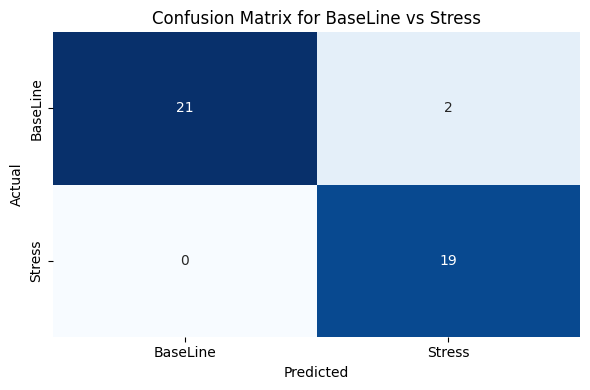


Classification Report for BaseLine vs Stress:
               precision    recall  f1-score   support

    BaseLine       1.00      0.91      0.95        23
      Stress       0.90      1.00      0.95        19

    accuracy                           0.95        42
   macro avg       0.95      0.96      0.95        42
weighted avg       0.96      0.95      0.95        42

Training Accuracy: 0.9893
Testing Accuracy: 0.9524
Cross-Validation Accuracy: 0.9731 (+/- 0.0191)


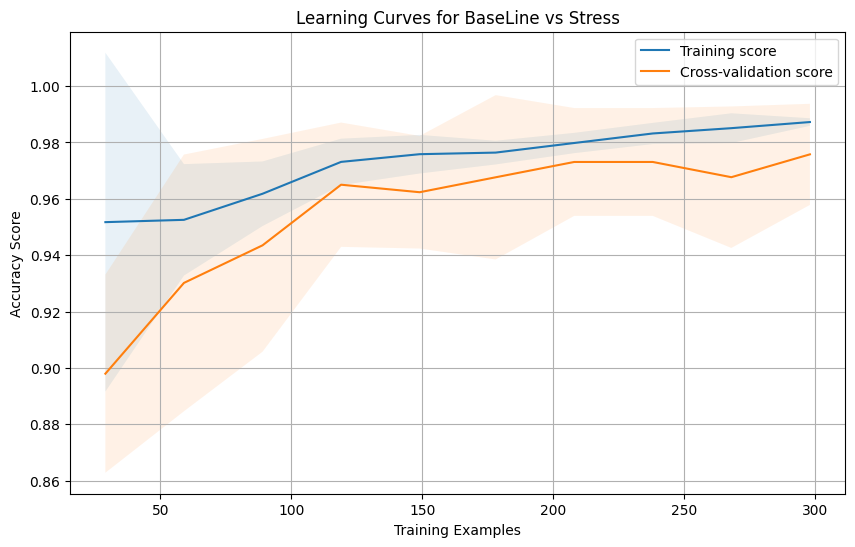

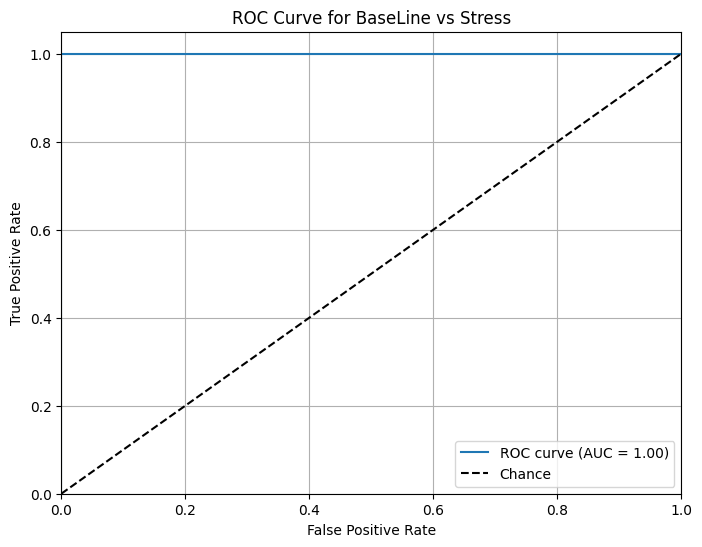

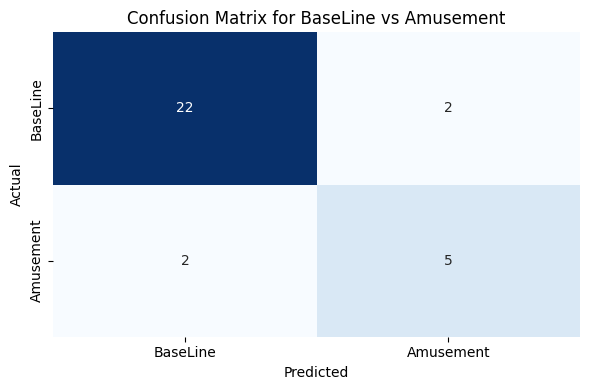


Classification Report for BaseLine vs Amusement:
               precision    recall  f1-score   support

    BaseLine       0.92      0.92      0.92        24
   Amusement       0.71      0.71      0.71         7

    accuracy                           0.87        31
   macro avg       0.82      0.82      0.82        31
weighted avg       0.87      0.87      0.87        31

Training Accuracy: 0.8419
Testing Accuracy: 0.871
Cross-Validation Accuracy: 0.7832 (+/- 0.0229)


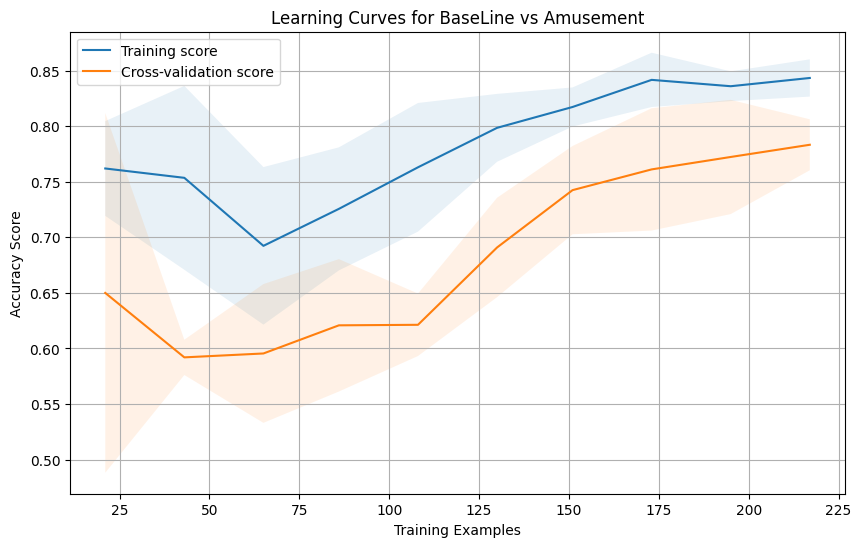

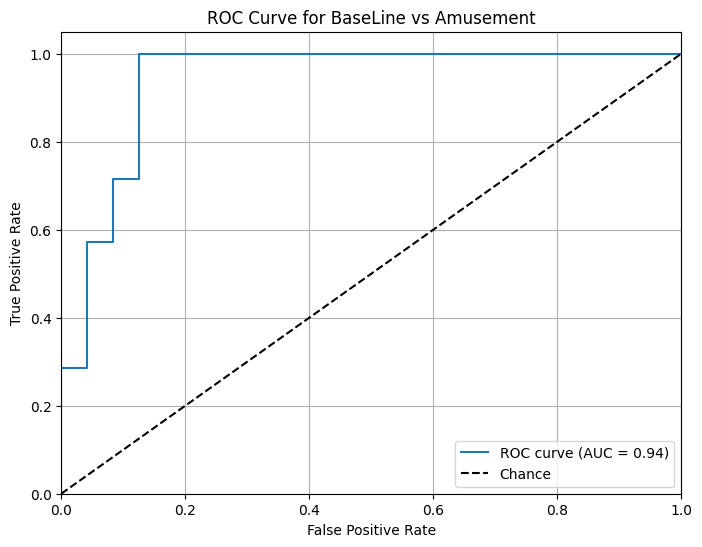

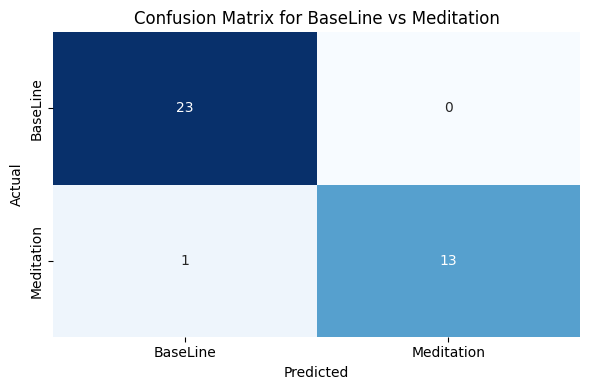


Classification Report for BaseLine vs Meditation:
               precision    recall  f1-score   support

    BaseLine       0.96      1.00      0.98        23
  Meditation       1.00      0.93      0.96        14

    accuracy                           0.97        37
   macro avg       0.98      0.96      0.97        37
weighted avg       0.97      0.97      0.97        37

Training Accuracy: 0.9699
Testing Accuracy: 0.973
Cross-Validation Accuracy: 0.9638 (+/- 0.0155)


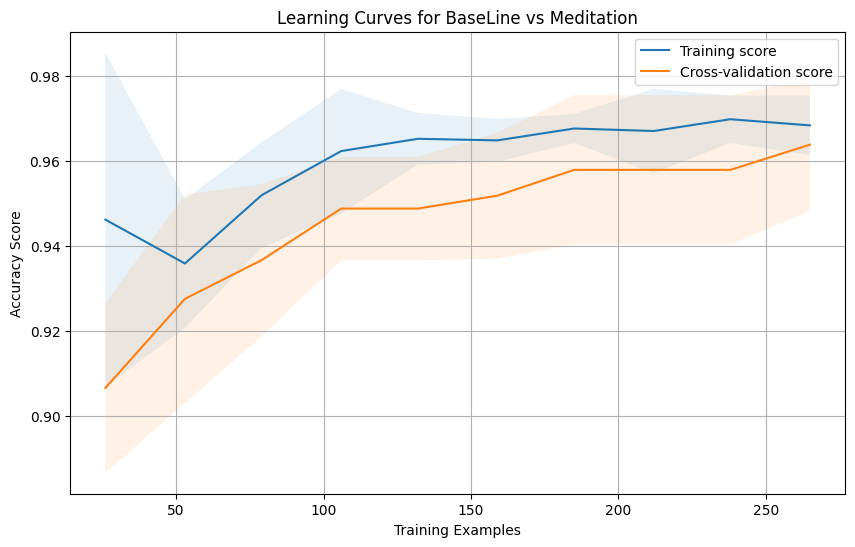

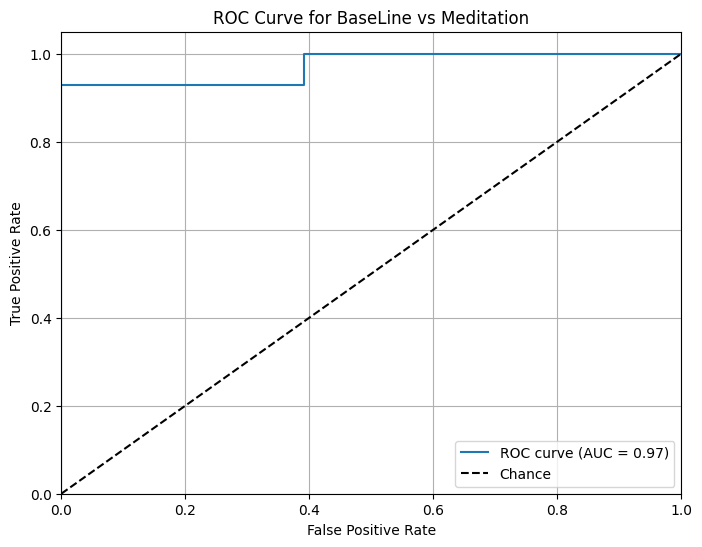

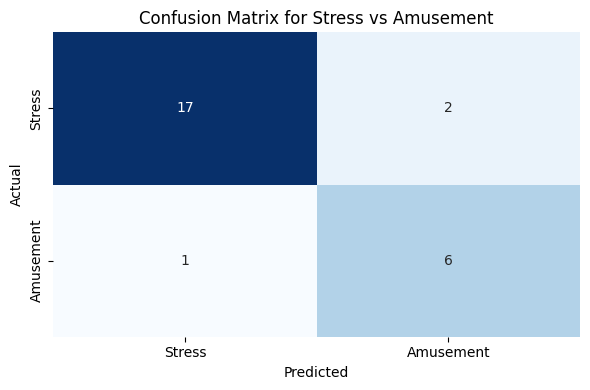


Classification Report for Stress vs Amusement:
               precision    recall  f1-score   support

      Stress       0.94      0.89      0.92        19
   Amusement       0.75      0.86      0.80         7

    accuracy                           0.88        26
   macro avg       0.85      0.88      0.86        26
weighted avg       0.89      0.88      0.89        26

Training Accuracy: 0.9526
Testing Accuracy: 0.8846
Cross-Validation Accuracy: 0.9227 (+/- 0.0416)


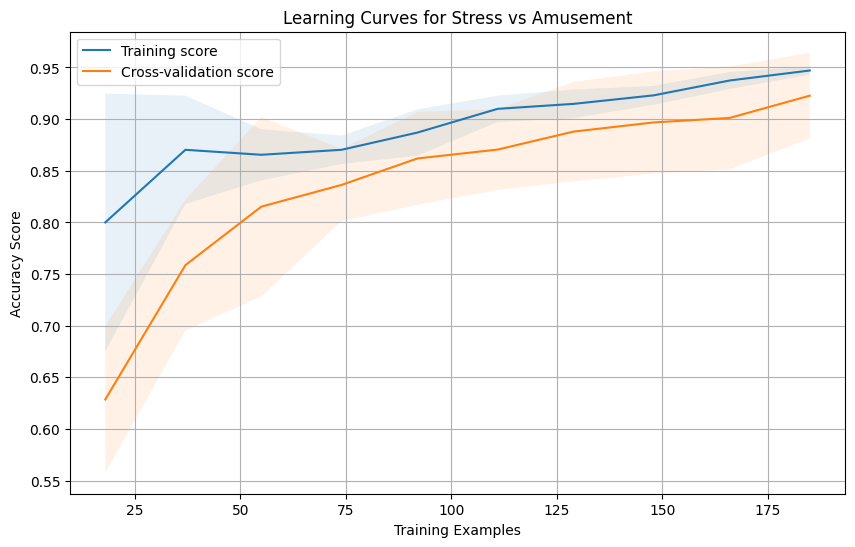

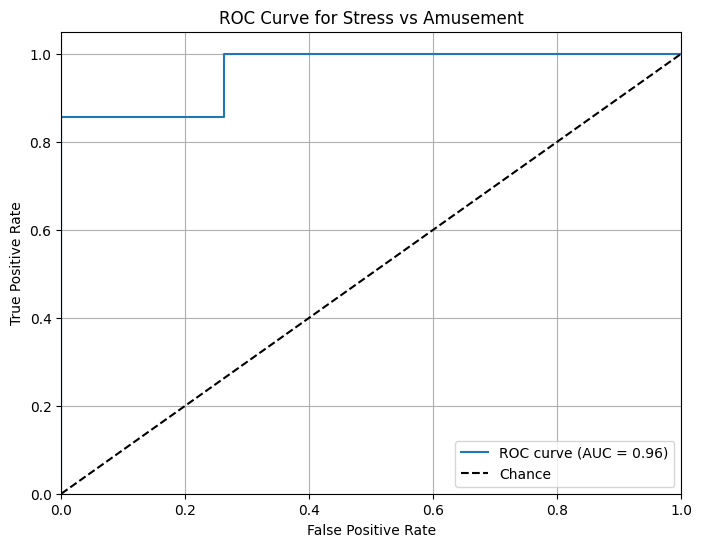

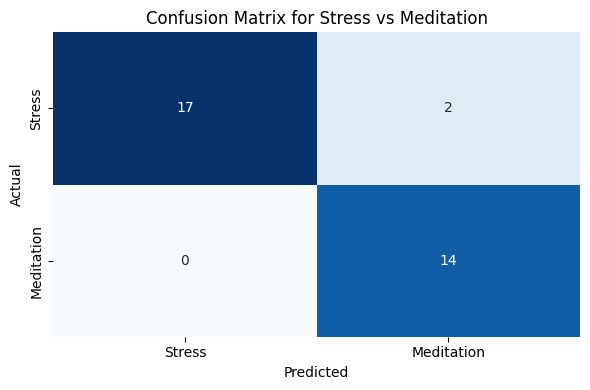


Classification Report for Stress vs Meditation:
               precision    recall  f1-score   support

      Stress       1.00      0.89      0.94        19
  Meditation       0.88      1.00      0.93        14

    accuracy                           0.94        33
   macro avg       0.94      0.95      0.94        33
weighted avg       0.95      0.94      0.94        33

Training Accuracy: 0.9931
Testing Accuracy: 0.9394
Cross-Validation Accuracy: 0.9828 (+/- 0.0189)


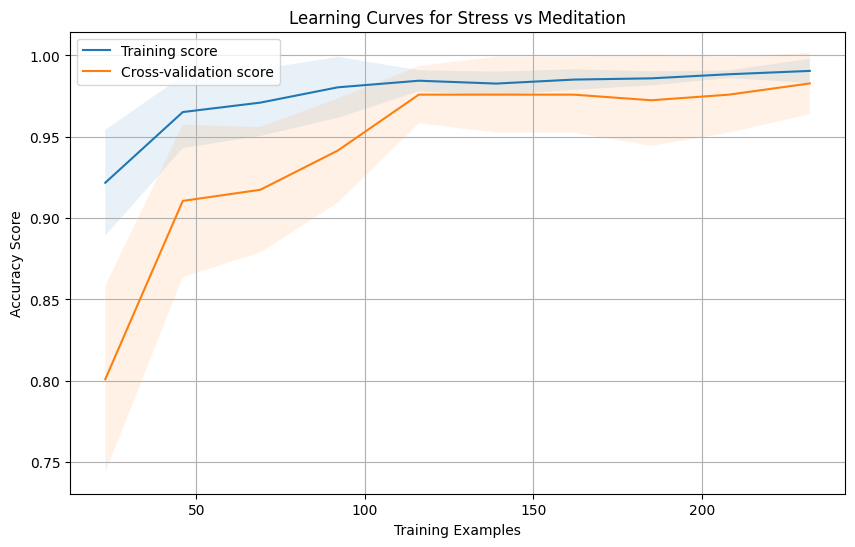

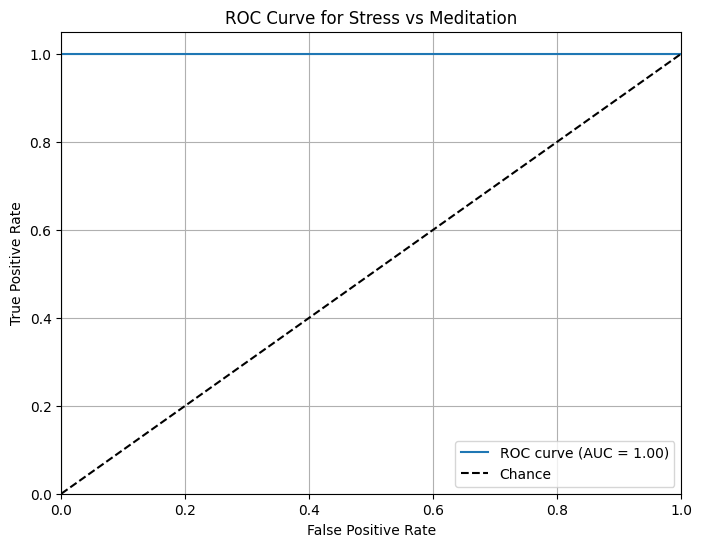

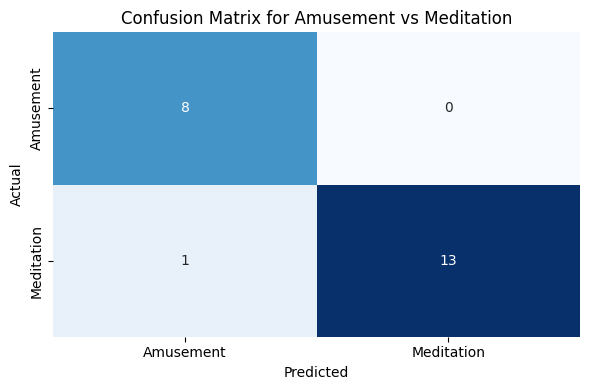


Classification Report for Amusement vs Meditation:
               precision    recall  f1-score   support

   Amusement       0.89      1.00      0.94         8
  Meditation       1.00      0.93      0.96        14

    accuracy                           0.95        22
   macro avg       0.94      0.96      0.95        22
weighted avg       0.96      0.95      0.96        22

Training Accuracy: 0.9421
Testing Accuracy: 0.9545
Cross-Validation Accuracy: 0.9105 (+/- 0.0129)


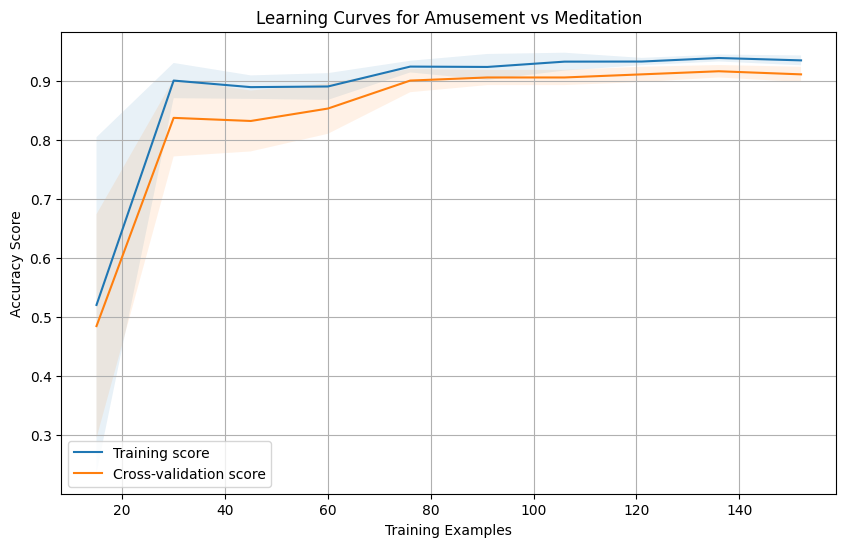

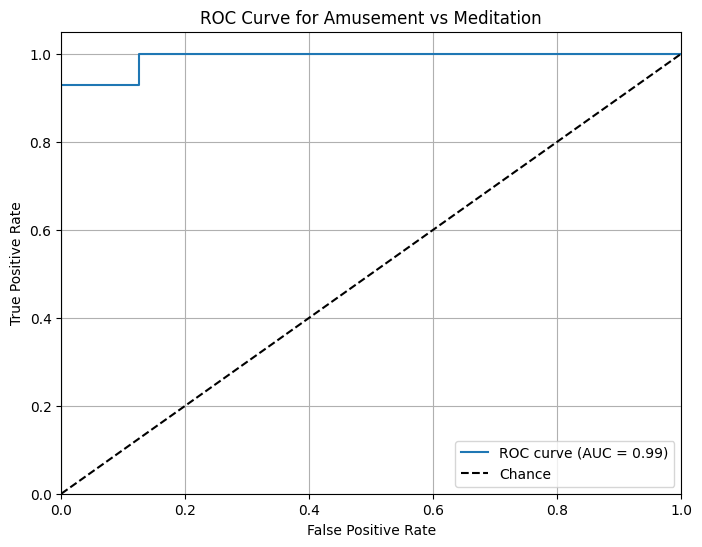

Overall Training Accuracy: 0.95
Overall Testing Accuracy: 0.93
Overall Cross-Validation Accuracy: 0.92% (+/- 0.02%)


In [ ]:
overall_train_acc = 0
overall_test_acc = 0
overall_cross_val_acc_mean = 0
overall_cross_val_acc_std = 0
models = {}
scalers = {}
confidence = {}
test_df = pd.DataFrame()

get_models('BaseLine_VS_Stress', [1, 2], ['BaseLine', 'Stress'])
get_models('BaseLine_VS_Amusement', [1, 3], ['BaseLine', 'Amusement'])
get_models('BaseLine_VS_Meditation', [1, 4], ['BaseLine', 'Meditation'])
get_models('Stress_VS_Amusement', [2, 3], ['Stress', 'Amusement'])
get_models('Stress_VS_Meditation', [2, 4], ['Stress', 'Meditation'])
get_models('Amusement_VS_Meditation', [3, 4], ['Amusement', 'Meditation'])

num_models = 6
print(f"Overall Training Accuracy: {overall_train_acc / num_models:.2f}")
print(f"Overall Testing Accuracy: {overall_test_acc / num_models:.2f}")
print(f"Overall Cross-Validation Accuracy: {overall_cross_val_acc_mean / num_models:.2f}% (+/- {overall_cross_val_acc_std / num_models:.2f}%)")

In [ ]:
def evaluate_overall_model(case):
    models_names = ['BaseLine_VS_Stress', 'BaseLine_VS_Amusement', 'BaseLine_VS_Meditation', 
                    'Stress_VS_Amusement', 'Stress_VS_Meditation', 'Amusement_VS_Meditation']
    pred_dict = {}
    
    for model_name in models_names:
        case_copy = case.copy()
        case_copy[numerical_cols] = scalers[model_name].transform([case_copy[numerical_cols]])[0]
        prob = models[model_name].predict_proba([case_copy])[0]
        pred_dict[model_name] = prob[0]
    
    predictionProbabilities = [0, 0, 0, 0]
    
    predictionProbabilities[0] = ((pred_dict[models_names[0]] * confidence[models_names[0]]) + 
                                  (pred_dict[models_names[1]] * confidence[models_names[1]]) + 
                                  (pred_dict[models_names[2]] * confidence[models_names[2]])) / 3
                                  
    predictionProbabilities[1] = (((1 - pred_dict[models_names[0]]) * confidence[models_names[0]]) + 
                                  (pred_dict[models_names[3]] * confidence[models_names[3]]) + 
                                  (pred_dict[models_names[4]] * confidence[models_names[4]])) / 3
                                  
    predictionProbabilities[2] = (((1 - pred_dict[models_names[1]]) * confidence[models_names[1]]) + 
                                  ((1 - pred_dict[models_names[3]]) * confidence[models_names[3]]) + 
                                  (pred_dict[models_names[5]] * confidence[models_names[5]])) / 3
                                  
    predictionProbabilities[3] = (((1 - pred_dict[models_names[2]]) * confidence[models_names[2]]) + 
                                  ((1 - pred_dict[models_names[4]]) * confidence[models_names[4]]) + 
                                  ((1 - pred_dict[models_names[5]]) * confidence[models_names[5]])) / 3
    
    maxProb = np.argmax(predictionProbabilities)
    
    if predictionProbabilities[maxProb] >= class_thresholds.get(['BaseLine', 'Stress', 'Amusement', 'Meditation'][maxProb], 0.5):
        return maxProb + 1
    else:
        return 5

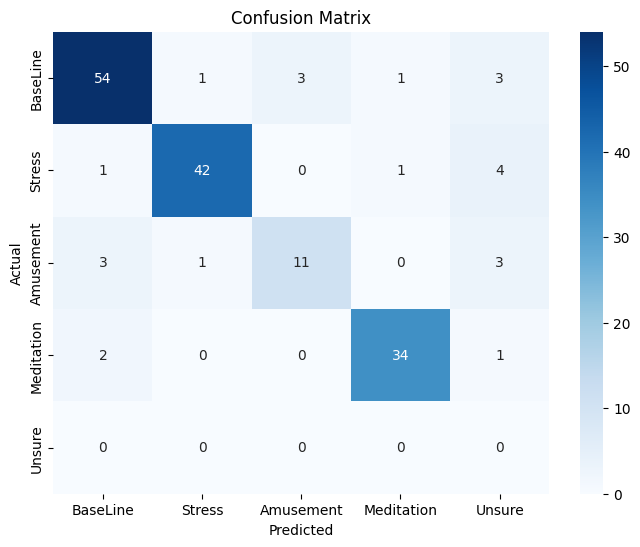

Classification Report:
              precision    recall  f1-score   support

    BaseLine       0.90      0.87      0.89        62
      Stress       0.95      0.88      0.91        48
   Amusement       0.79      0.61      0.69        18
  Meditation       0.94      0.92      0.93        37
      Unsure       0.00      0.00      0.00         0

    accuracy                           0.85       165
   macro avg       0.72      0.66      0.68       165
weighted avg       0.91      0.85      0.88       165



In [ ]:
class_thresholds = {
    'BaseLine': 0.6,
    'Stress': 0.6,
    'Amusement': 0.715,
    'Meditation': 0.6
}

predictions = []
true_labels = []
for index, row in test_df.iterrows():
    case = row.drop('Mood')
    true_label = row['Mood']
    prediction = evaluate_overall_model(case)
    predictions.append(prediction)
    true_labels.append(true_label)

target_names = ['BaseLine', 'Stress', 'Amusement', 'Meditation', 'Unsure']

cm = confusion_matrix(true_labels, predictions)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=target_names,
            yticklabels=target_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

print("Classification Report:")
print(classification_report(true_labels, predictions, target_names=target_names))

In [ ]:
import joblib
models_and_scalers_dict = {
    'models': models,
    'scalers': scalers
}
joblib.dump(models_and_scalers_dict, 'ChestPro Classifier.pkl')

## *FullScope Model*

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc

In [ ]:
df = pd.read_parquet("final_wesad_data_features.parquet")

categorical_cols = ['Gender', 'Drink Coffee Today', 'Do Sports Today', 
                    'Smoker', 'Feel Ill Today', 'Accurate Data']
numerical_cols = [col for col in df.columns if col not in categorical_cols and col != 'Mood']

In [ ]:
df

,Chest Acc X mean,Chest Acc X std,Chest Acc X min,Chest Acc X max,Chest Acc X range,Chest Acc X slope,Chest Acc X rate_of_change,Chest Acc Y mean,Chest Acc Y std,Chest Acc Y min,...,Age,Height,Weight,Gender,Drink Coffee Today,Do Sports Today,Smoker,Feel Ill Today,Accurate Data,Mood
0,0.759085,0.127055,0.5390,1.1454,0.6064,-0.006226,0.001433,-0.130697,0.042169,-0.2778,...,27.0,180.0,75.0,1,-1,-1,-1,-1,-1,1
1,0.636856,0.066817,0.5390,1.1454,0.6064,-0.001683,0.001377,-0.111829,0.015888,-0.2076,...,27.0,180.0,75.0,0,0,-1,-1,-1,0,1
4,0.648417,0.076594,0.5770,0.9350,0.3580,0.001980,0.001355,-0.110911,0.042728,-0.2896,...,27.0,175.0,80.0,0,0,-1,0,-1,0,1
5,0.660468,0.073354,0.5770,0.9350,0.3580,-0.000078,0.001340,-0.086645,0.051961,-0.2896,...,27.0,175.0,80.0,1,0,0,-1,-1,0,1
8,0.640738,0.004852,0.6058,0.6862,0.0804,-0.000006,0.001280,-0.064341,0.006075,-0.1196,...,27.0,180.0,80.0,1,0,0,0,0,-1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1215,0.657293,0.038612,0.5962,0.9574,0.3612,-0.000795,0.001351,0.014019,0.011355,-0.0882,...,27.0,186.0,75.0,1,-1,-1,-1,0,-1,4
1217,0.638245,0.003342,0.6214,0.6534,0.0320,0.000039,0.001291,0.012428,0.002619,0.0024,...,27.0,186.0,75.0,1,-1,0,-1,0,-1,4
1218,0.641019,0.004597,0.6238,0.6642,0.0404,0.000150,0.001290,0.012726,0.002670,0.0026,...,28.0,186.0,83.0,0,0,0,-1,-1,-1,4
1219,0.643368,0.004199,0.6250,0.6642,0.0392,0.000030,0.001296,0.012717,0.002700,0.0026,...,27.0,180.0,83.0,0,-1,-1,-1,0,0,4


In [ ]:
df = pd.get_dummies(df, columns=categorical_cols).astype(np.float64)
df['Mood'] = df['Mood'].map(int)
df

,Chest Acc X mean,Chest Acc X std,Chest Acc X min,Chest Acc X max,Chest Acc X range,Chest Acc X slope,Chest Acc X rate_of_change,Chest Acc Y mean,Chest Acc Y std,Chest Acc Y min,...,Do Sports Today_1,Smoker_-1,Smoker_0,Smoker_1,Feel Ill Today_-1,Feel Ill Today_0,Feel Ill Today_1,Accurate Data_-1,Accurate Data_0,Accurate Data_1
0,0.759085,0.127055,0.5390,1.1454,0.6064,-0.006226,0.001433,-0.130697,0.042169,-0.2778,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,0.636856,0.066817,0.5390,1.1454,0.6064,-0.001683,0.001377,-0.111829,0.015888,-0.2076,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,0.648417,0.076594,0.5770,0.9350,0.3580,0.001980,0.001355,-0.110911,0.042728,-0.2896,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
5,0.660468,0.073354,0.5770,0.9350,0.3580,-0.000078,0.001340,-0.086645,0.051961,-0.2896,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
8,0.640738,0.004852,0.6058,0.6862,0.0804,-0.000006,0.001280,-0.064341,0.006075,-0.1196,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1215,0.657293,0.038612,0.5962,0.9574,0.3612,-0.000795,0.001351,0.014019,0.011355,-0.0882,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1217,0.638245,0.003342,0.6214,0.6534,0.0320,0.000039,0.001291,0.012428,0.002619,0.0024,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1218,0.641019,0.004597,0.6238,0.6642,0.0404,0.000150,0.001290,0.012726,0.002670,0.0026,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1219,0.643368,0.004199,0.6250,0.6642,0.0392,0.000030,0.001296,0.012717,0.002700,0.0026,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [ ]:
def calc_model_acc(model, X_train, X_test, y_train, y_test, print_it = True):
    train_acc = round(model.score(X_train, y_train), 4)
    test_acc = round(model.score(X_test, y_test), 4)
    cv_scores = cross_val_score(model, X_train, y_train, cv=5)
    cross_val_acc_mean = round(cv_scores.mean(), 4)
    cross_val_acc_std = round(cv_scores.std(), 4)
    
    if print_it:
        print(f"Training Accuracy: {train_acc}")
        print(f"Testing Accuracy: {test_acc}")
        print(f"Cross-Validation Accuracy: {cross_val_acc_mean} (+/- {cross_val_acc_std})")
    else:
        return train_acc, test_acc, cross_val_acc_mean, cross_val_acc_std

In [ ]:
def eval_model(model, X_train = None, y_train = None, X_test = None, y_test = None, classes_names = None):
    y_pred = model.predict(X_test)
    
    cm = confusion_matrix(y_test, y_pred)
    cr = classification_report(y_test, y_pred, target_names=classes_names)
    
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=classes_names,
                yticklabels=classes_names)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix for {classes_names[0]} vs {classes_names[1]}')
    plt.tight_layout()
    plt.show()
    
    print(f"\nClassification Report for {classes_names[0]} vs {classes_names[1]}:\n", cr)
    
    if not X_train.empty:
        calc_model_acc(model, X_train, X_test, y_train, y_test)

In [ ]:
def plot_learning_curve(estimator, X, y, filename, classes_names):
    train_sizes, train_scores, val_scores = learning_curve(
        estimator, X, y, cv=5, n_jobs=-1, shuffle=True, train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy'
    )
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)
    val_std = np.std(val_scores, axis=1)
    
    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_mean, label='Training score')
    plt.plot(train_sizes, val_mean, label='Cross-validation score')
    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1)
    plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.1)
    plt.xlabel('Training Examples')
    plt.ylabel('Accuracy Score')
    plt.title(f'Learning Curves for {classes_names[0]} vs {classes_names[1]}')
    plt.legend(loc='best')
    plt.grid(True)
    plt.savefig(filename)
    plt.show()

In [ ]:
def plot_roc_curve(model, X_test, y_test, classes_names):
    y_score = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', label='Chance')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {classes_names[0]} vs {classes_names[1]}')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

In [ ]:
def create_and_train_model(Moods, names, prams):
    model_data = df[df['Mood'].isin(Moods)].copy()
    model_data = model_data.sample(frac=1, random_state=42).reset_index(drop=True)
    
    
    mapping = {Moods[0]: 0, Moods[1]: 1}
    model_data_Y = model_data['Mood'].map(mapping)
    model_data_X = model_data.drop('Mood', axis=1)

    
    X_train, X_test, y_train, y_test = train_test_split(model_data_X, model_data_Y, test_size=0.1, random_state=42, stratify=model_data_Y)
    scaler = StandardScaler()
    X_train[numerical_cols] = scaler.fit_transform(X_train[numerical_cols])
    original_X_test = X_test.copy()
    X_test[numerical_cols] = scaler.transform(X_test[numerical_cols])

    if prams is None:
        prams = {'penalty': 'l2', 'solver': 'saga', 'C': 1, 'max_iter': 5}
    model = LogisticRegression(**prams)
    model.fit(X_train, y_train)

    eval_model(model, X_train, y_train, X_test, y_test, names)
    plot_learning_curve(model, X_train, y_train, f'{Moods[0]} vs {Moods[1]} Learning Curve.png', names)
    plot_roc_curve(model, X_test, y_test, names)

    return model, scaler, X_train, original_X_test, X_test, y_train, y_test

In [ ]:
def get_models(model_name, data_moods, label_pair, params=None):
    global overall_train_acc, overall_test_acc, overall_cross_val_acc_mean, overall_cross_val_acc_std, test_df

    model, scaler, X_train, original_X_test, X_test, y_train, y_test = create_and_train_model(data_moods, label_pair, params)
    train_acc, test_acc, cross_val_acc_mean, cross_val_acc_std = calc_model_acc(model, X_train, X_test, y_train, y_test, print_it=False)

    models[model_name] = model
    scalers[model_name] = scaler
    confidence[model_name] = cross_val_acc_mean

    y_test_remapped = pd.Series(y_test).map({0: data_moods[0], 1: data_moods[1]})

    test_data = pd.concat([pd.DataFrame(original_X_test).reset_index(drop=True), pd.DataFrame(y_test_remapped).reset_index(drop=True)], axis=1)
    test_df = pd.concat([test_df, test_data], ignore_index=True).drop_duplicates()

    overall_train_acc += train_acc
    overall_test_acc += test_acc
    overall_cross_val_acc_mean += cross_val_acc_mean
    overall_cross_val_acc_std += cross_val_acc_std

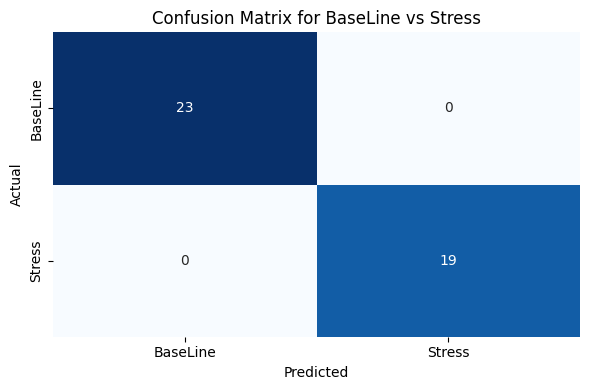


Classification Report for BaseLine vs Stress:
               precision    recall  f1-score   support

    BaseLine       1.00      1.00      1.00        23
      Stress       1.00      1.00      1.00        19

    accuracy                           1.00        42
   macro avg       1.00      1.00      1.00        42
weighted avg       1.00      1.00      1.00        42

Training Accuracy: 0.9866
Testing Accuracy: 1.0
Cross-Validation Accuracy: 0.9785 (+/- 0.0219)


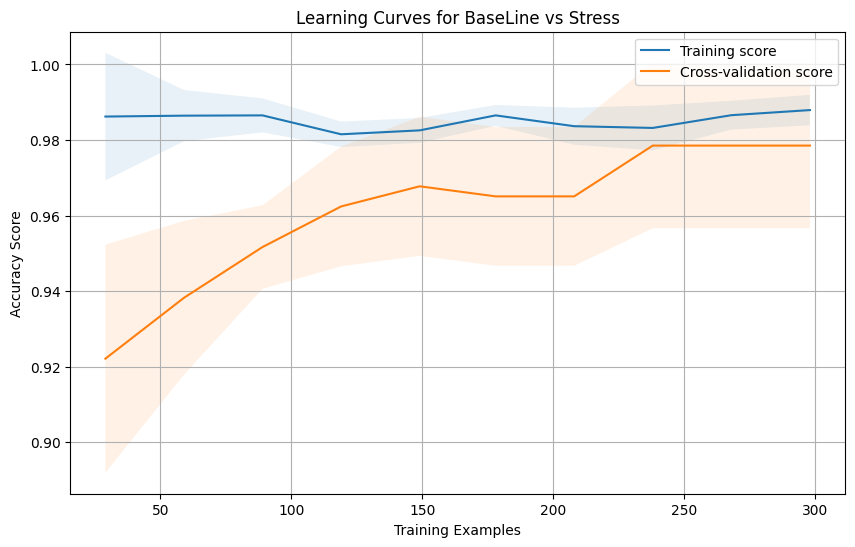

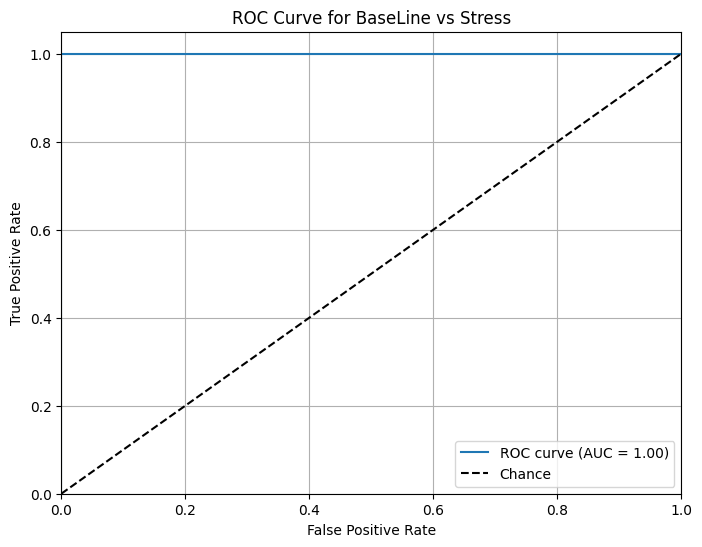

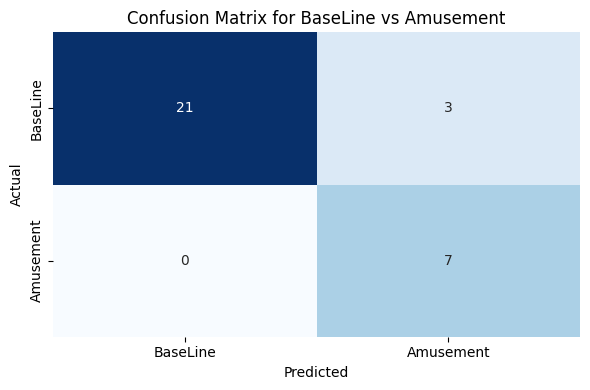


Classification Report for BaseLine vs Amusement:
               precision    recall  f1-score   support

    BaseLine       1.00      0.88      0.93        24
   Amusement       0.70      1.00      0.82         7

    accuracy                           0.90        31
   macro avg       0.85      0.94      0.88        31
weighted avg       0.93      0.90      0.91        31

Training Accuracy: 0.9191
Testing Accuracy: 0.9032
Cross-Validation Accuracy: 0.8454 (+/- 0.0286)


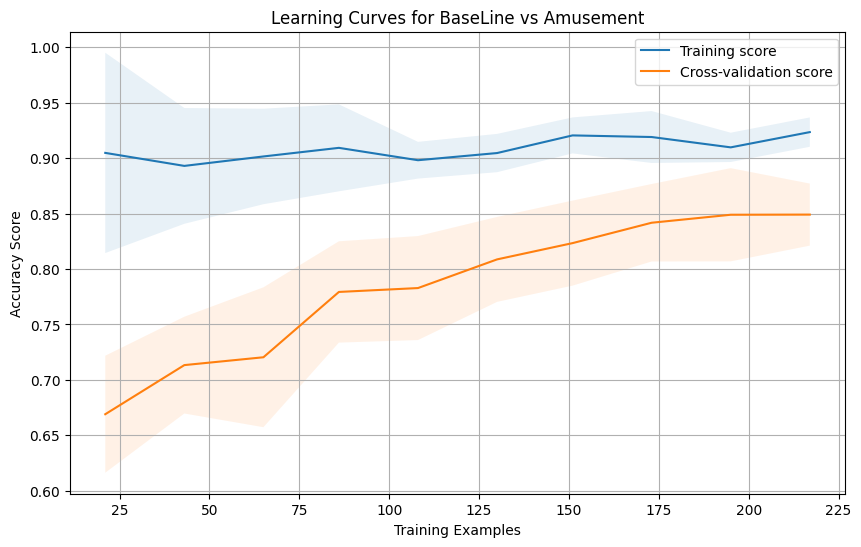

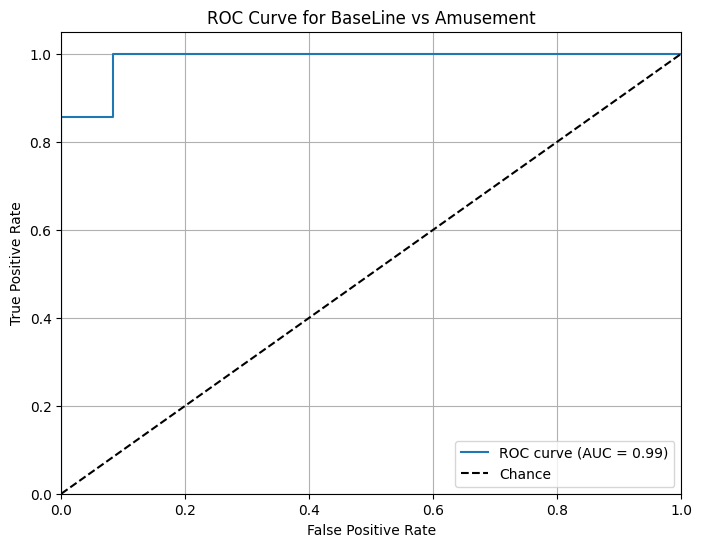

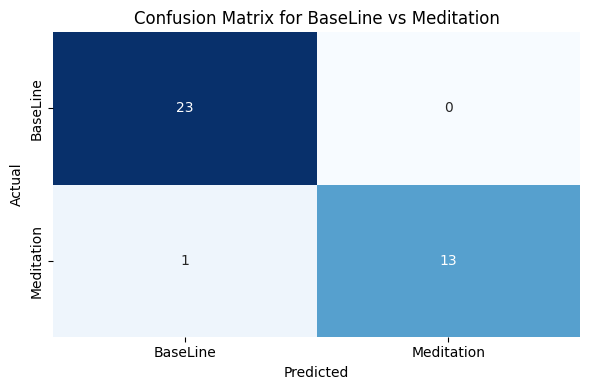


Classification Report for BaseLine vs Meditation:
               precision    recall  f1-score   support

    BaseLine       0.96      1.00      0.98        23
  Meditation       1.00      0.93      0.96        14

    accuracy                           0.97        37
   macro avg       0.98      0.96      0.97        37
weighted avg       0.97      0.97      0.97        37

Training Accuracy: 0.9639
Testing Accuracy: 0.973
Cross-Validation Accuracy: 0.9457 (+/- 0.0207)


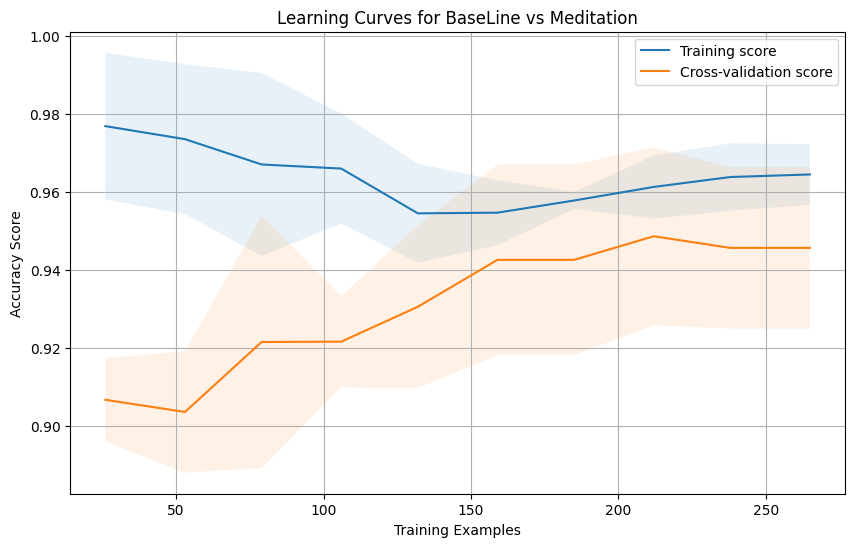

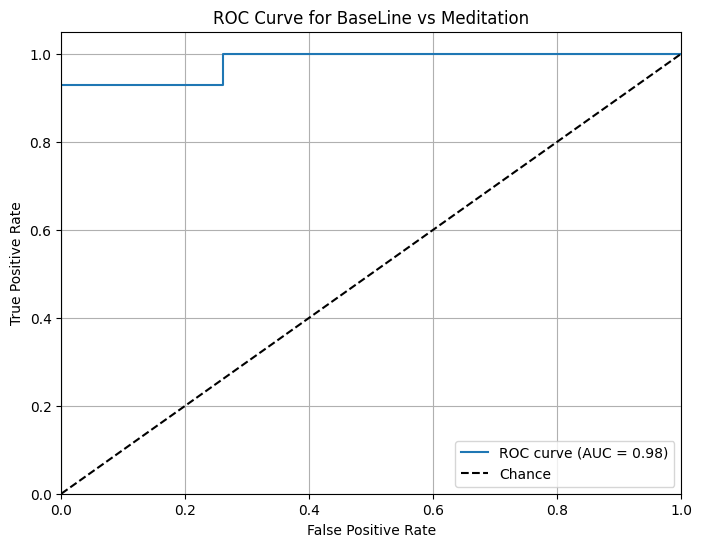

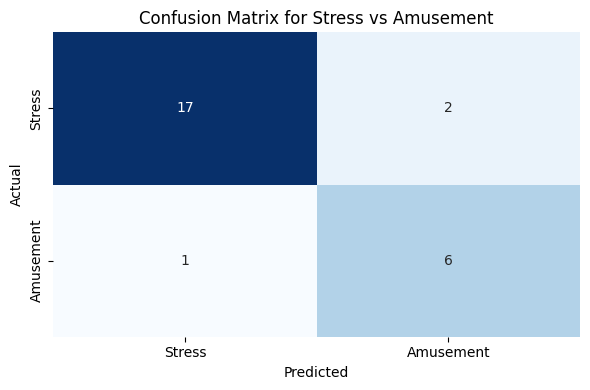


Classification Report for Stress vs Amusement:
               precision    recall  f1-score   support

      Stress       0.94      0.89      0.92        19
   Amusement       0.75      0.86      0.80         7

    accuracy                           0.88        26
   macro avg       0.85      0.88      0.86        26
weighted avg       0.89      0.88      0.89        26

Training Accuracy: 0.944
Testing Accuracy: 0.8846
Cross-Validation Accuracy: 0.9181 (+/- 0.0287)


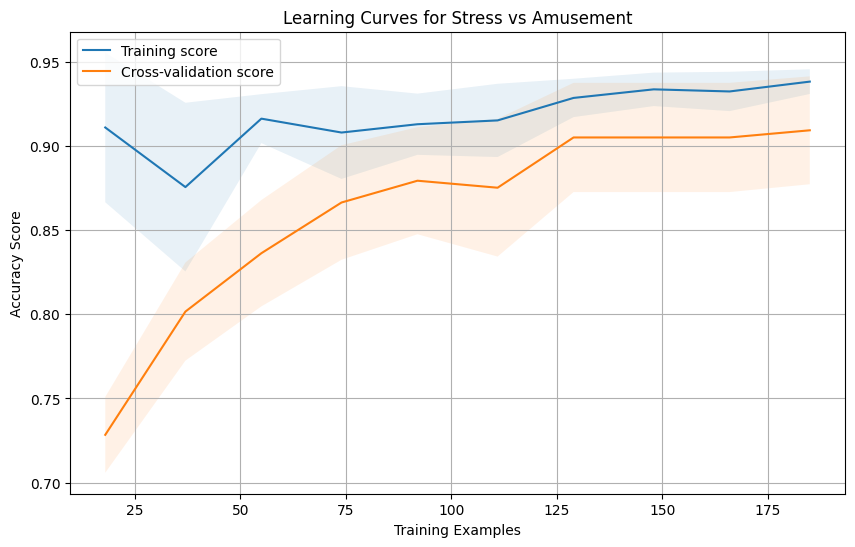

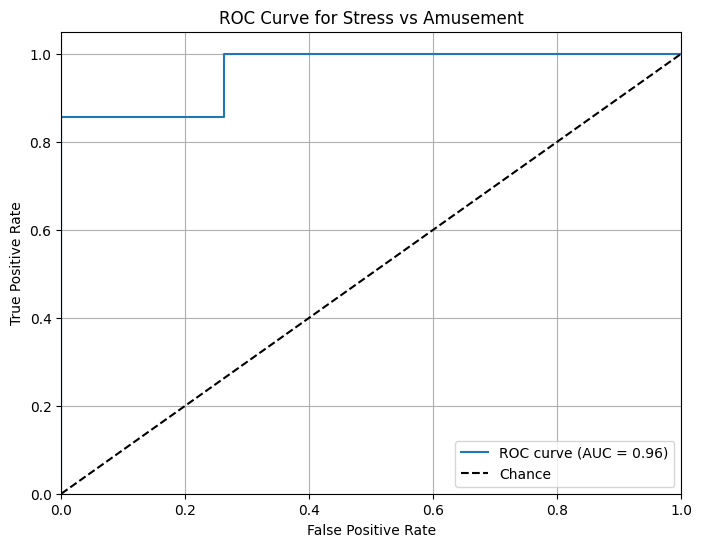

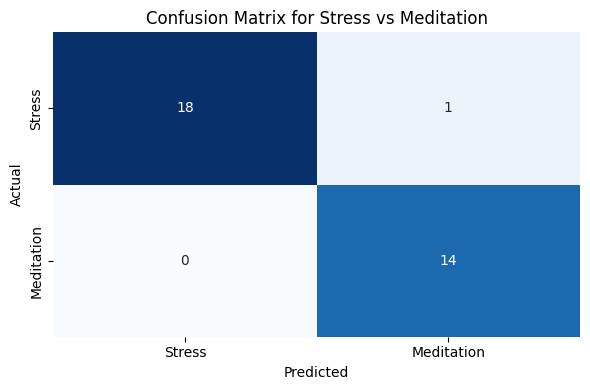


Classification Report for Stress vs Meditation:
               precision    recall  f1-score   support

      Stress       1.00      0.95      0.97        19
  Meditation       0.93      1.00      0.97        14

    accuracy                           0.97        33
   macro avg       0.97      0.97      0.97        33
weighted avg       0.97      0.97      0.97        33

Training Accuracy: 0.9897
Testing Accuracy: 0.9697
Cross-Validation Accuracy: 0.9759 (+/- 0.0176)


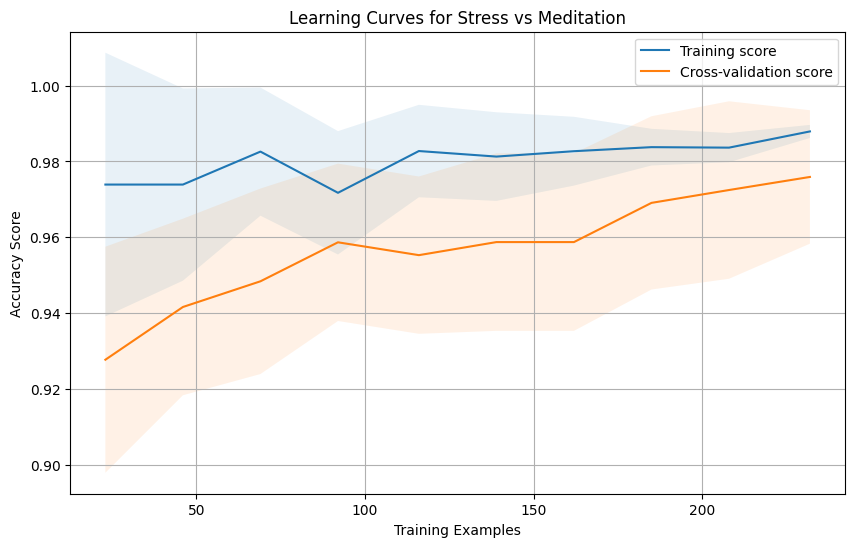

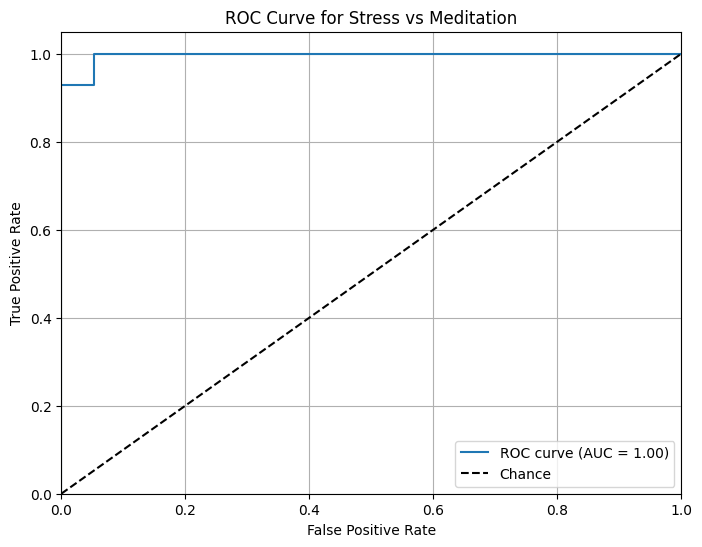

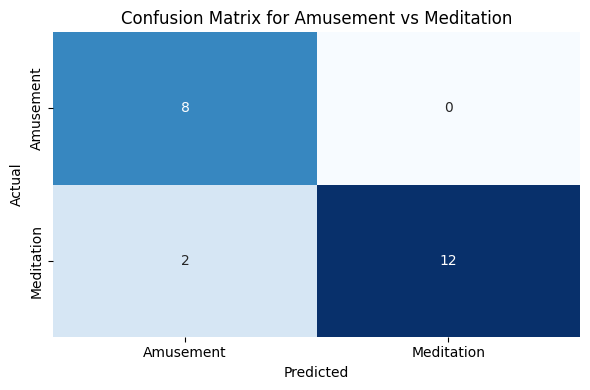


Classification Report for Amusement vs Meditation:
               precision    recall  f1-score   support

   Amusement       0.80      1.00      0.89         8
  Meditation       1.00      0.86      0.92        14

    accuracy                           0.91        22
   macro avg       0.90      0.93      0.91        22
weighted avg       0.93      0.91      0.91        22

Training Accuracy: 0.9211
Testing Accuracy: 0.9091
Cross-Validation Accuracy: 0.8947 (+/- 0.0577)


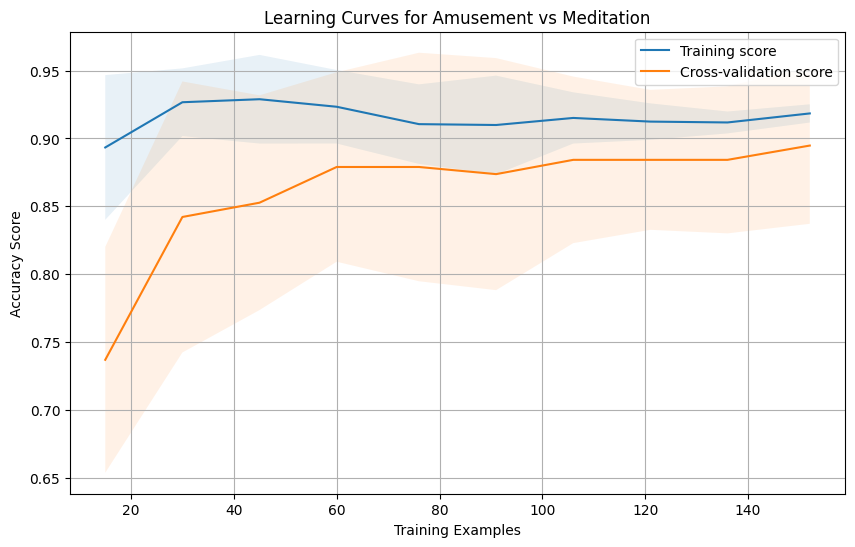

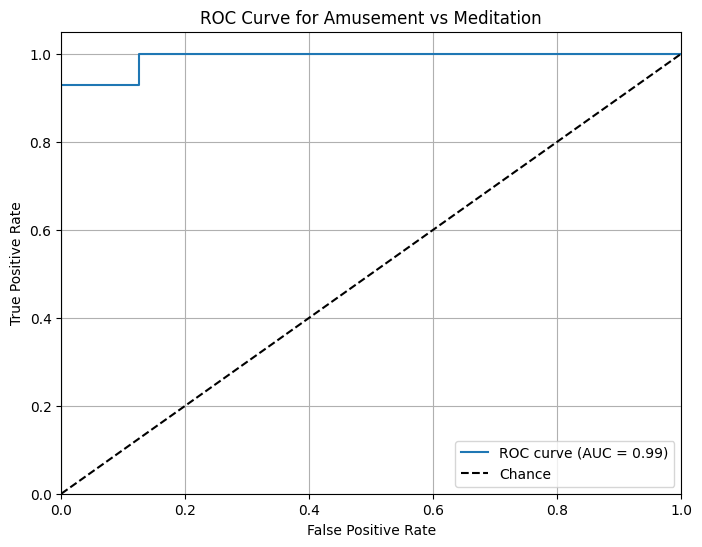

Overall Training Accuracy: 0.95
Overall Testing Accuracy: 0.94
Overall Cross-Validation Accuracy: 0.93% (+/- 0.03%)


In [ ]:
overall_train_acc = 0
overall_test_acc = 0
overall_cross_val_acc_mean = 0
overall_cross_val_acc_std = 0
models = {}
scalers = {}
confidence = {}
test_df = pd.DataFrame()

get_models('BaseLine_VS_Stress', [1, 2], ['BaseLine', 'Stress'], {'penalty': 'l2', 'solver': 'liblinear', 'C': 0.008, 'max_iter': 20000, 'class_weight': 'balanced'})
get_models('BaseLine_VS_Amusement', [1, 3], ['BaseLine', 'Amusement'], {'penalty': 'l2', 'solver': 'liblinear', 'C': 0.008, 'max_iter': 20000, 'class_weight': 'balanced'})
get_models('BaseLine_VS_Meditation', [1, 4], ['BaseLine', 'Meditation'], {'penalty': 'l2', 'solver': 'liblinear', 'C': 0.008, 'max_iter': 20000, 'class_weight': 'balanced'})
get_models('Stress_VS_Amusement', [2, 3], ['Stress', 'Amusement'], {'penalty': 'l2', 'solver': 'liblinear', 'C': 0.008, 'max_iter': 20000, 'class_weight': 'balanced'})
get_models('Stress_VS_Meditation', [2, 4], ['Stress', 'Meditation'], {'penalty': 'l2', 'solver': 'liblinear', 'C': 0.008, 'max_iter': 20000, 'class_weight': 'balanced'})
get_models('Amusement_VS_Meditation', [3, 4], ['Amusement', 'Meditation'], {'penalty': 'l2', 'solver': 'liblinear', 'C': 0.001, 'max_iter': 20000, 'class_weight': 'balanced'})

num_models = 6
print(f"Overall Training Accuracy: {overall_train_acc / num_models:.2f}")
print(f"Overall Testing Accuracy: {overall_test_acc / num_models:.2f}")
print(f"Overall Cross-Validation Accuracy: {overall_cross_val_acc_mean / num_models:.2f}% (+/- {overall_cross_val_acc_std / num_models:.2f}%)")

In [ ]:
def evaluate_overall_model(case):
    models_names = ['BaseLine_VS_Stress', 'BaseLine_VS_Amusement', 'BaseLine_VS_Meditation', 
                    'Stress_VS_Amusement', 'Stress_VS_Meditation', 'Amusement_VS_Meditation']
    pred_dict = {}
    
    for model_name in models_names:
        case_copy = case.copy()
        case_copy[numerical_cols] = scalers[model_name].transform([case_copy[numerical_cols]])[0]
        prob = models[model_name].predict_proba([case_copy])[0]
        pred_dict[model_name] = prob[0]
    
    predictionProbabilities = [0, 0, 0, 0]
    
    predictionProbabilities[0] = ((pred_dict[models_names[0]] * confidence[models_names[0]]) + 
                                  (pred_dict[models_names[1]] * confidence[models_names[1]]) + 
                                  (pred_dict[models_names[2]] * confidence[models_names[2]])) / 3
                                  
    predictionProbabilities[1] = (((1 - pred_dict[models_names[0]]) * confidence[models_names[0]]) + 
                                  (pred_dict[models_names[3]] * confidence[models_names[3]]) + 
                                  (pred_dict[models_names[4]] * confidence[models_names[4]])) / 3
                                  
    predictionProbabilities[2] = (((1 - pred_dict[models_names[1]]) * confidence[models_names[1]]) + 
                                  ((1 - pred_dict[models_names[3]]) * confidence[models_names[3]]) + 
                                  (pred_dict[models_names[5]] * confidence[models_names[5]])) / 3
                                  
    predictionProbabilities[3] = (((1 - pred_dict[models_names[2]]) * confidence[models_names[2]]) + 
                                  ((1 - pred_dict[models_names[4]]) * confidence[models_names[4]]) + 
                                  ((1 - pred_dict[models_names[5]]) * confidence[models_names[5]])) / 3
    
    maxProb = np.argmax(predictionProbabilities)
    
    if predictionProbabilities[maxProb] >= class_thresholds.get(['BaseLine', 'Stress', 'Amusement', 'Meditation'][maxProb], 0.5):
        return maxProb + 1
    else:
        return 5

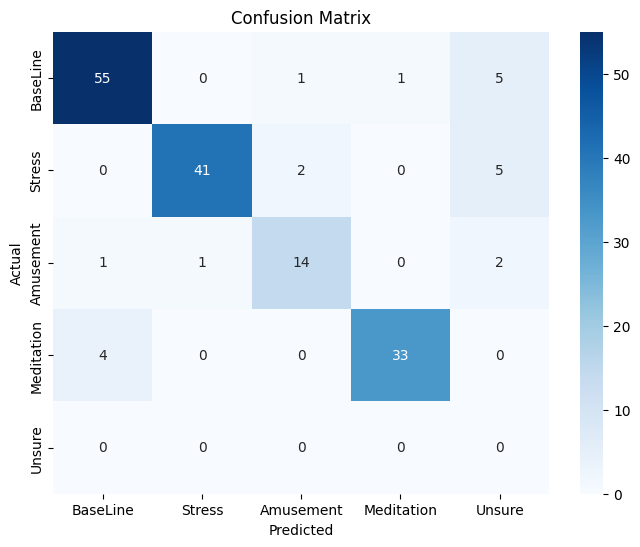

Classification Report:
              precision    recall  f1-score   support

    BaseLine       0.92      0.89      0.90        62
      Stress       0.98      0.85      0.91        48
   Amusement       0.82      0.78      0.80        18
  Meditation       0.97      0.89      0.93        37
      Unsure       0.00      0.00      0.00         0

    accuracy                           0.87       165
   macro avg       0.74      0.68      0.71       165
weighted avg       0.94      0.87      0.90       165



In [ ]:
class_thresholds = {
    'BaseLine': 0.65,
    'Stress': 0.65,
    'Amusement': 0.65,
    'Meditation': 0.65
}

predictions = []
true_labels = []
for index, row in test_df.iterrows():
    case = row.drop('Mood')
    true_label = row['Mood']
    prediction = evaluate_overall_model(case)
    predictions.append(prediction)
    true_labels.append(true_label)

target_names = ['BaseLine', 'Stress', 'Amusement', 'Meditation', 'Unsure']

cm = confusion_matrix(true_labels, predictions)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=target_names,
            yticklabels=target_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

print("Classification Report:")
print(classification_report(true_labels, predictions, target_names=target_names))

In [ ]:
import joblib
models_and_scalers_dict = {
    'models': models,
    'scalers': scalers
}
joblib.dump(models_and_scalers_dict, 'FullScope Model.pkl')

# 📚 Project Acknowledgment

This project was developed as part of the **Biomedical Signal Processing** course at the **Faculty of Engineering, Helwan University** – **Biomedical Engineering Department**, proudly presented by **Group 12**.

👥 **Team Members**:  
- [Hebatullah ElGazoly](https://www.linkedin.com/in/hebatullah-elgazoly-308ab2243/)  
- [Mohamed Sameh](https://www.linkedin.com/in/muhamedsameh/)

🧠 **Under the Supervision of**:  
- [Prof. Ibrahim Sadek](https://www.linkedin.com/in/ibrahim-sadek-78830075/)

We welcome your thoughts, questions, and feedback!  
💬 Feel free to leave a comment or connect with us on LinkedIn.

---

## 🛠️ Source Code & Deployment

The full notebook, models, and deployment are available on our GitHub repository:  
👉 [Check it out on GitHub](hhttps://github.com/mohamedsameh108/Detect-Stress-and-Mood-Changes-Using-Vital-Signs)

> ⚠️ Warning: Entering this repo might cause unexpected curiosity, caffeine consumption, and deep learning rabbit holes. Explore at your own risk (and fun)! ☕🤖
